## 命名规则
rmse:
feature_method+model

pic:
feature_method+model

In [1]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# from pylab import *
#Feature Selection Metrics
from statsmodels.tsa import stattools
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from minepy import MINE
from minepy import cstats

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
# Model
from sklearn.linear_model import Ridge, Lasso,LinearRegression
from sklearn.linear_model import LogisticRegression,SGDRegressor,TheilSenRegressor
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest
import xgboost
from xgboost.sklearn import XGBRegressor
from xgboost import plot_importance
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline

import copy

In [2]:
air = pd.read_excel(r'./dataset/AirQualityUCI/AirQuality.xlsx',engine='openpyxl',parse_dates=['Date'],index_col = 'Date')
air.drop(columns = air.columns[-2:],axis=1,inplace=True)

df = air.resample('D').sum()
df['C6H6(GT)_1'] = df['C6H6(GT)'].shift(-1)
df.dropna(inplace=True)

In [3]:
df.shape

(390, 14)

In [4]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

In [5]:
def Train_Valid_Test(data,train_percent,valid_percent,test_percent):
    train_len = int(data.shape[0]*train_percent)
    valid_len = int(data.shape[0]*(train_percent + valid_percent)) 
    train_df = data.iloc[:train_len,:]
    valid_df = data.iloc[train_len:valid_len,:]
    test_df = data.iloc[valid_len:,:]
    return train_df,valid_df,test_df

def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [6]:
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

### Lag the feature based on the order of feature in data.columns
def lag_feature_df(max_lag,data,target):
    # Store each feature's dataframe:
    X = pd.DataFrame()
    X_col = list(data.columns)
    X_col.remove(target)
    feature_range = range(len(X_col))
    for idx,col in enumerate(X_col):
        for j in range(max_lag):
            X[col+'_lag_'+str(j+1)] = data[col].shift(j)
    X[target] = data[target].copy()
    X.dropna(inplace=True)
    return X

In [7]:
df_lag = lag_feature_df(30,df,'C6H6(GT)_1')

train_lag,valid_lag,test_lag = Train_Valid_Test(df_lag,0.7,0.1,0.2)
## Lagging
X_train_lag,Y_train_lag = segment(train_lag,'C6H6(GT)_1')
X_valid_lag,Y_valid_lag = segment(valid_lag,'C6H6(GT)_1')
X_test_lag,Y_test_lag = segment(test_lag,'C6H6(GT)_1')

train_no,valid_no,test_no = Train_Valid_Test(df.loc[df_lag.index],0.7,0.1,0.2)

## No lagging
X_train_no,Y_train_no = segment(train_no,'C6H6(GT)_1')
X_valid_no,Y_valid_no = segment(test_no,'C6H6(GT)_1')
X_test_no,Y_test_no = segment(test_no,'C6H6(GT)_1')

In [8]:
X_arr = X_train_lag.values

In [9]:
X_train_lag

,CO(GT)_lag_1,CO(GT)_lag_2,CO(GT)_lag_3,CO(GT)_lag_4,CO(GT)_lag_5,CO(GT)_lag_6,CO(GT)_lag_7,CO(GT)_lag_8,CO(GT)_lag_9,CO(GT)_lag_10,...,AH_lag_21,AH_lag_22,AH_lag_23,AH_lag_24,AH_lag_25,AH_lag_26,AH_lag_27,AH_lag_28,AH_lag_29,AH_lag_30
Date,,,,,,,,,,,,,,,,,,,,,
2004-04-08,-140.7,39.3,53.6,-1961.4,-4800.0,-2784.4,-135.6,61.2,46.2,-149.4,...,22.175165,19.824028,19.318076,20.904509,22.656609,20.392177,17.575057,15.914458,18.618427,4.593759
2004-04-09,58.9,-140.7,39.3,53.6,-1961.4,-4800.0,-2784.4,-135.6,61.2,46.2,...,22.296051,22.175165,19.824028,19.318076,20.904509,22.656609,20.392177,17.575057,15.914458,18.618427
2004-04-10,42.1,58.9,-140.7,39.3,53.6,-1961.4,-4800.0,-2784.4,-135.6,61.2,...,24.151756,22.296051,22.175165,19.824028,19.318076,20.904509,22.656609,20.392177,17.575057,15.914458
2004-04-11,-172.3,42.1,58.9,-140.7,39.3,53.6,-1961.4,-4800.0,-2784.4,-135.6,...,20.590156,24.151756,22.296051,22.175165,19.824028,19.318076,20.904509,22.656609,20.392177,17.575057
2004-04-12,20.7,-172.3,42.1,58.9,-140.7,39.3,53.6,-1961.4,-4800.0,-2784.4,...,20.220079,20.590156,24.151756,22.296051,22.175165,19.824028,19.318076,20.904509,22.656609,20.392177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004-12-11,46.3,-160.3,33.6,45.3,-145.2,57.3,33.5,-144.0,84.9,90.6,...,10.245165,7.762977,23.393230,21.426954,15.921843,12.774772,11.728427,13.235539,25.174680,25.564720
2004-12-12,68.2,46.3,-160.3,33.6,45.3,-145.2,57.3,33.5,-144.0,84.9,...,12.721258,10.245165,7.762977,23.393230,21.426954,15.921843,12.774772,11.728427,13.235539,25.174680
2004-12-13,-119.6,68.2,46.3,-160.3,33.6,45.3,-145.2,57.3,33.5,-144.0,...,23.319782,12.721258,10.245165,7.762977,23.393230,21.426954,15.921843,12.774772,11.728427,13.235539


In [12]:
X_train_no

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
Date,,,,,,,,,,,,,
2004-04-08,-140.7,26412.583333,7365.0,76.834761,23105.333333,3352.0,20630.416667,2236.0,36565.000000,24737.666667,133.416668,936.183327,-183.066212
2004-04-09,58.9,-3424.000000,5383.0,-4591.562463,-3683.000000,4029.0,-3734.000000,2397.0,-3040.500000,-3448.750000,-4587.950000,-4532.150000,-4599.047719
2004-04-10,42.1,25231.000000,3446.0,178.720784,20870.750000,2496.0,23371.750000,1885.0,35226.000000,20938.500000,362.050000,1180.100000,18.756060
2004-04-11,-172.3,22557.500000,1774.0,97.274700,16989.500000,1284.0,28863.833333,1363.0,30372.166667,15159.250000,354.583334,1050.300005,16.016282
2004-04-12,20.7,22318.250000,1167.0,56.457124,14389.000000,1271.0,33024.750000,1321.0,29225.500000,11099.750000,292.725000,1271.325003,17.756404
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004-12-11,46.3,23948.750000,-4800.0,198.951288,21491.083333,7037.0,20628.083333,2574.0,24584.166667,24748.500000,322.341666,747.741665,11.012462
2004-12-12,68.2,27828.500000,-4800.0,270.654728,24205.500000,9363.0,17127.500000,2832.0,28442.000000,32175.750000,239.375001,1239.050005,14.809437
2004-12-13,-119.6,30200.750000,-4800.0,408.245732,27589.250000,12944.0,18439.500000,3314.0,32603.750000,37439.500000,242.475001,1362.850002,16.625940


## Prediction Models

In [10]:
def LR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    print(
        "Linear:rmse: ",sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
         "Linear:mae:",mean_absolute_error(y_Linear_a_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_Linear_a_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_Linear_a_inverse,y_test_inverse)
    }
    return error_metrics

In [11]:
def ANN_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    print(
          "ANN_mae:%f"%(mean_absolute_error(y_ann_model_inverse, Y_test  ))+"\n",
          "ANN_rmse:%f"%(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  )))+"\n"
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_ann_model_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_ann_model_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_ann_model_inverse, Y_test)
    }
    return error_metrics

In [12]:
def RF_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    rfr = RandomForestRegressor(max_depth=9)
#     param_grid = {"n_estimators":[10,100,300],"max_depth":range(1,31)}
#     grid_search = GridSearchCV(rfr,param_grid,cv = 3)

    rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = rfr.predict(x_test)
    y_rfr_inverse =minmax_y_test.inverse_transform(y_rfr.reshape((-1,1)))
    
    print(
          "RandomForest_mae:%f"%(mean_absolute_error(y_rfr_inverse, Y_test  ))+"\n",
          "RandomForest_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, Y_test  )))+"\n"
#           "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, Y_test  )),     
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_rfr_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_rfr_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_rfr_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_rfr_inverse, Y_test)
    }
    return error_metrics

In [13]:
def XGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))

    xgb = XGBRegressor(max_depth=3,
    learning_rate=0.1,
    n_estimators=100,
    objective='reg:squarederror', # 此默认参数与 XGBClassifier 不同
    booster='gbtree',
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    reg_alpha=0,
    reg_lambda=1,
    random_state=0)
    
    
    xgb.fit(x_train,y_train.reshape(-1,),eval_metric='rmse', verbose=50)
    y_xgb = xgb.predict(x_test)
    y_xgb_inverse =minmax_y_test.inverse_transform(y_xgb.reshape((-1,1)))
    
    print(
        "XGB rmse: ",sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
         "XGB mae:",mean_absolute_error(y_xgb_inverse,Y_test)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
        "mae":mean_absolute_error(y_xgb_inverse,Y_test),
        'mape':mean_absolute_percentage_error(y_xgb_inverse,Y_test)
    }
    
    return error_metrics

In [14]:
def LGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    print(
        "LGB rmse: ",sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
         "LGB mae:",mean_absolute_error(y_gbm_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_gbm_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_gbm_inverse,y_test_inverse)
    }
    
    
    return error_metrics

In [15]:
def SVR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
#     parameters = {, 'gamma':np.logspace(-5, 0, num=6, base=2.0),'C':np.logspace(-5, 5, num=11, base=2.0)}
#     grid_search = GridSearchCV(, cv=10, n_jobs=4, scoring='neg_mean_squared_error')
    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
#     print(grid_search.best_params_)
    y_svr = svr.predict(x_test)
    
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    print(
        "SVR rmse: ",sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
         "SVR mae:",mean_absolute_error(y_svr_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_svr_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_svr_inverse,y_test_inverse)
    }
    
    return error_metrics

## BenchMark

In [16]:
def stacking_models(X_train,Y_train,X_test,Y_test):
    model_df =pd.DataFrame({
                 LR_Model.__name__:LR_Model(X_train,Y_train,X_test,Y_test),
                 RF_Model.__name__:RF_Model(X_train,Y_train,X_test,Y_test),
                 ANN_Model.__name__:ANN_Model(X_train,Y_train,X_test,Y_test),
                 XGB_Model.__name__:XGB_Model(X_train,Y_train,X_test,Y_test),
                 LGB_Model.__name__:LGB_Model(X_train,Y_train,X_test,Y_test),
                 SVR_Model.__name__:SVR_Model(X_train,Y_train,X_test,Y_test),
                }
                )
    return model_df

In [17]:
mi_xy = mutual_info_regression(X_train_lag,Y_train_lag)
mi_xx = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])

for i in range(mi_xx.shape[1]):
    for j in range(mi_xx.shape[1]):
        mi_xx[i][j] = mutual_info_regression(X_arr[:,i].reshape(-1,1),X_arr[:,j])
    print(i+1,'/',mi_xx.shape[1],end='\r',flush=True)

In [18]:
def mRMR(selected,idx,metric_xy,metric_xx):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        relevance_score = 0
        redundency_score = 0
        relevance_score = metric_xy[idx] 
        X_s = selected+[idx]
        col_len = len(selected)
        
        for i in selected:
            redundency_score+=metric_xx[idx][i]
        redundency_score/=(col_len)
        
#         for i in X_s:
#             relevance_score+=metric_xy[i]
#         relevance_score/=(col_len)
        

#         for i in range(col_len - 1):
#             for j in range(i+1,col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)
        
        mrmr = (relevance_score - redundency_score)

    return mrmr

def incremental_selection(x,metric):
    X = np.array(x)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    metric_xy = []
    metric_xx = []
    # stop = False
    if metric == 'MI-MI':
        metric_xy = mi_xy
        metric_xx = mi_xx
    elif metric == 'MI-MI-Norm':
        metric_xy = mi_xy_norm 
        metric_xx = mi_norm
    elif metric == 'MI-MIC':
        metric_xy = mi_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-MI':
        metric_xy = mic_xy_norm
        metric_xx = mi_norm
    elif metric =='MI-CCF':
        metric_xy = mi_xy
        metric_xx = ccf_xx
    elif metric=='MI-CCF-Norm':
        metric_xy = mi_xy_norm
        metric_xx = ccf_norm
    elif metric == 'MI-Pearson':
        metric_xy = mi_xy_norm
        metric_xx = pearson_norm   
    print(metric)
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0   
        for idx in rest:
            temp_score = mRMR(selected,idx,metric_xy,metric_xx)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score
        if max_score <=0:        
             return selected
             break                
        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score}",end = "\r",flush=True)
    
    return selected

In [19]:
mi_mi = incremental_selection(X_train_lag,'MI-MI')
len(mi_mi)

MI-MI


82

In [20]:
MI_MI_result = stacking_models(X_train_lag.iloc[:,mi_mi],Y_train_lag,X_test_lag.iloc[:,mi_mi],Y_test_lag)

Linear:rmse:  1312.600871672097 Linear:mae: 999.4363551308451
RandomForest_mae:648.730044
 RandomForest_rmse:901.738214

8/8 [==============================] - 2s 8ms/step - loss: 0.2106
ANN_mae:487.550634
 ANN_rmse:933.081876

XGB rmse:  1150.0715706462042 XGB mae: 828.5793472804908
LGB rmse:  1041.895113538816 LGB mae: 650.6495662767569
SVR rmse:  1279.2464997582154 SVR mae: 916.3986276193306


In [21]:
MI_MI_result

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1312.600872,901.738214,933.081876,1150.071571,1041.895114,1279.246500
mae,999.436355,648.730044,487.550634,828.579347,650.649566,916.398628
mape,1.708498,417.998750,8.968573,3.175765,7.237814,1.732573


### Raw Data

In [20]:
raw_df = stacking_models(X_train_no,Y_train_no,X_test_no,Y_test_no)

Linear:rmse:  865.6389573071729 Linear:mae: 484.08726847341933
RandomForest_mae:414.593120
 RandomForest_rmse:858.786279

8/8 [==============================] - 0s 4ms/step - loss: 0.4027
ANN_mae:1716.518628
 ANN_rmse:1743.975925

XGB rmse:  1087.418566738767 XGB mae: 481.9295423049391
LGB rmse:  804.2158615309019 LGB mae: 419.28061389476534
SVR rmse:  1184.43894550549 SVR mae: 763.8792155515989


In [21]:
raw_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,865.638957,858.786279,1743.975925,1087.418567,804.215862,1184.438946
mae,484.087268,414.593120,1716.518628,481.929542,419.280614,763.879216
mape,2.226125,28.370015,1.073045,10.006007,5.239307,1.671714


### All Lag

In [22]:
all_df = stacking_models(X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

Linear:rmse:  4261.008929719665 Linear:mae: 3504.8300117713015
RandomForest_mae:702.254910
 RandomForest_rmse:916.331308

8/8 [==============================] - 0s 5ms/step - loss: 0.4726
ANN_mae:1238.678205
 ANN_rmse:1363.278866

XGB rmse:  1133.8626232358927 XGB mae: 662.1115504649059
LGB rmse:  1020.7760665535959 LGB mae: 762.2620005531722
SVR rmse:  1227.3697476680406 SVR mae: 1053.7845483292374


In [23]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,4261.008930,916.331308,1363.278866,1133.862623,1020.776067,1227.369748
mae,3504.830012,702.254910,1238.678205,662.111550,762.262001,1053.784548
mape,1.362530,2.476779,1.285837,5.362200,2.045537,1.421208


## PACF

In [24]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
    return lags

In [25]:
lags_pacf = {}
for col in X_train_no.columns:
    lags_pacf[col] = lag_based_PACF(X_train_no[col],29,0.05)
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))        

In [26]:
len(cols)

59

In [27]:
pacf_df = stacking_models(X_train_lag[cols],Y_train_lag,X_test_lag[cols],Y_test_lag)

Linear:rmse:  1000.7752587907316 Linear:mae: 700.2238987566392
RandomForest_mae:547.638658
 RandomForest_rmse:831.829965

8/8 [==============================] - 0s 4ms/step - loss: 0.2218
ANN_mae:1049.152244
 ANN_rmse:1276.837271

XGB rmse:  1016.28649258625 XGB mae: 520.0214651653786
LGB rmse:  811.3571628536092 LGB mae: 418.61529055634276
SVR rmse:  1209.3360613829868 SVR mae: 678.5113462323437


In [28]:
pacf_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1000.775259,831.829965,1276.837271,1016.286493,811.357163,1209.336061
mae,700.223899,547.638658,1049.152244,520.021465,418.615291,678.511346
mape,1.410287,8.647951,1.114609,4.874329,3.665780,1.813845


In [29]:
X_train_no.shape[1]

13

## Feature Selection

### Construct Corr Matrix 

In [30]:
x_mat = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])
feature_num = X_train_no.shape[1]
max_lag = 30

for i in range(0,feature_num):
    ## For each feature,we computew its corr with its self and other features
    ## Self Correlation
    row_start = max_lag*i
    col_end = max_lag*(i+1)
    print(row_start,col_end)
    x_mat[row_start,row_start+1:col_end] = [stats.pearsonr(X_arr[:,row_start],X_arr[:,p])[0] for p in range(max_lag*i+1,max_lag*(i+1))]
    ## Diagnal
    for k in range(row_start+1,col_end-1):
        for j in range(row_start,max_lag*(i+1)-(k-max_lag*i)):
            x_mat[j,j+(k-max_lag*i)] = x_mat[row_start,k]
            
    ## Between Features
    for row in range(col_end,X_arr.shape[1]):
        for col in range(row_start,col_end):
            x_mat[col][row] = stats.pearsonr(X_arr[:,row],X_arr[:,col])[0]

0 30
30 60
60 90
90 120
120 150
150 180
180 210
210 240
240 270
270 300
300 330
330 360
360 390


In [31]:
corr_copy = np.abs(copy.deepcopy(x_mat))

In [32]:
pd.DataFrame(corr_copy)

,0,1,2,3,4,5,6,7,8,9,...,380,381,382,383,384,385,386,387,388,389
0,0.0,0.722433,0.422661,0.250867,0.112420,0.040158,0.044298,0.060548,0.083264,0.061378,...,0.045228,0.085862,0.067707,0.093396,0.044749,0.037714,0.049245,0.051074,0.038350,0.057457
1,0.0,0.000000,0.722433,0.422661,0.250867,0.112420,0.040158,0.044298,0.060548,0.083264,...,0.020089,0.045236,0.085899,0.067734,0.093373,0.044723,0.037688,0.049292,0.051101,0.038411
2,0.0,0.000000,0.000000,0.722433,0.422661,0.250867,0.112420,0.040158,0.044298,0.060548,...,0.016933,0.020084,0.045271,0.085927,0.067710,0.093348,0.044697,0.037735,0.049320,0.051164
3,0.0,0.000000,0.000000,0.000000,0.722433,0.422661,0.250867,0.112420,0.040158,0.044298,...,0.009735,0.016226,0.019359,0.046007,0.086636,0.068400,0.094024,0.045417,0.038456,0.049980
4,0.0,0.000000,0.000000,0.000000,0.000000,0.722433,0.422661,0.250867,0.112420,0.040158,...,0.043373,0.007793,0.014216,0.017306,0.047538,0.087815,0.069671,0.095143,0.046935,0.039823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.358636,0.001712,0.036203,0.036717
386,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.358636,0.001712,0.036203
387,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.358636,0.001712
388,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.358636


In [33]:
def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

In [34]:
def generate_feature_subsets(corr_matrix,threshold,X_train,Y_train):
    
    correlation_pairs = np.argwhere(corr_matrix>=threshold)
    
    # Check how many features are highly correlated with 1 feature
    correlated_pairs_dict = {}

    for i in set(correlation_pairs[:,0]):
        correlated_pairs_dict[i] = []
        for j in correlation_pairs:
            if j[0]==i:
                correlated_pairs_dict[i].append(j[1])
                
    high_correlated_features = list(set(correlation_pairs.flatten()))
    print("High_correlated_features",len(high_correlated_features))
    corr_cols = X_train.columns[high_correlated_features]
    
    check_corr_pairs = {}
    kk = list(correlated_pairs_dict.keys())
    kk_copy = kk.copy()
    for j in kk_copy:
        check_corr_pairs[j] = correlated_pairs_dict[j].copy()
        for i in correlated_pairs_dict[j]:
            if i in kk:
                check_corr_pairs[j].append(correlated_pairs_dict[i])
                for q in correlated_pairs_dict[i]:
                    if q in kk_copy:
                        kk_copy.remove(q)
            if i in kk_copy:
                    kk_copy.remove(i)
        check_corr_pairs[j] = list(set(flat(check_corr_pairs[j])))
        
    ### Make redundant features into groups    
    redundant_group = []

    for k,v in check_corr_pairs.items():
        redundant_group.append([k]+v)
    
    # Rank features according to MI
    max_feats = len(corr_cols)
    sel_function = mutual_info_regression
    fs = SelectKBest(score_func=sel_function, k=max_feats)
    fs.fit(X_train[corr_cols],Y_train)
    mutual_info = dict(zip(high_correlated_features,fs.scores_))
    sorted_by_mutual_info =[key for (key,val) in sorted(mutual_info.items(), key=lambda kv: kv[1],reverse=True)]
#     print("sorted_by_mutual_info",sorted_by_mutual_info)
    
    ## Highly-Correlated Features
    mrmr_features = []
    for i in redundant_group:
        indexes = [sorted_by_mutual_info.index(j) for j in i]
        mrmr_features.append(sorted_by_mutual_info[min(indexes)])
    print("MRMR Features",len(mrmr_features))

    ## Uncorelated features
    lst = []
    for i in range(X_train.shape[1]):
        if i not in high_correlated_features:
            lst.append(i)
    ## Joint filtered features with uncorrelated pairs
    final_list = list(set(mrmr_features+lst))
    
    print("Final Features:",len(final_list))
    return final_list,len(mrmr_features),len(high_correlated_features)

In [40]:
feature_collections = {}
mrmr_len = {}
correlated_features_len = {}
for i in np.round(arange(0.9,0.99,0.01),3):
    print(i)
    results = generate_feature_subsets(corr_copy,i,X_train_lag,Y_train_lag)
    feature_collections[i] = list(X_train_lag.columns[results[0]])
    mrmr_len[i] = results[1]
    correlated_features_len[i] = results[2]

0.9
High_correlated_features 211
MRMR Features 60
Final Features: 239
0.91
High_correlated_features 210
MRMR Features 60
Final Features: 240
0.92
High_correlated_features 203
MRMR Features 60
Final Features: 247
0.93
High_correlated_features 195
MRMR Features 60
Final Features: 255
0.94
High_correlated_features 109
MRMR Features 52
Final Features: 325
0.95
High_correlated_features 90
MRMR Features 45
Final Features: 336
0.96
High_correlated_features 90
MRMR Features 45
Final Features: 336
0.97
High_correlated_features 90
MRMR Features 56
Final Features: 350
0.98
High_correlated_features 69
MRMR Features 39
Final Features: 360


In [41]:
for k,v in feature_collections.items():
    print(k,len(v))

0.9 239
0.91 240
0.92 247
0.93 255
0.94 325
0.95 336
0.96 336
0.97 350
0.98 360


In [42]:
feature_nums = {}
for k,v in feature_collections.items():
    feature_nums[k] = len(v)

In [43]:
features_compare = pd.DataFrame({
                "High correlated Features":correlated_features_len,
                "MRMR":mrmr_len,
                'Final Features':feature_nums
})

In [44]:
features_compare

,High correlated Features,MRMR,Final Features
0.90,211,60,239
0.91,210,60,240
0.92,203,60,247
0.93,195,60,255
0.94,109,52,325
0.95,90,45,336
0.96,90,45,336
0.97,90,56,350
0.98,69,39,360


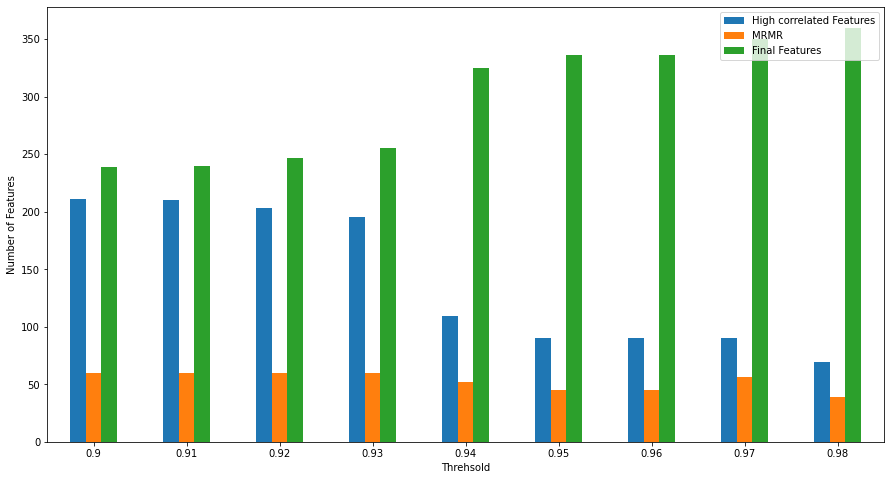

In [45]:
# plt.figure()
ax = features_compare.plot.bar(rot=0,figsize=(15,8))
plt.legend(loc='upper right')
plt.xlabel("Threhsold")
plt.ylabel("Number of Features")
plt.savefig("./pic/Correlation Pic/AirQuality/feature_reduction_AirQuality.png")

## Recursive Feature Elimination

## LightBGM,Random Forest,XGBoost

In [46]:
def lgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    gbm = lgb.LGBMRegressor()
    gbm.fit(x_train, y_train,eval_set = [(x_test,y_test)],early_stopping_rounds = 10)

    features = X_train.columns
    importances = gbm.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = features
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with LightBGM model')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [47]:
def rfr_pipeline(X_train,Y_train,top_feature_num,i):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))

    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train.reshape(-1,))
    
    feature_names = X_train.columns
    importances = rfr.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     fig = sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with Random Forest model')
#     plt.savefig('./pic/RMSE/AirQuality/feature_round_'+str(i)+'.png')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    
    return top_features

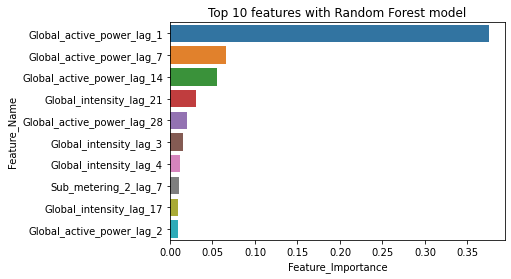

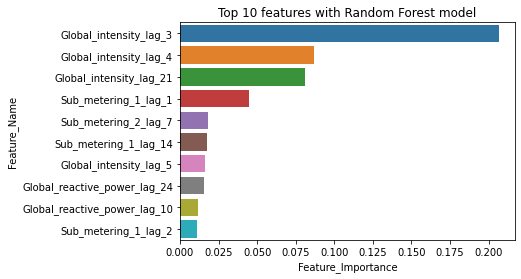

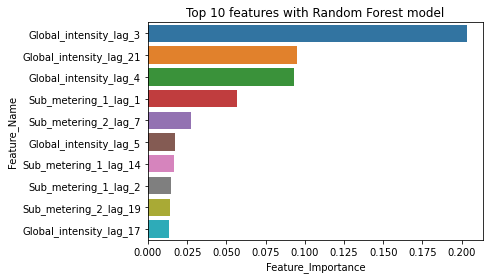

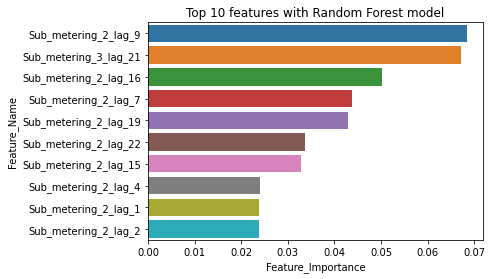

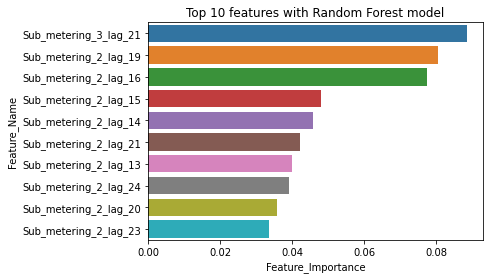

{14: ['Sub_metering_1_lag_1',
  'Global_active_power_lag_7',
  'Global_intensity_lag_3',
  'Global_intensity_lag_4',
  'Global_intensity_lag_5',
  'Sub_metering_2_lag_2',
  'Sub_metering_2_lag_7',
  'Sub_metering_2_lag_18',
  'Sub_metering_2_lag_21',
  'Sub_metering_1_lag_14',
  'Sub_metering_2_lag_11',
  'Sub_metering_1_lag_7',
  'Global_intensity_lag_8',
  'Sub_metering_2_lag_14',
  'Global_active_power_lag_13',
  'Sub_metering_2_lag_16',
  'Global_intensity_lag_21',
  'Sub_metering_2_lag_15',
  'Global_active_power_lag_14',
  'Sub_metering_2_lag_22',
  'Global_active_power_lag_2',
  'Sub_metering_1_lag_2',
  'Global_reactive_power_lag_24',
  'Sub_metering_2_lag_17',
  'Global_reactive_power_lag_10',
  'Sub_metering_2_lag_13',
  'Sub_metering_2_lag_9',
  'Sub_metering_2_lag_10',
  'Sub_metering_2_lag_24',
  'Global_intensity_lag_11',
  'Global_reactive_power_lag_11',
  'Sub_metering_2_lag_8',
  'Sub_metering_2_lag_1',
  'Sub_metering_2_lag_19',
  'Sub_metering_3_lag_21',
  'Sub_meter

In [660]:
rfr_recursive(feature_collections[0.75],14,14,X_train_lag,Y_train_lag)

In [48]:
def xgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    xgb = XGBRegressor()
    xgb.fit(x_train,y_train.reshape(-1,),eval_set=[(x_test, y_test)],early_stopping_rounds=10)

    feature_names = X_train.columns
    importances = xgb.feature_importances_
#     plot_importance(xgb,max_num_features=10,importance_type='gain',show_values=False)
    
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
# #     plt.barh(importances_df['Feature_Name'][:10], importances_df['Feature_Importance'][:10]) 
#     plt.title('Top 10 features with XGB model')
#     plt.show()
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [49]:
def rfr_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,):
    
    max_end = int(0.2*len(cols))
    
    range_end = 0
    
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                rfr_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))
                rfr_features = list(set(np.array(rfr_features).flatten()))
                features_dict[j] = rfr_features
                print(j,end='\r',flush=True)
                
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
        features_dict = {}
        for j in range(feature_num_1,range_end+1):
            rfr_features = []
            for i in range(5):
                col_len = int(len(cols)*i*0.2)
                now_cols = cols[col_len:]
                rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))

            rfr_features = list(set(np.array(rfr_features).flatten()))
            features_dict[j] = rfr_features
        
            print(j,end='\r',flush=True)
        return features_dict

In [50]:
def lgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0

    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                lgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    lgb_features.append( lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))

                lgb_features = list(set(np.array(lgb_features).flatten()))
                features_dict[j] = lgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    features_dict = {}
    
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
    
    for j in range(feature_num_1,range_end+1):
        lgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            lgb_features.append(lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        lgb_features = list(set(np.array(lgb_features).flatten()))
        features_dict[j] = lgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [51]:
def xgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                xgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                xgb_features = list(set(np.array(xgb_features).flatten()))
                features_dict[j] = xgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        xgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        xgb_features = list(set(np.array(xgb_features).flatten()))
        features_dict[j] = xgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [53]:
real_lgb = {}
for k,v in feature_collections.items():
    real_lgb[k] = lgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588291
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544061
[5]	valid_0's l2: 0.0526371
[6]	valid_0's l2: 0.0512466
[7]	valid_0's l2: 0.0507185
[8]	valid_0's l2: 0.049434
[9]	valid_0's l2: 0.0484079
[10]	valid_0's l2: 0.0482286
[11]	valid_0's l2: 0.0480677
[12]	valid_0's l2: 0.0473156
[13]	valid_0's l2: 0.0464388
[14]	valid_0's l2: 0.0465193
[15]	valid_0's l2: 0.0458582
[16]	valid_0's l2: 0.0465084
[17]	valid_0's l2: 0.0471516
[18]	valid_0's l2: 0.0466169
[19]	valid_0's l2: 0.0464373
[20]	valid_0's l2: 0.0466373
[21]	valid_0's l2: 0.0472292
[22]	valid_0's l2: 0.0466251
[23]	valid_0's l2: 0.0459005
[24]	valid_0's l2: 0.0457099
[25]	valid_0's l2: 0.0457409
[26]	valid_0's l2: 0.0451089
[27]	valid_0's l2: 0.0447292
[28]	valid_0's l2: 0.0450826
[29]	valid_0's l2: 0.0445711
[30]	valid_0's l2: 0.0442799
[31]	valid_0's l2: 0.0444134
[32]	valid_0's l2: 0.0446706
[33]	valid_0's l2: 0.0444842
[34]	valid_0's l2: 0.044992
[35]	valid_0's l2: 0.0453

[38]	valid_0's l2: 0.0448314
[39]	valid_0's l2: 0.0454871
[40]	valid_0's l2: 0.0454378
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588289
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544058
[5]	valid_0's l2: 0.052643
[6]	valid_0's l2: 0.0512423
[7]	valid_0's l2: 0.050707
[8]	valid_0's l2: 0.049488
[9]	valid_0's l2: 0.0484239
[10]	valid_0's l2: 0.0482402
[11]	valid_0's l2: 0.0480811
[12]	valid_0's l2: 0.0473337
[13]	valid_0's l2: 0.0464562
[14]	valid_0's l2: 0.0465211
[15]	valid_0's l2: 0.0455985
[16]	valid_0's l2: 0.0462176
[17]	valid_0's l2: 0.0468384
[18]	valid_0's l2: 0.0460739
[19]	valid_0's l2: 0.0459052
[20]	valid_0's l2: 0.0461187
[21]	valid_0's l2: 0.045444
[22]	valid_0's l2: 0.0451731
[23]	valid_0's l2: 0.0458794
[24]	valid_0's l2: 0.0456069
[25]	valid_0's l2: 0.0462352
[26]	valid_0's l2: 0.0457796
[27]	valid_0's l2: 0.0460813
[28]	valid_0's l2: 0.0459327
[29]	valid_0's l2: 0.0455503
[30]	valid_0's l2: 0.0450263
[31]	valid_0's l2: 0.0450531
[32]	valid_0's l2: 0.044611

[12]	valid_0's l2: 0.0550762
[13]	valid_0's l2: 0.0549912
[14]	valid_0's l2: 0.0543624
[15]	valid_0's l2: 0.055029
[16]	valid_0's l2: 0.0540766
[17]	valid_0's l2: 0.0541152
[18]	valid_0's l2: 0.0545387
[19]	valid_0's l2: 0.0541834
[20]	valid_0's l2: 0.0532096
[21]	valid_0's l2: 0.05427
[22]	valid_0's l2: 0.0545073
[23]	valid_0's l2: 0.0537497
[24]	valid_0's l2: 0.0547731
[25]	valid_0's l2: 0.0546024
[26]	valid_0's l2: 0.0547808
[27]	valid_0's l2: 0.0545996
[28]	valid_0's l2: 0.0545162
[29]	valid_0's l2: 0.055011
[30]	valid_0's l2: 0.054823
[1]	valid_0's l2: 0.0629215
[2]	valid_0's l2: 0.0614963
[3]	valid_0's l2: 0.0605632
[4]	valid_0's l2: 0.0591804
[5]	valid_0's l2: 0.0602954
[6]	valid_0's l2: 0.0597465
[7]	valid_0's l2: 0.059498
[8]	valid_0's l2: 0.0606697
[9]	valid_0's l2: 0.0600471
[10]	valid_0's l2: 0.060921
[11]	valid_0's l2: 0.0608519
[12]	valid_0's l2: 0.0602048
[13]	valid_0's l2: 0.0615378
[14]	valid_0's l2: 0.0614968
[1]	valid_0's l2: 0.0656223
[2]	valid_0's l2: 0.0657067
[3]

[1]	valid_0's l2: 0.0629215
[2]	valid_0's l2: 0.0614963
[3]	valid_0's l2: 0.0605632
[4]	valid_0's l2: 0.0591804
[5]	valid_0's l2: 0.0602954
[6]	valid_0's l2: 0.0597465
[7]	valid_0's l2: 0.059498
[8]	valid_0's l2: 0.0606697
[9]	valid_0's l2: 0.0600471
[10]	valid_0's l2: 0.060921
[11]	valid_0's l2: 0.0608519
[12]	valid_0's l2: 0.0602048
[13]	valid_0's l2: 0.0615378
[14]	valid_0's l2: 0.0614968
[1]	valid_0's l2: 0.0656223
[2]	valid_0's l2: 0.0657067
[3]	valid_0's l2: 0.0666191
[4]	valid_0's l2: 0.0662501
[5]	valid_0's l2: 0.0674165
[6]	valid_0's l2: 0.0674172
[7]	valid_0's l2: 0.0677627
[8]	valid_0's l2: 0.0690193
[9]	valid_0's l2: 0.0690712
[10]	valid_0's l2: 0.0703231
[11]	valid_0's l2: 0.0706489
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588291
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544061
[5]	valid_0's l2: 0.0526371
[6]	valid_0's l2: 0.0512466
[7]	valid_0's l2: 0.0507185
[8]	valid_0's l2: 0.049434
[9]	valid_0's l2: 0.0484079
[10]	valid_0's l2: 0.0482286
[11]	valid_0's 

[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588291
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544061
[5]	valid_0's l2: 0.0526371
[6]	valid_0's l2: 0.0512466
[7]	valid_0's l2: 0.0507185
[8]	valid_0's l2: 0.049434
[9]	valid_0's l2: 0.0484079
[10]	valid_0's l2: 0.0482286
[11]	valid_0's l2: 0.0480677
[12]	valid_0's l2: 0.0473156
[13]	valid_0's l2: 0.0464388
[14]	valid_0's l2: 0.0465193
[15]	valid_0's l2: 0.0458582
[16]	valid_0's l2: 0.0465084
[17]	valid_0's l2: 0.0471516
[18]	valid_0's l2: 0.0466169
[19]	valid_0's l2: 0.0464373
[20]	valid_0's l2: 0.0466373
[21]	valid_0's l2: 0.0472292
[22]	valid_0's l2: 0.0466251
[23]	valid_0's l2: 0.0459005
[24]	valid_0's l2: 0.0457099
[25]	valid_0's l2: 0.0457409
[26]	valid_0's l2: 0.0451089
[27]	valid_0's l2: 0.0447292
[28]	valid_0's l2: 0.0450826
[29]	valid_0's l2: 0.0445711
[30]	valid_0's l2: 0.0442799
[31]	valid_0's l2: 0.0444134
[32]	valid_0's l2: 0.0446706
[33]	valid_0's l2: 0.0444842
[34]	valid_0's l2: 0.044992
[35]	valid_0's l2: 0.0453

[2]	valid_0's l2: 0.0620024
[3]	valid_0's l2: 0.0609284
[4]	valid_0's l2: 0.0594766
[5]	valid_0's l2: 0.0587524
[6]	valid_0's l2: 0.0572845
[7]	valid_0's l2: 0.0566418
[8]	valid_0's l2: 0.0562283
[9]	valid_0's l2: 0.0549443
[10]	valid_0's l2: 0.0555971
[11]	valid_0's l2: 0.0546895
[12]	valid_0's l2: 0.0545353
[13]	valid_0's l2: 0.0548906
[14]	valid_0's l2: 0.0540325
[15]	valid_0's l2: 0.0547706
[16]	valid_0's l2: 0.0539262
[17]	valid_0's l2: 0.0539859
[18]	valid_0's l2: 0.0544337
[19]	valid_0's l2: 0.054079
[20]	valid_0's l2: 0.0553273
[21]	valid_0's l2: 0.0542332
[22]	valid_0's l2: 0.0544134
[23]	valid_0's l2: 0.0537608
[24]	valid_0's l2: 0.0544818
[25]	valid_0's l2: 0.0543437
[26]	valid_0's l2: 0.0541921
[27]	valid_0's l2: 0.0549686
[28]	valid_0's l2: 0.055267
[29]	valid_0's l2: 0.0544891
[30]	valid_0's l2: 0.0541696
[31]	valid_0's l2: 0.0553187
[32]	valid_0's l2: 0.0554853
[33]	valid_0's l2: 0.0548621
[1]	valid_0's l2: 0.0629465
[2]	valid_0's l2: 0.0618339
[3]	valid_0's l2: 0.060862

[2]	valid_0's l2: 0.0588291
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544061
[5]	valid_0's l2: 0.0526371
[6]	valid_0's l2: 0.0512466
[7]	valid_0's l2: 0.0507185
[8]	valid_0's l2: 0.049434
[9]	valid_0's l2: 0.0484079
[10]	valid_0's l2: 0.0482286
[11]	valid_0's l2: 0.0480677
[12]	valid_0's l2: 0.0473156
[13]	valid_0's l2: 0.0464388
[14]	valid_0's l2: 0.0465193
[15]	valid_0's l2: 0.0458582
[16]	valid_0's l2: 0.0465084
[17]	valid_0's l2: 0.0471516
[18]	valid_0's l2: 0.0466169
[19]	valid_0's l2: 0.0464373
[20]	valid_0's l2: 0.0466329
[21]	valid_0's l2: 0.0472255
[22]	valid_0's l2: 0.0466209
[23]	valid_0's l2: 0.0472723
[24]	valid_0's l2: 0.0469852
[25]	valid_0's l2: 0.0469476
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588289
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544058
[5]	valid_0's l2: 0.052643
[6]	valid_0's l2: 0.0512423
[7]	valid_0's l2: 0.050707
[8]	valid_0's l2: 0.049488
[9]	valid_0's l2: 0.0484239
[10]	valid_0's l2: 0.0482402
[11]	valid_0's l2: 0.0480811
[12]	v

[14]	valid_0's l2: 0.0612545
[1]	valid_0's l2: 0.0656403
[2]	valid_0's l2: 0.0657205
[3]	valid_0's l2: 0.066631
[4]	valid_0's l2: 0.0662601
[5]	valid_0's l2: 0.0667851
[6]	valid_0's l2: 0.0670353
[7]	valid_0's l2: 0.068383
[8]	valid_0's l2: 0.0686547
[9]	valid_0's l2: 0.0682696
[10]	valid_0's l2: 0.0695247
[11]	valid_0's l2: 0.0699852
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588291
[3]	valid_0's l2: 0.0564713
[4]	valid_0's l2: 0.0544061
[5]	valid_0's l2: 0.0526371
[6]	valid_0's l2: 0.0512466
[7]	valid_0's l2: 0.0507185
[8]	valid_0's l2: 0.049434
[9]	valid_0's l2: 0.0484079
[10]	valid_0's l2: 0.0482286
[11]	valid_0's l2: 0.0480677
[12]	valid_0's l2: 0.0473156
[13]	valid_0's l2: 0.0464388
[14]	valid_0's l2: 0.0465193
[15]	valid_0's l2: 0.0458582
[16]	valid_0's l2: 0.0465084
[17]	valid_0's l2: 0.0471516
[18]	valid_0's l2: 0.0466169
[19]	valid_0's l2: 0.0464373
[20]	valid_0's l2: 0.0466329
[21]	valid_0's l2: 0.0472255
[22]	valid_0's l2: 0.0466209
[23]	valid_0's l2: 0.0472723
[24]	v

[2]	valid_0's l2: 0.0620024
[3]	valid_0's l2: 0.0609284
[4]	valid_0's l2: 0.0594766
[5]	valid_0's l2: 0.0587524
[6]	valid_0's l2: 0.0572845
[7]	valid_0's l2: 0.0566418
[8]	valid_0's l2: 0.0562283
[9]	valid_0's l2: 0.0549443
[10]	valid_0's l2: 0.0555971
[11]	valid_0's l2: 0.0546895
[12]	valid_0's l2: 0.0545353
[13]	valid_0's l2: 0.0548906
[14]	valid_0's l2: 0.0540325
[15]	valid_0's l2: 0.0547706
[16]	valid_0's l2: 0.0539262
[17]	valid_0's l2: 0.0539859
[18]	valid_0's l2: 0.0544337
[19]	valid_0's l2: 0.054079
[20]	valid_0's l2: 0.0553273
[21]	valid_0's l2: 0.0542332
[22]	valid_0's l2: 0.0544134
[23]	valid_0's l2: 0.0537608
[24]	valid_0's l2: 0.0544818
[25]	valid_0's l2: 0.0543437
[26]	valid_0's l2: 0.0541921
[27]	valid_0's l2: 0.0549686
[28]	valid_0's l2: 0.055267
[29]	valid_0's l2: 0.0544891
[30]	valid_0's l2: 0.0541696
[31]	valid_0's l2: 0.0553187
[32]	valid_0's l2: 0.0554853
[33]	valid_0's l2: 0.0548621
[1]	valid_0's l2: 0.0629465
[2]	valid_0's l2: 0.0618339
[3]	valid_0's l2: 0.060862

[13]	valid_0's l2: 0.0463596
[14]	valid_0's l2: 0.0464195
[15]	valid_0's l2: 0.0456415
[16]	valid_0's l2: 0.0462427
[17]	valid_0's l2: 0.0457614
[18]	valid_0's l2: 0.0463881
[19]	valid_0's l2: 0.0462086
[20]	valid_0's l2: 0.0464278
[21]	valid_0's l2: 0.0457965
[22]	valid_0's l2: 0.0450814
[23]	valid_0's l2: 0.045764
[24]	valid_0's l2: 0.0453322
[25]	valid_0's l2: 0.045927
[26]	valid_0's l2: 0.0463052
[27]	valid_0's l2: 0.04581
[28]	valid_0's l2: 0.046133
[29]	valid_0's l2: 0.0455835
[30]	valid_0's l2: 0.0453693
[31]	valid_0's l2: 0.0454891
[32]	valid_0's l2: 0.0461323
[1]	valid_0's l2: 0.063074
[2]	valid_0's l2: 0.0620248
[3]	valid_0's l2: 0.0609673
[4]	valid_0's l2: 0.0594613
[5]	valid_0's l2: 0.0587192
[6]	valid_0's l2: 0.0572652
[7]	valid_0's l2: 0.0565037
[8]	valid_0's l2: 0.0560656
[9]	valid_0's l2: 0.0548238
[10]	valid_0's l2: 0.0554932
[11]	valid_0's l2: 0.0558979
[12]	valid_0's l2: 0.0548576
[13]	valid_0's l2: 0.05473
[14]	valid_0's l2: 0.053873
[15]	valid_0's l2: 0.0546227
[16

[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.058825
[3]	valid_0's l2: 0.0564673
[4]	valid_0's l2: 0.054398
[5]	valid_0's l2: 0.0526345
[6]	valid_0's l2: 0.0512396
[7]	valid_0's l2: 0.0507063
[8]	valid_0's l2: 0.049399
[9]	valid_0's l2: 0.048379
[10]	valid_0's l2: 0.0481689
[11]	valid_0's l2: 0.0479807
[12]	valid_0's l2: 0.0472305
[13]	valid_0's l2: 0.0472602
[14]	valid_0's l2: 0.046336
[15]	valid_0's l2: 0.0454512
[16]	valid_0's l2: 0.0459621
[17]	valid_0's l2: 0.0465908
[18]	valid_0's l2: 0.0463487
[19]	valid_0's l2: 0.0458728
[20]	valid_0's l2: 0.0460688
[21]	valid_0's l2: 0.0468928
[22]	valid_0's l2: 0.0465938
[23]	valid_0's l2: 0.0458919
[24]	valid_0's l2: 0.0465671
[25]	valid_0's l2: 0.0470209
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588289
[3]	valid_0's l2: 0.056471
[4]	valid_0's l2: 0.0544015
[5]	valid_0's l2: 0.0526226
[6]	valid_0's l2: 0.0511948
[7]	valid_0's l2: 0.0499159
[8]	valid_0's l2: 0.0494301
[9]	valid_0's l2: 0.0483987
[10]	valid_0's l2: 0.0481748
[11]	vali

[12]	valid_0's l2: 0.0619356
[13]	valid_0's l2: 0.0615957
[14]	valid_0's l2: 0.0625754
[1]	valid_0's l2: 0.0656403
[2]	valid_0's l2: 0.0657205
[3]	valid_0's l2: 0.066631
[4]	valid_0's l2: 0.0662601
[5]	valid_0's l2: 0.0667851
[6]	valid_0's l2: 0.0670353
[7]	valid_0's l2: 0.068383
[8]	valid_0's l2: 0.0686547
[9]	valid_0's l2: 0.0682696
[10]	valid_0's l2: 0.0695247
[11]	valid_0's l2: 0.0699852
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.058825
[3]	valid_0's l2: 0.0564673
[4]	valid_0's l2: 0.054398
[5]	valid_0's l2: 0.0526345
[6]	valid_0's l2: 0.0512396
[7]	valid_0's l2: 0.0507063
[8]	valid_0's l2: 0.049399
[9]	valid_0's l2: 0.048379
[10]	valid_0's l2: 0.0481689
[11]	valid_0's l2: 0.0479807
[12]	valid_0's l2: 0.0472305
[13]	valid_0's l2: 0.0472602
[14]	valid_0's l2: 0.046336
[15]	valid_0's l2: 0.0454512
[16]	valid_0's l2: 0.0459621
[17]	valid_0's l2: 0.0465908
[18]	valid_0's l2: 0.0463487
[19]	valid_0's l2: 0.0458728
[20]	valid_0's l2: 0.0460688
[21]	valid_0's l2: 0.0468928
[22]	valid

[2]	valid_0's l2: 0.0619919
[3]	valid_0's l2: 0.0608974
[4]	valid_0's l2: 0.0594638
[5]	valid_0's l2: 0.0587494
[6]	valid_0's l2: 0.0570694
[7]	valid_0's l2: 0.0564141
[8]	valid_0's l2: 0.0559828
[9]	valid_0's l2: 0.0547253
[10]	valid_0's l2: 0.0553993
[11]	valid_0's l2: 0.0557601
[12]	valid_0's l2: 0.0547999
[13]	valid_0's l2: 0.054672
[14]	valid_0's l2: 0.0538048
[15]	valid_0's l2: 0.0545563
[16]	valid_0's l2: 0.0536695
[17]	valid_0's l2: 0.0536937
[18]	valid_0's l2: 0.0540886
[19]	valid_0's l2: 0.0537405
[20]	valid_0's l2: 0.0526971
[21]	valid_0's l2: 0.0540771
[22]	valid_0's l2: 0.05427
[23]	valid_0's l2: 0.0549126
[24]	valid_0's l2: 0.0541027
[25]	valid_0's l2: 0.0539974
[26]	valid_0's l2: 0.0534958
[27]	valid_0's l2: 0.0546864
[28]	valid_0's l2: 0.0553835
[29]	valid_0's l2: 0.0560371
[30]	valid_0's l2: 0.0558285
[1]	valid_0's l2: 0.0629215
[2]	valid_0's l2: 0.0614963
[3]	valid_0's l2: 0.0605632
[4]	valid_0's l2: 0.0591804
[5]	valid_0's l2: 0.0602906
[6]	valid_0's l2: 0.0597376
[7

[16]	valid_0's l2: 0.0460628
[17]	valid_0's l2: 0.0467334
[18]	valid_0's l2: 0.0465208
[19]	valid_0's l2: 0.0460525
[20]	valid_0's l2: 0.0462666
[21]	valid_0's l2: 0.0455883
[22]	valid_0's l2: 0.0463935
[23]	valid_0's l2: 0.0458448
[24]	valid_0's l2: 0.0458243
[25]	valid_0's l2: 0.0465047
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588289
[3]	valid_0's l2: 0.056471
[4]	valid_0's l2: 0.0544083
[5]	valid_0's l2: 0.0526245
[6]	valid_0's l2: 0.0512239
[7]	valid_0's l2: 0.0499484
[8]	valid_0's l2: 0.0494621
[9]	valid_0's l2: 0.0484325
[10]	valid_0's l2: 0.0482331
[11]	valid_0's l2: 0.0480741
[12]	valid_0's l2: 0.0473197
[13]	valid_0's l2: 0.0463934
[14]	valid_0's l2: 0.0464359
[15]	valid_0's l2: 0.0456108
[16]	valid_0's l2: 0.046223
[17]	valid_0's l2: 0.0457361
[18]	valid_0's l2: 0.0463699
[19]	valid_0's l2: 0.0461916
[20]	valid_0's l2: 0.0464027
[21]	valid_0's l2: 0.0464723
[22]	valid_0's l2: 0.0458625
[23]	valid_0's l2: 0.045248
[24]	valid_0's l2: 0.0459071
[25]	valid_0's l2: 0.04549

[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.058825
[3]	valid_0's l2: 0.0564673
[4]	valid_0's l2: 0.0544048
[5]	valid_0's l2: 0.0526426
[6]	valid_0's l2: 0.0512184
[7]	valid_0's l2: 0.0506809
[8]	valid_0's l2: 0.0494025
[9]	valid_0's l2: 0.0483737
[10]	valid_0's l2: 0.0481626
[11]	valid_0's l2: 0.0479745
[12]	valid_0's l2: 0.0472236
[13]	valid_0's l2: 0.0472558
[14]	valid_0's l2: 0.0463367
[15]	valid_0's l2: 0.0455649
[16]	valid_0's l2: 0.0460628
[17]	valid_0's l2: 0.0467334
[18]	valid_0's l2: 0.0465208
[19]	valid_0's l2: 0.0460525
[20]	valid_0's l2: 0.0462666
[21]	valid_0's l2: 0.0455883
[22]	valid_0's l2: 0.0463935
[23]	valid_0's l2: 0.0458448
[24]	valid_0's l2: 0.0458243
[25]	valid_0's l2: 0.0465047
[1]	valid_0's l2: 0.0616177
[2]	valid_0's l2: 0.0588289
[3]	valid_0's l2: 0.056471
[4]	valid_0's l2: 0.0544083
[5]	valid_0's l2: 0.0526245
[6]	valid_0's l2: 0.0512239
[7]	valid_0's l2: 0.0499484
[8]	valid_0's l2: 0.0494621
[9]	valid_0's l2: 0.0484325
[10]	valid_0's l2: 0.0482331
[11]	

[6]	valid_0's l2: 0.0570694
[7]	valid_0's l2: 0.0564141
[8]	valid_0's l2: 0.0559828
[9]	valid_0's l2: 0.0547253
[10]	valid_0's l2: 0.0553993
[11]	valid_0's l2: 0.0557601
[12]	valid_0's l2: 0.0547999
[13]	valid_0's l2: 0.054672
[14]	valid_0's l2: 0.0538048
[15]	valid_0's l2: 0.0545563
[16]	valid_0's l2: 0.0536695
[17]	valid_0's l2: 0.0536937
[18]	valid_0's l2: 0.0540886
[19]	valid_0's l2: 0.0537405
[20]	valid_0's l2: 0.0526971
[21]	valid_0's l2: 0.0540771
[22]	valid_0's l2: 0.05427
[23]	valid_0's l2: 0.0549126
[24]	valid_0's l2: 0.0541027
[25]	valid_0's l2: 0.0539974
[26]	valid_0's l2: 0.0534958
[27]	valid_0's l2: 0.0546864
[28]	valid_0's l2: 0.0553835
[29]	valid_0's l2: 0.0560371
[30]	valid_0's l2: 0.0558285
[1]	valid_0's l2: 0.0629215
[2]	valid_0's l2: 0.0614963
[3]	valid_0's l2: 0.0605632
[4]	valid_0's l2: 0.0591804
[5]	valid_0's l2: 0.0602906
[6]	valid_0's l2: 0.0597376
[7]	valid_0's l2: 0.0594884
[8]	valid_0's l2: 0.0606581
[9]	valid_0's l2: 0.0599884
[10]	valid_0's l2: 0.0606404
[

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.0560918
[4]	valid_0's l2: 0.0539856
[5]	valid_0's l2: 0.0520547
[6]	valid_0's l2: 0.0505946
[7]	valid_0's l2: 0.0492079
[8]	valid_0's l2: 0.0480771
[9]	valid_0's l2: 0.0475784
[10]	valid_0's l2: 0.0466977
[11]	valid_0's l2: 0.0465436
[12]	valid_0's l2: 0.0457212
[13]	valid_0's l2: 0.0460685
[14]	valid_0's l2: 0.0452669
[15]	valid_0's l2: 0.0453214
[16]	valid_0's l2: 0.0449952
[17]	valid_0's l2: 0.0445641
[18]	valid_0's l2: 0.0447539
[19]	valid_0's l2: 0.0440976
[20]	valid_0's l2: 0.0447528
[21]	valid_0's l2: 0.044058
[22]	valid_0's l2: 0.0441646
[23]	valid_0's l2: 0.0437578
[24]	valid_0's l2: 0.0440221
[25]	valid_0's l2: 0.043381
[26]	valid_0's l2: 0.0437169
[27]	valid_0's l2: 0.0438853
[28]	valid_0's l2: 0.043659
[29]	valid_0's l2: 0.0440614
[30]	valid_0's l2: 0.0437271
[31]	valid_0's l2: 0.0440199
[32]	valid_0's l2: 0.043545
[33]	valid_0's l2: 0.0445311
[34]	valid_0's l2: 0.0442676
[35]	valid_0's l2: 0.0440302

[12]	valid_0's l2: 0.0458044
[13]	valid_0's l2: 0.0455755
[14]	valid_0's l2: 0.0447189
[15]	valid_0's l2: 0.044779
[16]	valid_0's l2: 0.044183
[17]	valid_0's l2: 0.0448984
[18]	valid_0's l2: 0.0445793
[19]	valid_0's l2: 0.0448076
[20]	valid_0's l2: 0.0447115
[21]	valid_0's l2: 0.044083
[22]	valid_0's l2: 0.0442063
[23]	valid_0's l2: 0.0437448
[24]	valid_0's l2: 0.0440119
[25]	valid_0's l2: 0.044102
[26]	valid_0's l2: 0.0439512
[27]	valid_0's l2: 0.0434555
[28]	valid_0's l2: 0.0437212
[29]	valid_0's l2: 0.0443824
[30]	valid_0's l2: 0.0441673
[31]	valid_0's l2: 0.0448948
[32]	valid_0's l2: 0.0455433
[33]	valid_0's l2: 0.0453791
[34]	valid_0's l2: 0.0458948
[35]	valid_0's l2: 0.0455881
[36]	valid_0's l2: 0.0457705
[37]	valid_0's l2: 0.04614
[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0591454
[3]	valid_0's l2: 0.0568635
[4]	valid_0's l2: 0.0550691
[5]	valid_0's l2: 0.0534955
[6]	valid_0's l2: 0.0521481
[7]	valid_0's l2: 0.0517087
[8]	valid_0's l2: 0.0505985
[9]	valid_0's l2: 0.0504295


[34]	valid_0's l2: 0.0458948
[35]	valid_0's l2: 0.0455881
[36]	valid_0's l2: 0.0457705
[37]	valid_0's l2: 0.04614
[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0591454
[3]	valid_0's l2: 0.0568635
[4]	valid_0's l2: 0.0550691
[5]	valid_0's l2: 0.0534955
[6]	valid_0's l2: 0.0521481
[7]	valid_0's l2: 0.0517087
[8]	valid_0's l2: 0.0505985
[9]	valid_0's l2: 0.0504295
[10]	valid_0's l2: 0.049536
[11]	valid_0's l2: 0.0489377
[12]	valid_0's l2: 0.0490557
[13]	valid_0's l2: 0.048777
[14]	valid_0's l2: 0.0480658
[15]	valid_0's l2: 0.0490011
[16]	valid_0's l2: 0.0500233
[17]	valid_0's l2: 0.0494635
[18]	valid_0's l2: 0.0497474
[19]	valid_0's l2: 0.0489612
[20]	valid_0's l2: 0.0496622
[21]	valid_0's l2: 0.0490141
[22]	valid_0's l2: 0.0493261
[23]	valid_0's l2: 0.0487597
[24]	valid_0's l2: 0.0486504
[1]	valid_0's l2: 0.0616476
[2]	valid_0's l2: 0.0588783
[3]	valid_0's l2: 0.0565912
[4]	valid_0's l2: 0.0546588
[5]	valid_0's l2: 0.0530783
[6]	valid_0's l2: 0.0516909
[7]	valid_0's l2: 0.0505491
[8]	v

[1]	valid_0's l2: 0.0616476
[2]	valid_0's l2: 0.0588783
[3]	valid_0's l2: 0.0565912
[4]	valid_0's l2: 0.0546588
[5]	valid_0's l2: 0.0530783
[6]	valid_0's l2: 0.0516909
[7]	valid_0's l2: 0.0505491
[8]	valid_0's l2: 0.0495281
[9]	valid_0's l2: 0.0486968
[10]	valid_0's l2: 0.0498182
[11]	valid_0's l2: 0.0502767
[12]	valid_0's l2: 0.0495084
[13]	valid_0's l2: 0.0503636
[14]	valid_0's l2: 0.0497074
[15]	valid_0's l2: 0.0507076
[16]	valid_0's l2: 0.0518265
[17]	valid_0's l2: 0.0511803
[18]	valid_0's l2: 0.0516547
[19]	valid_0's l2: 0.0510061
[1]	valid_0's l2: 0.0616628
[2]	valid_0's l2: 0.0588578
[3]	valid_0's l2: 0.0564687
[4]	valid_0's l2: 0.0545603
[5]	valid_0's l2: 0.0528906
[6]	valid_0's l2: 0.0514634
[7]	valid_0's l2: 0.0502688
[8]	valid_0's l2: 0.0492917
[9]	valid_0's l2: 0.0484595
[10]	valid_0's l2: 0.0494525
[11]	valid_0's l2: 0.0486233
[12]	valid_0's l2: 0.0495966
[13]	valid_0's l2: 0.0505554
[14]	valid_0's l2: 0.0497755
[15]	valid_0's l2: 0.0491425
[16]	valid_0's l2: 0.0501232
[17

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462794
[12]	valid_0's l2: 0.0455506
[13]	valid_0's l2: 0.0461452
[14]	valid_0's l2: 0.0455362
[15]	valid_0's l2: 0.0455626
[16]	valid_0's l2: 0.0447894
[17]	valid_0's l2: 0.0445561
[18]	valid_0's l2: 0.0447254
[19]	valid_0's l2: 0.0440466
[20]	valid_0's l2: 0.0446433
[21]	valid_0's l2: 0.0439675
[22]	valid_0's l2: 0.0437044
[23]	valid_0's l2: 0.0439748
[24]	valid_0's l2: 0.0436989
[25]	valid_0's l2: 0.0433002
[26]	valid_0's l2: 0.0436574
[27]	valid_0's l2: 0.0438289
[28]	valid_0's l2: 0.0434451
[29]	valid_0's l2: 0.0437631
[30]	valid_0's l2: 0.0443738
[31]	valid_0's l2: 0.0439968
[32]	valid_0's l2: 0.0436008
[33]	valid_0's l2: 0.0439821
[34]	valid_0's l2: 0.0446049
[35]	valid_0's l2: 0.04425

[11]	valid_0's l2: 0.0462794
[12]	valid_0's l2: 0.0455506
[13]	valid_0's l2: 0.0461452
[14]	valid_0's l2: 0.0455362
[15]	valid_0's l2: 0.0455626
[16]	valid_0's l2: 0.0447894
[17]	valid_0's l2: 0.0445561
[18]	valid_0's l2: 0.0447254
[19]	valid_0's l2: 0.0440466
[20]	valid_0's l2: 0.0446433
[21]	valid_0's l2: 0.0439675
[22]	valid_0's l2: 0.0437044
[23]	valid_0's l2: 0.0439748
[24]	valid_0's l2: 0.0436989
[25]	valid_0's l2: 0.0433002
[26]	valid_0's l2: 0.0436574
[27]	valid_0's l2: 0.0438289
[28]	valid_0's l2: 0.0434451
[29]	valid_0's l2: 0.0437631
[30]	valid_0's l2: 0.0443738
[31]	valid_0's l2: 0.0439968
[32]	valid_0's l2: 0.0436008
[33]	valid_0's l2: 0.0439821
[34]	valid_0's l2: 0.0446049
[35]	valid_0's l2: 0.0442527
[1]	valid_0's l2: 0.0614634
[2]	valid_0's l2: 0.0585074
[3]	valid_0's l2: 0.0560272
[4]	valid_0's l2: 0.0540412
[5]	valid_0's l2: 0.0521559
[6]	valid_0's l2: 0.0507171
[7]	valid_0's l2: 0.0491833
[8]	valid_0's l2: 0.0486489
[9]	valid_0's l2: 0.0475708
[10]	valid_0's l2: 0.04

[4]	valid_0's l2: 0.0540412
[5]	valid_0's l2: 0.0521559
[6]	valid_0's l2: 0.0507171
[7]	valid_0's l2: 0.0491833
[8]	valid_0's l2: 0.0486489
[9]	valid_0's l2: 0.0475708
[10]	valid_0's l2: 0.0466116
[11]	valid_0's l2: 0.0463779
[12]	valid_0's l2: 0.0455643
[13]	valid_0's l2: 0.0449628
[14]	valid_0's l2: 0.0447589
[15]	valid_0's l2: 0.0448272
[16]	valid_0's l2: 0.0441027
[17]	valid_0's l2: 0.0448044
[18]	valid_0's l2: 0.0444507
[19]	valid_0's l2: 0.0446614
[20]	valid_0's l2: 0.0445598
[21]	valid_0's l2: 0.0440542
[22]	valid_0's l2: 0.0444136
[23]	valid_0's l2: 0.0447733
[24]	valid_0's l2: 0.044095
[25]	valid_0's l2: 0.0436343
[26]	valid_0's l2: 0.0441162
[27]	valid_0's l2: 0.0445849
[28]	valid_0's l2: 0.0449638
[29]	valid_0's l2: 0.0447767
[30]	valid_0's l2: 0.0450243
[31]	valid_0's l2: 0.0451546
[32]	valid_0's l2: 0.0447657
[33]	valid_0's l2: 0.045417
[34]	valid_0's l2: 0.0458175
[35]	valid_0's l2: 0.0453827
[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0590308
[3]	valid_0's l2: 0.0568

[12]	valid_0's l2: 0.0455643
[13]	valid_0's l2: 0.0449628
[14]	valid_0's l2: 0.0447589
[15]	valid_0's l2: 0.0448272
[16]	valid_0's l2: 0.0441027
[17]	valid_0's l2: 0.0448044
[18]	valid_0's l2: 0.0444507
[19]	valid_0's l2: 0.0446614
[20]	valid_0's l2: 0.0445598
[21]	valid_0's l2: 0.0440542
[22]	valid_0's l2: 0.0444136
[23]	valid_0's l2: 0.0447733
[24]	valid_0's l2: 0.044095
[25]	valid_0's l2: 0.0436343
[26]	valid_0's l2: 0.0441162
[27]	valid_0's l2: 0.0445849
[28]	valid_0's l2: 0.0449638
[29]	valid_0's l2: 0.0447767
[30]	valid_0's l2: 0.0450243
[31]	valid_0's l2: 0.0451546
[32]	valid_0's l2: 0.0447657
[33]	valid_0's l2: 0.045417
[34]	valid_0's l2: 0.0458175
[35]	valid_0's l2: 0.0453827
[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0590308
[3]	valid_0's l2: 0.0568653
[4]	valid_0's l2: 0.0549216
[5]	valid_0's l2: 0.0533269
[6]	valid_0's l2: 0.0520835
[7]	valid_0's l2: 0.05161
[8]	valid_0's l2: 0.050787
[9]	valid_0's l2: 0.0497963
[10]	valid_0's l2: 0.0496747
[11]	valid_0's l2: 0.0490356

[18]	valid_0's l2: 0.0444507
[19]	valid_0's l2: 0.0446614
[20]	valid_0's l2: 0.0445598
[21]	valid_0's l2: 0.0440542
[22]	valid_0's l2: 0.0444136
[23]	valid_0's l2: 0.0447733
[24]	valid_0's l2: 0.044095
[25]	valid_0's l2: 0.0436343
[26]	valid_0's l2: 0.0441162
[27]	valid_0's l2: 0.0445849
[28]	valid_0's l2: 0.0449638
[29]	valid_0's l2: 0.0447767
[30]	valid_0's l2: 0.0450243
[31]	valid_0's l2: 0.0451546
[32]	valid_0's l2: 0.0447657
[33]	valid_0's l2: 0.045417
[34]	valid_0's l2: 0.0458175
[35]	valid_0's l2: 0.0453827
[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0590308
[3]	valid_0's l2: 0.0568653
[4]	valid_0's l2: 0.0549216
[5]	valid_0's l2: 0.0533269
[6]	valid_0's l2: 0.0520835
[7]	valid_0's l2: 0.05161
[8]	valid_0's l2: 0.050787
[9]	valid_0's l2: 0.0497963
[10]	valid_0's l2: 0.0496747
[11]	valid_0's l2: 0.0490356
[12]	valid_0's l2: 0.0483276
[13]	valid_0's l2: 0.048428
[14]	valid_0's l2: 0.0488513
[15]	valid_0's l2: 0.0484377
[16]	valid_0's l2: 0.049376
[17]	valid_0's l2: 0.0487322
[

[31]	valid_0's l2: 0.0451546
[32]	valid_0's l2: 0.0447657
[33]	valid_0's l2: 0.045417
[34]	valid_0's l2: 0.0458175
[35]	valid_0's l2: 0.0453827
[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0590308
[3]	valid_0's l2: 0.0568653
[4]	valid_0's l2: 0.0549216
[5]	valid_0's l2: 0.0533269
[6]	valid_0's l2: 0.0520835
[7]	valid_0's l2: 0.05161
[8]	valid_0's l2: 0.050787
[9]	valid_0's l2: 0.0497963
[10]	valid_0's l2: 0.0496747
[11]	valid_0's l2: 0.0490356
[12]	valid_0's l2: 0.0483276
[13]	valid_0's l2: 0.048428
[14]	valid_0's l2: 0.0488513
[15]	valid_0's l2: 0.0484377
[16]	valid_0's l2: 0.049376
[17]	valid_0's l2: 0.0487322
[18]	valid_0's l2: 0.0489482
[19]	valid_0's l2: 0.0485639
[20]	valid_0's l2: 0.0479151
[21]	valid_0's l2: 0.0487961
[22]	valid_0's l2: 0.0493413
[23]	valid_0's l2: 0.0488777
[24]	valid_0's l2: 0.0492187
[25]	valid_0's l2: 0.0486339
[26]	valid_0's l2: 0.0480884
[27]	valid_0's l2: 0.0484361
[28]	valid_0's l2: 0.0479604
[29]	valid_0's l2: 0.0488122
[30]	valid_0's l2: 0.0494095


[8]	valid_0's l2: 0.050787
[9]	valid_0's l2: 0.0497963
[10]	valid_0's l2: 0.0496747
[11]	valid_0's l2: 0.0490356
[12]	valid_0's l2: 0.0483276
[13]	valid_0's l2: 0.048428
[14]	valid_0's l2: 0.0488513
[15]	valid_0's l2: 0.0484377
[16]	valid_0's l2: 0.049376
[17]	valid_0's l2: 0.0487322
[18]	valid_0's l2: 0.0489482
[19]	valid_0's l2: 0.0485639
[20]	valid_0's l2: 0.0479151
[21]	valid_0's l2: 0.0487961
[22]	valid_0's l2: 0.0493413
[23]	valid_0's l2: 0.0488777
[24]	valid_0's l2: 0.0492187
[25]	valid_0's l2: 0.0486339
[26]	valid_0's l2: 0.0480884
[27]	valid_0's l2: 0.0484361
[28]	valid_0's l2: 0.0479604
[29]	valid_0's l2: 0.0488122
[30]	valid_0's l2: 0.0494095
[1]	valid_0's l2: 0.0616959
[2]	valid_0's l2: 0.0589302
[3]	valid_0's l2: 0.056615
[4]	valid_0's l2: 0.0546808
[5]	valid_0's l2: 0.0530712
[6]	valid_0's l2: 0.0517616
[7]	valid_0's l2: 0.0510103
[8]	valid_0's l2: 0.0500095
[9]	valid_0's l2: 0.0496876
[10]	valid_0's l2: 0.0501337
[11]	valid_0's l2: 0.0493001
[12]	valid_0's l2: 0.0504046


[1]	valid_0's l2: 0.0616377
[2]	valid_0's l2: 0.0588926
[3]	valid_0's l2: 0.0565721
[4]	valid_0's l2: 0.0545993
[5]	valid_0's l2: 0.0530134
[6]	valid_0's l2: 0.051672
[7]	valid_0's l2: 0.0510363
[8]	valid_0's l2: 0.0500151
[9]	valid_0's l2: 0.0494345
[10]	valid_0's l2: 0.0486698
[11]	valid_0's l2: 0.0497029
[12]	valid_0's l2: 0.0494377
[13]	valid_0's l2: 0.0504483
[14]	valid_0's l2: 0.0496471
[15]	valid_0's l2: 0.0506361
[16]	valid_0's l2: 0.050468
[17]	valid_0's l2: 0.0503064
[18]	valid_0's l2: 0.0512751
[19]	valid_0's l2: 0.0506773
[20]	valid_0's l2: 0.0509075
[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462794
[12]	valid_0's l2: 0.0455506
[13]	valid_0's l2: 0.0461452
[14]	valid_0's l2: 0.0455362
[15]	valid_0's l2: 0.0455626
[16]	val

[6]	valid_0's l2: 0.051672
[7]	valid_0's l2: 0.0510363
[8]	valid_0's l2: 0.0500151
[9]	valid_0's l2: 0.0494345
[10]	valid_0's l2: 0.0486698
[11]	valid_0's l2: 0.0497029
[12]	valid_0's l2: 0.0494377
[13]	valid_0's l2: 0.0504483
[14]	valid_0's l2: 0.0496471
[15]	valid_0's l2: 0.0506361
[16]	valid_0's l2: 0.050468
[17]	valid_0's l2: 0.0503064
[18]	valid_0's l2: 0.0512751
[19]	valid_0's l2: 0.0506773
[20]	valid_0's l2: 0.0509075
[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462794
[12]	valid_0's l2: 0.0455506
[13]	valid_0's l2: 0.0461452
[14]	valid_0's l2: 0.0455362
[15]	valid_0's l2: 0.0455626
[16]	valid_0's l2: 0.0447894
[17]	valid_0's l2: 0.0445561
[18]	valid_0's l2: 0.0447254
[19]	valid_0's l2: 0.0440466
[20]	valid_0's l2: 0.0446433
[21

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462794
[12]	valid_0's l2: 0.0455506
[13]	valid_0's l2: 0.0461452
[14]	valid_0's l2: 0.0455362
[15]	valid_0's l2: 0.0455626
[16]	valid_0's l2: 0.0447894
[17]	valid_0's l2: 0.0445561
[18]	valid_0's l2: 0.0447254
[19]	valid_0's l2: 0.0440466
[20]	valid_0's l2: 0.0446433
[21]	valid_0's l2: 0.0439675
[22]	valid_0's l2: 0.0437044
[23]	valid_0's l2: 0.0439748
[24]	valid_0's l2: 0.0436989
[25]	valid_0's l2: 0.0433002
[26]	valid_0's l2: 0.0436574
[27]	valid_0's l2: 0.0438289
[28]	valid_0's l2: 0.0434451
[29]	valid_0's l2: 0.0437631
[30]	valid_0's l2: 0.0443738
[31]	valid_0's l2: 0.0439968
[32]	valid_0's l2: 0.0436008
[33]	valid_0's l2: 0.0439821
[34]	valid_0's l2: 0.0446049
[35]	valid_0's l2: 0.04425

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462814
[12]	valid_0's l2: 0.0455362
[13]	valid_0's l2: 0.0461247
[14]	valid_0's l2: 0.0455373
[15]	valid_0's l2: 0.0455654
[16]	valid_0's l2: 0.0449302
[17]	valid_0's l2: 0.0446485
[18]	valid_0's l2: 0.0439952
[19]	valid_0's l2: 0.0441642
[20]	valid_0's l2: 0.0434663
[21]	valid_0's l2: 0.0440624
[22]	valid_0's l2: 0.0437723
[23]	valid_0's l2: 0.044241
[24]	valid_0's l2: 0.0445389
[25]	valid_0's l2: 0.0440693
[26]	valid_0's l2: 0.0438093
[27]	valid_0's l2: 0.0439423
[28]	valid_0's l2: 0.0436358
[29]	valid_0's l2: 0.0439832
[30]	valid_0's l2: 0.0434332
[31]	valid_0's l2: 0.0440429
[32]	valid_0's l2: 0.0437061
[33]	valid_0's l2: 0.0440473
[34]	valid_0's l2: 0.0446191
[35]	valid_0's l2: 0.044885

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462814
[12]	valid_0's l2: 0.0455362
[13]	valid_0's l2: 0.0461247
[14]	valid_0's l2: 0.0455373
[15]	valid_0's l2: 0.0455654
[16]	valid_0's l2: 0.0449302
[17]	valid_0's l2: 0.0446485
[18]	valid_0's l2: 0.0439952
[19]	valid_0's l2: 0.0441642
[20]	valid_0's l2: 0.0434663
[21]	valid_0's l2: 0.0440624
[22]	valid_0's l2: 0.0437723
[23]	valid_0's l2: 0.044241
[24]	valid_0's l2: 0.0445389
[25]	valid_0's l2: 0.0440693
[26]	valid_0's l2: 0.0438093
[27]	valid_0's l2: 0.0439423
[28]	valid_0's l2: 0.0436358
[29]	valid_0's l2: 0.0439832
[30]	valid_0's l2: 0.0434332
[31]	valid_0's l2: 0.0440429
[32]	valid_0's l2: 0.0437061
[33]	valid_0's l2: 0.0440473
[34]	valid_0's l2: 0.0446191
[35]	valid_0's l2: 0.044885

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462814
[12]	valid_0's l2: 0.0455362
[13]	valid_0's l2: 0.0461247
[14]	valid_0's l2: 0.0455373
[15]	valid_0's l2: 0.0455654
[16]	valid_0's l2: 0.0449302
[17]	valid_0's l2: 0.0446485
[18]	valid_0's l2: 0.0439952
[19]	valid_0's l2: 0.0441642
[20]	valid_0's l2: 0.0434663
[21]	valid_0's l2: 0.0440624
[22]	valid_0's l2: 0.0437723
[23]	valid_0's l2: 0.044241
[24]	valid_0's l2: 0.0445389
[25]	valid_0's l2: 0.0440693
[26]	valid_0's l2: 0.0438093
[27]	valid_0's l2: 0.0439423
[28]	valid_0's l2: 0.0436358
[29]	valid_0's l2: 0.0439832
[30]	valid_0's l2: 0.0434332
[31]	valid_0's l2: 0.0440429
[32]	valid_0's l2: 0.0437061
[33]	valid_0's l2: 0.0440473
[34]	valid_0's l2: 0.0446191
[35]	valid_0's l2: 0.044885

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462814
[12]	valid_0's l2: 0.0455362
[13]	valid_0's l2: 0.0461247
[14]	valid_0's l2: 0.0455373
[15]	valid_0's l2: 0.0455654
[16]	valid_0's l2: 0.0449302
[17]	valid_0's l2: 0.0446485
[18]	valid_0's l2: 0.0439952
[19]	valid_0's l2: 0.0441642
[20]	valid_0's l2: 0.0434663
[21]	valid_0's l2: 0.0440624
[22]	valid_0's l2: 0.0437723
[23]	valid_0's l2: 0.044241
[24]	valid_0's l2: 0.0445389
[25]	valid_0's l2: 0.0440693
[26]	valid_0's l2: 0.0438093
[27]	valid_0's l2: 0.0439423
[28]	valid_0's l2: 0.0436358
[29]	valid_0's l2: 0.0439832
[30]	valid_0's l2: 0.0434332
[31]	valid_0's l2: 0.0440429
[32]	valid_0's l2: 0.0437061
[33]	valid_0's l2: 0.0440473
[34]	valid_0's l2: 0.0446191
[35]	valid_0's l2: 0.044885

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.055995
[4]	valid_0's l2: 0.0539797
[5]	valid_0's l2: 0.0521508
[6]	valid_0's l2: 0.0507205
[7]	valid_0's l2: 0.0492043
[8]	valid_0's l2: 0.0480533
[9]	valid_0's l2: 0.0475567
[10]	valid_0's l2: 0.046512
[11]	valid_0's l2: 0.0462814
[12]	valid_0's l2: 0.0455362
[13]	valid_0's l2: 0.0461247
[14]	valid_0's l2: 0.0455373
[15]	valid_0's l2: 0.0455654
[16]	valid_0's l2: 0.0449302
[17]	valid_0's l2: 0.0446485
[18]	valid_0's l2: 0.0439952
[19]	valid_0's l2: 0.0441642
[20]	valid_0's l2: 0.0434663
[21]	valid_0's l2: 0.0440624
[22]	valid_0's l2: 0.0437723
[23]	valid_0's l2: 0.044241
[24]	valid_0's l2: 0.0445389
[25]	valid_0's l2: 0.0440693
[26]	valid_0's l2: 0.0438093
[27]	valid_0's l2: 0.0439423
[28]	valid_0's l2: 0.0436358
[29]	valid_0's l2: 0.0439832
[30]	valid_0's l2: 0.0434332
[31]	valid_0's l2: 0.0440429
[32]	valid_0's l2: 0.0437061
[33]	valid_0's l2: 0.0440473
[34]	valid_0's l2: 0.0446191
[35]	valid_0's l2: 0.044885

[24]	valid_0's l2: 0.0455319
[25]	valid_0's l2: 0.0462224
[26]	valid_0's l2: 0.0459566
[27]	valid_0's l2: 0.0460296
[28]	valid_0's l2: 0.0463012
[1]	valid_0's l2: 0.0614634
[2]	valid_0's l2: 0.0585074
[3]	valid_0's l2: 0.0560191
[4]	valid_0's l2: 0.0540058
[5]	valid_0's l2: 0.0521252
[6]	valid_0's l2: 0.0507035
[7]	valid_0's l2: 0.0491924
[8]	valid_0's l2: 0.0486595
[9]	valid_0's l2: 0.0475433
[10]	valid_0's l2: 0.04844
[11]	valid_0's l2: 0.0474505
[12]	valid_0's l2: 0.0465684
[13]	valid_0's l2: 0.046374
[14]	valid_0's l2: 0.0468836
[15]	valid_0's l2: 0.0462838
[16]	valid_0's l2: 0.046136
[17]	valid_0's l2: 0.0461717
[18]	valid_0's l2: 0.0456792
[19]	valid_0's l2: 0.0464649
[20]	valid_0's l2: 0.0462118
[21]	valid_0's l2: 0.0455253
[22]	valid_0's l2: 0.0449969
[23]	valid_0's l2: 0.0451592
[24]	valid_0's l2: 0.0451995
[25]	valid_0's l2: 0.0449161
[26]	valid_0's l2: 0.0455659
[27]	valid_0's l2: 0.0456554
[28]	valid_0's l2: 0.0460537
[29]	valid_0's l2: 0.0456289
[30]	valid_0's l2: 0.045848

[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0590308
[3]	valid_0's l2: 0.0568653
[4]	valid_0's l2: 0.0549216
[5]	valid_0's l2: 0.0533269
[6]	valid_0's l2: 0.0520842
[7]	valid_0's l2: 0.0516052
[8]	valid_0's l2: 0.0507808
[9]	valid_0's l2: 0.0517789
[10]	valid_0's l2: 0.0507733
[11]	valid_0's l2: 0.0517813
[12]	valid_0's l2: 0.0507902
[13]	valid_0's l2: 0.0506857
[14]	valid_0's l2: 0.0499316
[15]	valid_0's l2: 0.0506691
[16]	valid_0's l2: 0.0505409
[17]	valid_0's l2: 0.0501114
[18]	valid_0's l2: 0.0502261
[19]	valid_0's l2: 0.0495163
[20]	valid_0's l2: 0.0504436
[21]	valid_0's l2: 0.0500261
[22]	valid_0's l2: 0.0496205
[23]	valid_0's l2: 0.0496701
[24]	valid_0's l2: 0.0491883
[25]	valid_0's l2: 0.0494296
[26]	valid_0's l2: 0.0491478
[27]	valid_0's l2: 0.0485702
[28]	valid_0's l2: 0.0491145
[29]	valid_0's l2: 0.0493355
[30]	valid_0's l2: 0.0487885
[31]	valid_0's l2: 0.0492976
[32]	valid_0's l2: 0.0491484
[33]	valid_0's l2: 0.0495121
[34]	valid_0's l2: 0.0502283
[35]	valid_0's l2: 0.05

[1]	valid_0's l2: 0.0614696
[2]	valid_0's l2: 0.058513
[3]	valid_0's l2: 0.0560389
[4]	valid_0's l2: 0.0540584
[5]	valid_0's l2: 0.0521751
[6]	valid_0's l2: 0.0507409
[7]	valid_0's l2: 0.0492167
[8]	valid_0's l2: 0.0486858
[9]	valid_0's l2: 0.0475595
[10]	valid_0's l2: 0.0484644
[11]	valid_0's l2: 0.0474882
[12]	valid_0's l2: 0.0466043
[13]	valid_0's l2: 0.0464198
[14]	valid_0's l2: 0.0469402
[15]	valid_0's l2: 0.0463116
[16]	valid_0's l2: 0.0461455
[17]	valid_0's l2: 0.0461829
[18]	valid_0's l2: 0.0455095
[19]	valid_0's l2: 0.0463129
[20]	valid_0's l2: 0.045845
[21]	valid_0's l2: 0.04661
[22]	valid_0's l2: 0.0459294
[23]	valid_0's l2: 0.0460669
[24]	valid_0's l2: 0.0455319
[25]	valid_0's l2: 0.0462224
[26]	valid_0's l2: 0.0459566
[27]	valid_0's l2: 0.0460296
[28]	valid_0's l2: 0.0463012
[1]	valid_0's l2: 0.0614634
[2]	valid_0's l2: 0.0585074
[3]	valid_0's l2: 0.0560191
[4]	valid_0's l2: 0.0540058
[5]	valid_0's l2: 0.0521252
[6]	valid_0's l2: 0.0507035
[7]	valid_0's l2: 0.0491924
[8]	v

[1]	valid_0's l2: 0.0617994
[2]	valid_0's l2: 0.0590308
[3]	valid_0's l2: 0.0568653
[4]	valid_0's l2: 0.0549216
[5]	valid_0's l2: 0.0533269
[6]	valid_0's l2: 0.0520842
[7]	valid_0's l2: 0.0516052
[8]	valid_0's l2: 0.0507808
[9]	valid_0's l2: 0.0517789
[10]	valid_0's l2: 0.0507733
[11]	valid_0's l2: 0.0517813
[12]	valid_0's l2: 0.0507902
[13]	valid_0's l2: 0.0506857
[14]	valid_0's l2: 0.0499316
[15]	valid_0's l2: 0.0506691
[16]	valid_0's l2: 0.0505409
[17]	valid_0's l2: 0.0501114
[18]	valid_0's l2: 0.0502261
[19]	valid_0's l2: 0.0495163
[20]	valid_0's l2: 0.0504436
[21]	valid_0's l2: 0.0500261
[22]	valid_0's l2: 0.0496205
[23]	valid_0's l2: 0.0496701
[24]	valid_0's l2: 0.0491883
[25]	valid_0's l2: 0.0494296
[26]	valid_0's l2: 0.0491478
[27]	valid_0's l2: 0.0485702
[28]	valid_0's l2: 0.0491145
[29]	valid_0's l2: 0.0493355
[30]	valid_0's l2: 0.0487885
[31]	valid_0's l2: 0.0492976
[32]	valid_0's l2: 0.0491484
[33]	valid_0's l2: 0.0495121
[34]	valid_0's l2: 0.0502283
[35]	valid_0's l2: 0.05

In [54]:
real_xgb = {}   
for k,v in feature_collections.items():
    print(k)
    real_xgb[k] = xgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

0.9
[0]	validation_0-rmse:0.38720
[1]	validation_0-rmse:0.35106
[2]	validation_0-rmse:0.31230
[3]	validation_0-rmse:0.28871
[4]	validation_0-rmse:0.27119
[5]	validation_0-rmse:0.26153
[6]	validation_0-rmse:0.25642
[7]	validation_0-rmse:0.25504
[8]	validation_0-rmse:0.25659
[9]	validation_0-rmse:0.25470
[10]	validation_0-rmse:0.25242
[11]	validation_0-rmse:0.25368
[12]	validation_0-rmse:0.25179
[13]	validation_0-rmse:0.25145
[14]	validation_0-rmse:0.25171
[15]	validation_0-rmse:0.25158
[16]	validation_0-rmse:0.25145
[17]	validation_0-rmse:0.25147
[18]	validation_0-rmse:0.25130
[19]	validation_0-rmse:0.25154
[20]	validation_0-rmse:0.25140
[21]	validation_0-rmse:0.25114
[22]	validation_0-rmse:0.25123
[23]	validation_0-rmse:0.25134
[24]	validation_0-rmse:0.25142
[25]	validation_0-rmse:0.25132
[26]	validation_0-rmse:0.25141
[27]	validation_0-rmse:0.25137
[28]	validation_0-rmse:0.25133
[29]	validation_0-rmse:0.25134
[30]	validation_0-rmse:0.25135
[0]	validation_0-rmse:0.35573
[1]	validation_

[11]	validation_0-rmse:0.34403
[12]	validation_0-rmse:0.34512
[0]	validation_0-rmse:0.38720
[1]	validation_0-rmse:0.35106
[2]	validation_0-rmse:0.31230
[3]	validation_0-rmse:0.28871
[4]	validation_0-rmse:0.27119
[5]	validation_0-rmse:0.26153
[6]	validation_0-rmse:0.25642
[7]	validation_0-rmse:0.25504
[8]	validation_0-rmse:0.25659
[9]	validation_0-rmse:0.25470
[10]	validation_0-rmse:0.25242
[11]	validation_0-rmse:0.25368
[12]	validation_0-rmse:0.25179
[13]	validation_0-rmse:0.25145
[14]	validation_0-rmse:0.25171
[15]	validation_0-rmse:0.25158
[16]	validation_0-rmse:0.25145
[17]	validation_0-rmse:0.25147
[18]	validation_0-rmse:0.25130
[19]	validation_0-rmse:0.25154
[20]	validation_0-rmse:0.25140
[21]	validation_0-rmse:0.25114
[22]	validation_0-rmse:0.25123
[23]	validation_0-rmse:0.25134
[24]	validation_0-rmse:0.25142
[25]	validation_0-rmse:0.25132
[26]	validation_0-rmse:0.25141
[27]	validation_0-rmse:0.25137
[28]	validation_0-rmse:0.25133
[29]	validation_0-rmse:0.25134
[30]	validation_0-

[8]	validation_0-rmse:0.34100
[9]	validation_0-rmse:0.34302
[10]	validation_0-rmse:0.34427
[11]	validation_0-rmse:0.34403
[12]	validation_0-rmse:0.34512
[13]	validation_0-rmse:0.34482
[0]	validation_0-rmse:0.38720
[1]	validation_0-rmse:0.35106
[2]	validation_0-rmse:0.31230
[3]	validation_0-rmse:0.28871
[4]	validation_0-rmse:0.27119
[5]	validation_0-rmse:0.26153
[6]	validation_0-rmse:0.25642
[7]	validation_0-rmse:0.25504
[8]	validation_0-rmse:0.25659
[9]	validation_0-rmse:0.25470
[10]	validation_0-rmse:0.25242
[11]	validation_0-rmse:0.25368
[12]	validation_0-rmse:0.25179
[13]	validation_0-rmse:0.25145
[14]	validation_0-rmse:0.25171
[15]	validation_0-rmse:0.25158
[16]	validation_0-rmse:0.25145
[17]	validation_0-rmse:0.25147
[18]	validation_0-rmse:0.25130
[19]	validation_0-rmse:0.25154
[20]	validation_0-rmse:0.25140
[21]	validation_0-rmse:0.25114
[22]	validation_0-rmse:0.25123
[23]	validation_0-rmse:0.25134
[24]	validation_0-rmse:0.25142
[25]	validation_0-rmse:0.25132
[26]	validation_0-rm

[9]	validation_0-rmse:0.34302
[10]	validation_0-rmse:0.34427
[11]	validation_0-rmse:0.34403
[12]	validation_0-rmse:0.34512
[13]	validation_0-rmse:0.34482
[0]	validation_0-rmse:0.38720
[1]	validation_0-rmse:0.35106
[2]	validation_0-rmse:0.31230
[3]	validation_0-rmse:0.28871
[4]	validation_0-rmse:0.27119
[5]	validation_0-rmse:0.26153
[6]	validation_0-rmse:0.25642
[7]	validation_0-rmse:0.25504
[8]	validation_0-rmse:0.25659
[9]	validation_0-rmse:0.25470
[10]	validation_0-rmse:0.25242
[11]	validation_0-rmse:0.25368
[12]	validation_0-rmse:0.25179
[13]	validation_0-rmse:0.25145
[14]	validation_0-rmse:0.25171
[15]	validation_0-rmse:0.25158
[16]	validation_0-rmse:0.25145
[17]	validation_0-rmse:0.25147
[18]	validation_0-rmse:0.25130
[19]	validation_0-rmse:0.25154
[20]	validation_0-rmse:0.25140
[21]	validation_0-rmse:0.25114
[22]	validation_0-rmse:0.25123
[23]	validation_0-rmse:0.25134
[24]	validation_0-rmse:0.25142
[25]	validation_0-rmse:0.25132
[26]	validation_0-rmse:0.25141
[27]	validation_0-r

[8]	validation_0-rmse:0.31166
[9]	validation_0-rmse:0.31204
[10]	validation_0-rmse:0.31399
[11]	validation_0-rmse:0.31382
[12]	validation_0-rmse:0.31259
[13]	validation_0-rmse:0.31199
[0]	validation_0-rmse:0.39201
[1]	validation_0-rmse:0.36109
[2]	validation_0-rmse:0.34119
[3]	validation_0-rmse:0.33086
[4]	validation_0-rmse:0.32938
[5]	validation_0-rmse:0.33021
[6]	validation_0-rmse:0.33078
[7]	validation_0-rmse:0.33203
[8]	validation_0-rmse:0.33243
[9]	validation_0-rmse:0.33334
[10]	validation_0-rmse:0.33664
[11]	validation_0-rmse:0.33827
[12]	validation_0-rmse:0.33875
[13]	validation_0-rmse:0.34064
[0]	validation_0-rmse:0.38720
[1]	validation_0-rmse:0.35106
[2]	validation_0-rmse:0.31230
[3]	validation_0-rmse:0.28871
[4]	validation_0-rmse:0.27119
[5]	validation_0-rmse:0.26153
[6]	validation_0-rmse:0.25642
[7]	validation_0-rmse:0.25504
[8]	validation_0-rmse:0.25659
[9]	validation_0-rmse:0.25470
[10]	validation_0-rmse:0.25242
[11]	validation_0-rmse:0.25368
[12]	validation_0-rmse:0.25179

[4]	validation_0-rmse:0.28475
[5]	validation_0-rmse:0.28488
[6]	validation_0-rmse:0.28632
[7]	validation_0-rmse:0.28895
[8]	validation_0-rmse:0.29118
[9]	validation_0-rmse:0.29345
[10]	validation_0-rmse:0.29571
[11]	validation_0-rmse:0.29707
[12]	validation_0-rmse:0.29641
[13]	validation_0-rmse:0.29644
[14]	validation_0-rmse:0.29596
[0]	validation_0-rmse:0.38075
[1]	validation_0-rmse:0.33723
[2]	validation_0-rmse:0.32089
[3]	validation_0-rmse:0.30869
[4]	validation_0-rmse:0.30204
[5]	validation_0-rmse:0.30852
[6]	validation_0-rmse:0.30805
[7]	validation_0-rmse:0.31174
[8]	validation_0-rmse:0.31166
[9]	validation_0-rmse:0.31204
[10]	validation_0-rmse:0.31399
[11]	validation_0-rmse:0.31382
[12]	validation_0-rmse:0.31259
[13]	validation_0-rmse:0.31199
[0]	validation_0-rmse:0.39201
[1]	validation_0-rmse:0.36109
[2]	validation_0-rmse:0.34119
[3]	validation_0-rmse:0.33086
[4]	validation_0-rmse:0.32938
[5]	validation_0-rmse:0.33021
[6]	validation_0-rmse:0.33078
[7]	validation_0-rmse:0.33203
[

[2]	validation_0-rmse:0.29727
[3]	validation_0-rmse:0.28755
[4]	validation_0-rmse:0.28339
[5]	validation_0-rmse:0.28077
[6]	validation_0-rmse:0.28458
[7]	validation_0-rmse:0.28615
[8]	validation_0-rmse:0.28740
[9]	validation_0-rmse:0.28930
[10]	validation_0-rmse:0.29095
[11]	validation_0-rmse:0.29208
[12]	validation_0-rmse:0.29183
[13]	validation_0-rmse:0.29140
[14]	validation_0-rmse:0.29123
[15]	validation_0-rmse:0.29097
[0]	validation_0-rmse:0.37469
[1]	validation_0-rmse:0.32313
[2]	validation_0-rmse:0.30291
[3]	validation_0-rmse:0.28558
[4]	validation_0-rmse:0.28475
[5]	validation_0-rmse:0.28488
[6]	validation_0-rmse:0.28632
[7]	validation_0-rmse:0.28895
[8]	validation_0-rmse:0.29118
[9]	validation_0-rmse:0.29345
[10]	validation_0-rmse:0.29571
[11]	validation_0-rmse:0.29707
[12]	validation_0-rmse:0.29641
[13]	validation_0-rmse:0.29644
[0]	validation_0-rmse:0.38075
[1]	validation_0-rmse:0.33723
[2]	validation_0-rmse:0.32089
[3]	validation_0-rmse:0.30869
[4]	validation_0-rmse:0.30204


[19]	validation_0-rmse:0.23099
[20]	validation_0-rmse:0.23107
[21]	validation_0-rmse:0.23125
[22]	validation_0-rmse:0.23131
[23]	validation_0-rmse:0.23147
[24]	validation_0-rmse:0.23140
[25]	validation_0-rmse:0.23134
[26]	validation_0-rmse:0.23165
[27]	validation_0-rmse:0.23172
[28]	validation_0-rmse:0.23178
[0]	validation_0-rmse:0.35573
[1]	validation_0-rmse:0.31652
[2]	validation_0-rmse:0.29727
[3]	validation_0-rmse:0.28755
[4]	validation_0-rmse:0.28339
[5]	validation_0-rmse:0.28077
[6]	validation_0-rmse:0.28458
[7]	validation_0-rmse:0.28564
[8]	validation_0-rmse:0.28690
[9]	validation_0-rmse:0.28880
[10]	validation_0-rmse:0.29046
[11]	validation_0-rmse:0.29159
[12]	validation_0-rmse:0.29134
[13]	validation_0-rmse:0.29106
[14]	validation_0-rmse:0.29088
[15]	validation_0-rmse:0.29063
[0]	validation_0-rmse:0.36912
[1]	validation_0-rmse:0.31777
[2]	validation_0-rmse:0.29914
[3]	validation_0-rmse:0.27887
[4]	validation_0-rmse:0.27733
[5]	validation_0-rmse:0.27731
[6]	validation_0-rmse:0.

[26]	validation_0-rmse:0.23165
[27]	validation_0-rmse:0.23172
[28]	validation_0-rmse:0.23178
[0]	validation_0-rmse:0.35573
[1]	validation_0-rmse:0.31652
[2]	validation_0-rmse:0.29727
[3]	validation_0-rmse:0.28755
[4]	validation_0-rmse:0.28339
[5]	validation_0-rmse:0.28077
[6]	validation_0-rmse:0.28458
[7]	validation_0-rmse:0.28564
[8]	validation_0-rmse:0.28690
[9]	validation_0-rmse:0.28880
[10]	validation_0-rmse:0.29046
[11]	validation_0-rmse:0.29159
[12]	validation_0-rmse:0.29134
[13]	validation_0-rmse:0.29106
[14]	validation_0-rmse:0.29088
[15]	validation_0-rmse:0.29063
[0]	validation_0-rmse:0.36912
[1]	validation_0-rmse:0.31777
[2]	validation_0-rmse:0.29914
[3]	validation_0-rmse:0.27887
[4]	validation_0-rmse:0.27733
[5]	validation_0-rmse:0.27731
[6]	validation_0-rmse:0.27953
[7]	validation_0-rmse:0.28237
[8]	validation_0-rmse:0.28429
[9]	validation_0-rmse:0.28639
[10]	validation_0-rmse:0.28855
[11]	validation_0-rmse:0.28986
[12]	validation_0-rmse:0.28980
[13]	validation_0-rmse:0.290

[0]	validation_0-rmse:0.35573
[1]	validation_0-rmse:0.31652
[2]	validation_0-rmse:0.29727
[3]	validation_0-rmse:0.28755
[4]	validation_0-rmse:0.28339
[5]	validation_0-rmse:0.28077
[6]	validation_0-rmse:0.28458
[7]	validation_0-rmse:0.28564
[8]	validation_0-rmse:0.28690
[9]	validation_0-rmse:0.28880
[10]	validation_0-rmse:0.29046
[11]	validation_0-rmse:0.29159
[12]	validation_0-rmse:0.29134
[13]	validation_0-rmse:0.29106
[14]	validation_0-rmse:0.29088
[15]	validation_0-rmse:0.29063
[0]	validation_0-rmse:0.36912
[1]	validation_0-rmse:0.31777
[2]	validation_0-rmse:0.29914
[3]	validation_0-rmse:0.27887
[4]	validation_0-rmse:0.27733
[5]	validation_0-rmse:0.27731
[6]	validation_0-rmse:0.27953
[7]	validation_0-rmse:0.28237
[8]	validation_0-rmse:0.28429
[9]	validation_0-rmse:0.28639
[10]	validation_0-rmse:0.28855
[11]	validation_0-rmse:0.28986
[12]	validation_0-rmse:0.28980
[13]	validation_0-rmse:0.29029
[14]	validation_0-rmse:0.29065
[15]	validation_0-rmse:0.29095
[0]	validation_0-rmse:0.3911

[6]	validation_0-rmse:0.28458
[7]	validation_0-rmse:0.28564
[8]	validation_0-rmse:0.28690
[9]	validation_0-rmse:0.28880
[10]	validation_0-rmse:0.29046
[11]	validation_0-rmse:0.29159
[12]	validation_0-rmse:0.29134
[13]	validation_0-rmse:0.29106
[14]	validation_0-rmse:0.29088
[0]	validation_0-rmse:0.36912
[1]	validation_0-rmse:0.31777
[2]	validation_0-rmse:0.29914
[3]	validation_0-rmse:0.27887
[4]	validation_0-rmse:0.27733
[5]	validation_0-rmse:0.27731
[6]	validation_0-rmse:0.27953
[7]	validation_0-rmse:0.28237
[8]	validation_0-rmse:0.28429
[9]	validation_0-rmse:0.28639
[10]	validation_0-rmse:0.28855
[11]	validation_0-rmse:0.28986
[12]	validation_0-rmse:0.28980
[13]	validation_0-rmse:0.29029
[14]	validation_0-rmse:0.29065
[0]	validation_0-rmse:0.39114
[1]	validation_0-rmse:0.34654
[2]	validation_0-rmse:0.33239
[3]	validation_0-rmse:0.31915
[4]	validation_0-rmse:0.31072
[5]	validation_0-rmse:0.31766
[6]	validation_0-rmse:0.31790
[7]	validation_0-rmse:0.32065
[8]	validation_0-rmse:0.32107


[12]	validation_0-rmse:0.32256
[13]	validation_0-rmse:0.32159
[14]	validation_0-rmse:0.32189
[0]	validation_0-rmse:0.38577
[1]	validation_0-rmse:0.35436
[2]	validation_0-rmse:0.33433
[3]	validation_0-rmse:0.32458
[4]	validation_0-rmse:0.32598
[5]	validation_0-rmse:0.33356
[6]	validation_0-rmse:0.33271
[7]	validation_0-rmse:0.33292
[8]	validation_0-rmse:0.33597
[9]	validation_0-rmse:0.33588
[10]	validation_0-rmse:0.33853
[11]	validation_0-rmse:0.33958
[12]	validation_0-rmse:0.33984
[13]	validation_0-rmse:0.34027
[0]	validation_0-rmse:0.36966
[1]	validation_0-rmse:0.33126
[2]	validation_0-rmse:0.29251
[3]	validation_0-rmse:0.27299
[4]	validation_0-rmse:0.25339
[5]	validation_0-rmse:0.24361
[6]	validation_0-rmse:0.23985
[7]	validation_0-rmse:0.24026
[8]	validation_0-rmse:0.23839
[9]	validation_0-rmse:0.24087
[10]	validation_0-rmse:0.24308
[11]	validation_0-rmse:0.24529
[12]	validation_0-rmse:0.24442
[13]	validation_0-rmse:0.24431
[14]	validation_0-rmse:0.24573
[15]	validation_0-rmse:0.245

[5]	validation_0-rmse:0.28077
[6]	validation_0-rmse:0.28270
[7]	validation_0-rmse:0.28358
[8]	validation_0-rmse:0.28441
[9]	validation_0-rmse:0.28626
[10]	validation_0-rmse:0.28876
[11]	validation_0-rmse:0.28736
[12]	validation_0-rmse:0.28657
[13]	validation_0-rmse:0.28642
[14]	validation_0-rmse:0.28610
[0]	validation_0-rmse:0.36912
[1]	validation_0-rmse:0.31777
[2]	validation_0-rmse:0.30055
[3]	validation_0-rmse:0.28092
[4]	validation_0-rmse:0.27903
[5]	validation_0-rmse:0.27856
[6]	validation_0-rmse:0.28061
[7]	validation_0-rmse:0.28336
[8]	validation_0-rmse:0.28518
[9]	validation_0-rmse:0.28702
[10]	validation_0-rmse:0.28935
[11]	validation_0-rmse:0.29104
[12]	validation_0-rmse:0.29237
[13]	validation_0-rmse:0.29296
[14]	validation_0-rmse:0.29213
[15]	validation_0-rmse:0.29240
[0]	validation_0-rmse:0.39934
[1]	validation_0-rmse:0.35752
[2]	validation_0-rmse:0.33523
[3]	validation_0-rmse:0.32141
[4]	validation_0-rmse:0.31350
[5]	validation_0-rmse:0.31959
[6]	validation_0-rmse:0.31865

[10]	validation_0-rmse:0.32218
[11]	validation_0-rmse:0.32258
[12]	validation_0-rmse:0.32256
[13]	validation_0-rmse:0.32159
[14]	validation_0-rmse:0.32189
[0]	validation_0-rmse:0.38577
[1]	validation_0-rmse:0.35436
[2]	validation_0-rmse:0.33433
[3]	validation_0-rmse:0.32458
[4]	validation_0-rmse:0.32598
[5]	validation_0-rmse:0.33356
[6]	validation_0-rmse:0.33271
[7]	validation_0-rmse:0.33292
[8]	validation_0-rmse:0.33597
[9]	validation_0-rmse:0.33588
[10]	validation_0-rmse:0.33853
[11]	validation_0-rmse:0.33958
[12]	validation_0-rmse:0.33984
0.94
[0]	validation_0-rmse:0.35018
[1]	validation_0-rmse:0.29024
[2]	validation_0-rmse:0.26506
[3]	validation_0-rmse:0.24277
[4]	validation_0-rmse:0.23464
[5]	validation_0-rmse:0.23162
[6]	validation_0-rmse:0.22995
[7]	validation_0-rmse:0.22368
[8]	validation_0-rmse:0.22078
[9]	validation_0-rmse:0.21900
[10]	validation_0-rmse:0.21665
[11]	validation_0-rmse:0.21584
[12]	validation_0-rmse:0.21575
[13]	validation_0-rmse:0.21551
[14]	validation_0-rmse:

[7]	validation_0-rmse:0.22585
[8]	validation_0-rmse:0.22674
[9]	validation_0-rmse:0.22695
[10]	validation_0-rmse:0.22423
[11]	validation_0-rmse:0.22248
[12]	validation_0-rmse:0.22175
[13]	validation_0-rmse:0.22112
[14]	validation_0-rmse:0.22064
[15]	validation_0-rmse:0.22007
[16]	validation_0-rmse:0.21945
[17]	validation_0-rmse:0.21885
[18]	validation_0-rmse:0.21917
[19]	validation_0-rmse:0.21895
[20]	validation_0-rmse:0.21902
[21]	validation_0-rmse:0.21877
[22]	validation_0-rmse:0.21878
[23]	validation_0-rmse:0.21887
[24]	validation_0-rmse:0.21894
[25]	validation_0-rmse:0.21894
[26]	validation_0-rmse:0.21898
[27]	validation_0-rmse:0.21904
[28]	validation_0-rmse:0.21907
[29]	validation_0-rmse:0.21907
[30]	validation_0-rmse:0.21912
[0]	validation_0-rmse:0.35015
[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22976
[5]	validation_0-rmse:0.22224
[6]	validation_0-rmse:0.21729
[7]	validation_0-rmse:0.21390
[8]	validation_0-rm

[7]	validation_0-rmse:0.22368
[8]	validation_0-rmse:0.22078
[9]	validation_0-rmse:0.21900
[10]	validation_0-rmse:0.21665
[11]	validation_0-rmse:0.21584
[12]	validation_0-rmse:0.21575
[13]	validation_0-rmse:0.21551
[14]	validation_0-rmse:0.21553
[15]	validation_0-rmse:0.21526
[16]	validation_0-rmse:0.21581
[17]	validation_0-rmse:0.21508
[18]	validation_0-rmse:0.21515
[19]	validation_0-rmse:0.21516
[20]	validation_0-rmse:0.21530
[21]	validation_0-rmse:0.21505
[22]	validation_0-rmse:0.21529
[23]	validation_0-rmse:0.21512
[24]	validation_0-rmse:0.21491
[25]	validation_0-rmse:0.21503
[26]	validation_0-rmse:0.21498
[27]	validation_0-rmse:0.21502
[28]	validation_0-rmse:0.21505
[29]	validation_0-rmse:0.21496
[30]	validation_0-rmse:0.21494
[31]	validation_0-rmse:0.21500
[32]	validation_0-rmse:0.21501
[33]	validation_0-rmse:0.21503
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26625
[3]	validation_0-rmse:0.24584
[4]	validation_0-rmse:0.23513
[5]	validation_0

[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22976
[5]	validation_0-rmse:0.22224
[6]	validation_0-rmse:0.21729
[7]	validation_0-rmse:0.21390
[8]	validation_0-rmse:0.21098
[9]	validation_0-rmse:0.21179
[10]	validation_0-rmse:0.21058
[11]	validation_0-rmse:0.20956
[12]	validation_0-rmse:0.20892
[13]	validation_0-rmse:0.20852
[14]	validation_0-rmse:0.20826
[15]	validation_0-rmse:0.20772
[16]	validation_0-rmse:0.20806
[17]	validation_0-rmse:0.20816
[18]	validation_0-rmse:0.20813
[19]	validation_0-rmse:0.20834
[20]	validation_0-rmse:0.20819
[21]	validation_0-rmse:0.20832
[22]	validation_0-rmse:0.20819
[23]	validation_0-rmse:0.20822
[24]	validation_0-rmse:0.20827
[0]	validation_0-rmse:0.35002
[1]	validation_0-rmse:0.28881
[2]	validation_0-rmse:0.25462
[3]	validation_0-rmse:0.23814
[4]	validation_0-rmse:0.23164
[5]	validation_0-rmse:0.22385
[6]	validation_0-rmse:0.22417
[7]	validation_0-rmse:0.22443
[8]	validation_0-rmse:0.2

[31]	validation_0-rmse:0.21500
[32]	validation_0-rmse:0.21501
[33]	validation_0-rmse:0.21503
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26625
[3]	validation_0-rmse:0.24584
[4]	validation_0-rmse:0.23513
[5]	validation_0-rmse:0.23006
[6]	validation_0-rmse:0.22779
[7]	validation_0-rmse:0.22730
[8]	validation_0-rmse:0.22693
[9]	validation_0-rmse:0.22750
[10]	validation_0-rmse:0.22929
[11]	validation_0-rmse:0.23003
[12]	validation_0-rmse:0.22929
[13]	validation_0-rmse:0.22876
[14]	validation_0-rmse:0.22752
[15]	validation_0-rmse:0.22687
[16]	validation_0-rmse:0.22667
[17]	validation_0-rmse:0.22644
[18]	validation_0-rmse:0.22634
[19]	validation_0-rmse:0.22630
[20]	validation_0-rmse:0.22624
[21]	validation_0-rmse:0.22631
[22]	validation_0-rmse:0.22620
[23]	validation_0-rmse:0.22627
[24]	validation_0-rmse:0.22627
[25]	validation_0-rmse:0.22613
[26]	validation_0-rmse:0.22606
[27]	validation_0-rmse:0.22603
[28]	validation_0-rmse:0.22604
[29]	validation_0-

[25]	validation_0-rmse:0.20818
[0]	validation_0-rmse:0.35002
[1]	validation_0-rmse:0.28881
[2]	validation_0-rmse:0.25462
[3]	validation_0-rmse:0.23814
[4]	validation_0-rmse:0.23164
[5]	validation_0-rmse:0.22385
[6]	validation_0-rmse:0.22417
[7]	validation_0-rmse:0.22443
[8]	validation_0-rmse:0.22231
[9]	validation_0-rmse:0.22100
[10]	validation_0-rmse:0.22064
[11]	validation_0-rmse:0.21992
[12]	validation_0-rmse:0.22067
[13]	validation_0-rmse:0.22035
[14]	validation_0-rmse:0.22005
[15]	validation_0-rmse:0.21967
[16]	validation_0-rmse:0.21943
[17]	validation_0-rmse:0.21914
[18]	validation_0-rmse:0.21879
[19]	validation_0-rmse:0.21901
[20]	validation_0-rmse:0.21896
[21]	validation_0-rmse:0.21885
[22]	validation_0-rmse:0.21884
[23]	validation_0-rmse:0.21877
[24]	validation_0-rmse:0.21870
[25]	validation_0-rmse:0.21866
[26]	validation_0-rmse:0.21871
[27]	validation_0-rmse:0.21869
[28]	validation_0-rmse:0.21869
[29]	validation_0-rmse:0.21863
[30]	validation_0-rmse:0.21862
[31]	validation_0-

[22]	validation_0-rmse:0.22620
[23]	validation_0-rmse:0.22627
[24]	validation_0-rmse:0.22627
[25]	validation_0-rmse:0.22613
[26]	validation_0-rmse:0.22606
[27]	validation_0-rmse:0.22603
[28]	validation_0-rmse:0.22604
[29]	validation_0-rmse:0.22609
[30]	validation_0-rmse:0.22608
[31]	validation_0-rmse:0.22609
[32]	validation_0-rmse:0.22607
[33]	validation_0-rmse:0.22609
[34]	validation_0-rmse:0.22611
[35]	validation_0-rmse:0.22611
[36]	validation_0-rmse:0.22613
[37]	validation_0-rmse:0.22617
[0]	validation_0-rmse:0.34986
[1]	validation_0-rmse:0.28959
[2]	validation_0-rmse:0.26318
[3]	validation_0-rmse:0.24158
[4]	validation_0-rmse:0.22995
[5]	validation_0-rmse:0.22551
[6]	validation_0-rmse:0.22545
[7]	validation_0-rmse:0.22585
[8]	validation_0-rmse:0.22674
[9]	validation_0-rmse:0.22695
[10]	validation_0-rmse:0.22423
[11]	validation_0-rmse:0.22248
[12]	validation_0-rmse:0.22175
[13]	validation_0-rmse:0.22112
[14]	validation_0-rmse:0.22064
[15]	validation_0-rmse:0.22007
[16]	validation_0-

[22]	validation_0-rmse:0.21424
[23]	validation_0-rmse:0.21419
[24]	validation_0-rmse:0.21430
[25]	validation_0-rmse:0.21429
[26]	validation_0-rmse:0.21436
[27]	validation_0-rmse:0.21435
[28]	validation_0-rmse:0.21433
[29]	validation_0-rmse:0.21426
[30]	validation_0-rmse:0.21423
[31]	validation_0-rmse:0.21422
[32]	validation_0-rmse:0.21423
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26625
[3]	validation_0-rmse:0.24568
[4]	validation_0-rmse:0.23353
[5]	validation_0-rmse:0.22865
[6]	validation_0-rmse:0.22915
[7]	validation_0-rmse:0.22897
[8]	validation_0-rmse:0.22987
[9]	validation_0-rmse:0.23256
[10]	validation_0-rmse:0.23127
[11]	validation_0-rmse:0.22936
[12]	validation_0-rmse:0.22949
[13]	validation_0-rmse:0.22888
[14]	validation_0-rmse:0.22823
[15]	validation_0-rmse:0.22807
[16]	validation_0-rmse:0.22751
[17]	validation_0-rmse:0.22718
[18]	validation_0-rmse:0.22739
[19]	validation_0-rmse:0.22744
[20]	validation_0-rmse:0.22712
[21]	validation_0-

[30]	validation_0-rmse:0.21423
[31]	validation_0-rmse:0.21422
[32]	validation_0-rmse:0.21423
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26625
[3]	validation_0-rmse:0.24568
[4]	validation_0-rmse:0.23353
[5]	validation_0-rmse:0.22865
[6]	validation_0-rmse:0.22915
[7]	validation_0-rmse:0.22897
[8]	validation_0-rmse:0.22987
[9]	validation_0-rmse:0.23256
[10]	validation_0-rmse:0.23127
[11]	validation_0-rmse:0.22936
[12]	validation_0-rmse:0.22949
[13]	validation_0-rmse:0.22888
[14]	validation_0-rmse:0.22823
[15]	validation_0-rmse:0.22807
[16]	validation_0-rmse:0.22751
[17]	validation_0-rmse:0.22718
[18]	validation_0-rmse:0.22739
[19]	validation_0-rmse:0.22744
[20]	validation_0-rmse:0.22712
[21]	validation_0-rmse:0.22699
[22]	validation_0-rmse:0.22737
[23]	validation_0-rmse:0.22723
[24]	validation_0-rmse:0.22721
[25]	validation_0-rmse:0.22724
[26]	validation_0-rmse:0.22725
[27]	validation_0-rmse:0.22721
[28]	validation_0-rmse:0.22724
[29]	validation_0-

[5]	validation_0-rmse:0.22865
[6]	validation_0-rmse:0.22915
[7]	validation_0-rmse:0.22897
[8]	validation_0-rmse:0.22987
[9]	validation_0-rmse:0.23256
[10]	validation_0-rmse:0.23127
[11]	validation_0-rmse:0.22936
[12]	validation_0-rmse:0.22949
[13]	validation_0-rmse:0.22888
[14]	validation_0-rmse:0.22823
[15]	validation_0-rmse:0.22807
[16]	validation_0-rmse:0.22751
[17]	validation_0-rmse:0.22718
[18]	validation_0-rmse:0.22739
[19]	validation_0-rmse:0.22744
[20]	validation_0-rmse:0.22712
[21]	validation_0-rmse:0.22699
[22]	validation_0-rmse:0.22737
[23]	validation_0-rmse:0.22723
[24]	validation_0-rmse:0.22721
[25]	validation_0-rmse:0.22724
[26]	validation_0-rmse:0.22725
[27]	validation_0-rmse:0.22721
[28]	validation_0-rmse:0.22724
[29]	validation_0-rmse:0.22717
[30]	validation_0-rmse:0.22711
[31]	validation_0-rmse:0.22712
[0]	validation_0-rmse:0.34986
[1]	validation_0-rmse:0.28959
[2]	validation_0-rmse:0.26391
[3]	validation_0-rmse:0.24313
[4]	validation_0-rmse:0.23209
[5]	validation_0-r

[13]	validation_0-rmse:0.22888
[14]	validation_0-rmse:0.22823
[15]	validation_0-rmse:0.22807
[16]	validation_0-rmse:0.22751
[17]	validation_0-rmse:0.22718
[18]	validation_0-rmse:0.22739
[19]	validation_0-rmse:0.22744
[20]	validation_0-rmse:0.22712
[21]	validation_0-rmse:0.22699
[22]	validation_0-rmse:0.22737
[23]	validation_0-rmse:0.22723
[24]	validation_0-rmse:0.22721
[25]	validation_0-rmse:0.22724
[26]	validation_0-rmse:0.22725
[27]	validation_0-rmse:0.22721
[28]	validation_0-rmse:0.22724
[29]	validation_0-rmse:0.22717
[30]	validation_0-rmse:0.22711
[0]	validation_0-rmse:0.34986
[1]	validation_0-rmse:0.28959
[2]	validation_0-rmse:0.26391
[3]	validation_0-rmse:0.24313
[4]	validation_0-rmse:0.23209
[5]	validation_0-rmse:0.22712
[6]	validation_0-rmse:0.22797
[7]	validation_0-rmse:0.22887
[8]	validation_0-rmse:0.23076
[9]	validation_0-rmse:0.23182
[10]	validation_0-rmse:0.23233
[11]	validation_0-rmse:0.23274
[12]	validation_0-rmse:0.23049
[13]	validation_0-rmse:0.23061
[14]	validation_0-

[21]	validation_0-rmse:0.22699
[22]	validation_0-rmse:0.22737
[23]	validation_0-rmse:0.22723
[24]	validation_0-rmse:0.22721
[25]	validation_0-rmse:0.22724
[26]	validation_0-rmse:0.22725
[27]	validation_0-rmse:0.22721
[28]	validation_0-rmse:0.22724
[29]	validation_0-rmse:0.22717
[30]	validation_0-rmse:0.22711
[0]	validation_0-rmse:0.34986
[1]	validation_0-rmse:0.28959
[2]	validation_0-rmse:0.26391
[3]	validation_0-rmse:0.24313
[4]	validation_0-rmse:0.23209
[5]	validation_0-rmse:0.22712
[6]	validation_0-rmse:0.22797
[7]	validation_0-rmse:0.22887
[8]	validation_0-rmse:0.23076
[9]	validation_0-rmse:0.23182
[10]	validation_0-rmse:0.23233
[11]	validation_0-rmse:0.23274
[12]	validation_0-rmse:0.23049
[13]	validation_0-rmse:0.23061
[14]	validation_0-rmse:0.23036
[15]	validation_0-rmse:0.23016
[0]	validation_0-rmse:0.35015
[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22971
[5]	validation_0-rmse:0.21810
[6]	validation_0-rmse:0.

[26]	validation_0-rmse:0.22725
[27]	validation_0-rmse:0.22721
[28]	validation_0-rmse:0.22724
[29]	validation_0-rmse:0.22717
[30]	validation_0-rmse:0.22711
[31]	validation_0-rmse:0.22712
[0]	validation_0-rmse:0.34986
[1]	validation_0-rmse:0.28959
[2]	validation_0-rmse:0.26391
[3]	validation_0-rmse:0.24313
[4]	validation_0-rmse:0.23209
[5]	validation_0-rmse:0.22712
[6]	validation_0-rmse:0.22797
[7]	validation_0-rmse:0.22887
[8]	validation_0-rmse:0.23076
[9]	validation_0-rmse:0.23182
[10]	validation_0-rmse:0.23233
[11]	validation_0-rmse:0.23274
[12]	validation_0-rmse:0.23049
[13]	validation_0-rmse:0.23061
[14]	validation_0-rmse:0.23036
[15]	validation_0-rmse:0.23016
[0]	validation_0-rmse:0.35015
[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22971
[5]	validation_0-rmse:0.21810
[6]	validation_0-rmse:0.21215
[7]	validation_0-rmse:0.20857
[8]	validation_0-rmse:0.20783
[9]	validation_0-rmse:0.20590
[10]	validation_0-rmse:0.205

[30]	validation_0-rmse:0.22711
[31]	validation_0-rmse:0.22712
[0]	validation_0-rmse:0.34986
[1]	validation_0-rmse:0.28959
[2]	validation_0-rmse:0.26391
[3]	validation_0-rmse:0.24313
[4]	validation_0-rmse:0.23209
[5]	validation_0-rmse:0.22712
[6]	validation_0-rmse:0.22797
[7]	validation_0-rmse:0.22887
[8]	validation_0-rmse:0.23076
[9]	validation_0-rmse:0.23182
[10]	validation_0-rmse:0.23233
[11]	validation_0-rmse:0.23274
[12]	validation_0-rmse:0.23049
[13]	validation_0-rmse:0.23061
[14]	validation_0-rmse:0.23036
[15]	validation_0-rmse:0.23016
[0]	validation_0-rmse:0.35015
[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22971
[5]	validation_0-rmse:0.21810
[6]	validation_0-rmse:0.21215
[7]	validation_0-rmse:0.20857
[8]	validation_0-rmse:0.20783
[9]	validation_0-rmse:0.20590
[10]	validation_0-rmse:0.20532
[11]	validation_0-rmse:0.20514
[12]	validation_0-rmse:0.20480
[13]	validation_0-rmse:0.20342
[14]	validation_0-rmse:0.203

[4]	validation_0-rmse:0.23209
[5]	validation_0-rmse:0.22712
[6]	validation_0-rmse:0.22797
[7]	validation_0-rmse:0.22887
[8]	validation_0-rmse:0.23076
[9]	validation_0-rmse:0.23182
[10]	validation_0-rmse:0.23233
[11]	validation_0-rmse:0.23274
[12]	validation_0-rmse:0.23049
[13]	validation_0-rmse:0.23061
[14]	validation_0-rmse:0.23036
[0]	validation_0-rmse:0.35015
[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22971
[5]	validation_0-rmse:0.21810
[6]	validation_0-rmse:0.21215
[7]	validation_0-rmse:0.20857
[8]	validation_0-rmse:0.20783
[9]	validation_0-rmse:0.20590
[10]	validation_0-rmse:0.20532
[11]	validation_0-rmse:0.20514
[12]	validation_0-rmse:0.20480
[13]	validation_0-rmse:0.20342
[14]	validation_0-rmse:0.20363
[15]	validation_0-rmse:0.20417
[16]	validation_0-rmse:0.20406
[17]	validation_0-rmse:0.20355
[18]	validation_0-rmse:0.20379
[19]	validation_0-rmse:0.20362
[20]	validation_0-rmse:0.20360
[21]	validation_0-rmse:0

[14]	validation_0-rmse:0.23036
[0]	validation_0-rmse:0.35015
[1]	validation_0-rmse:0.28908
[2]	validation_0-rmse:0.25267
[3]	validation_0-rmse:0.23563
[4]	validation_0-rmse:0.22971
[5]	validation_0-rmse:0.21810
[6]	validation_0-rmse:0.21215
[7]	validation_0-rmse:0.20857
[8]	validation_0-rmse:0.20783
[9]	validation_0-rmse:0.20590
[10]	validation_0-rmse:0.20532
[11]	validation_0-rmse:0.20514
[12]	validation_0-rmse:0.20480
[13]	validation_0-rmse:0.20342
[14]	validation_0-rmse:0.20363
[15]	validation_0-rmse:0.20417
[16]	validation_0-rmse:0.20406
[17]	validation_0-rmse:0.20355
[18]	validation_0-rmse:0.20379
[19]	validation_0-rmse:0.20362
[20]	validation_0-rmse:0.20360
[21]	validation_0-rmse:0.20362
[22]	validation_0-rmse:0.20357
[23]	validation_0-rmse:0.20361
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.28324
[2]	validation_0-rmse:0.24869
[3]	validation_0-rmse:0.23079
[4]	validation_0-rmse:0.22552
[5]	validation_0-rmse:0.22021
[6]	validation_0-rmse:0.21494
[7]	validation_0-rmse:0.2

[38]	validation_0-rmse:0.21492
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26359
[3]	validation_0-rmse:0.24361
[4]	validation_0-rmse:0.23273
[5]	validation_0-rmse:0.22819
[6]	validation_0-rmse:0.22833
[7]	validation_0-rmse:0.22792
[8]	validation_0-rmse:0.22876
[9]	validation_0-rmse:0.23137
[10]	validation_0-rmse:0.23082
[11]	validation_0-rmse:0.22943
[12]	validation_0-rmse:0.22955
[13]	validation_0-rmse:0.22917
[14]	validation_0-rmse:0.22891
[15]	validation_0-rmse:0.22866
[16]	validation_0-rmse:0.22845
[17]	validation_0-rmse:0.22790
[18]	validation_0-rmse:0.22768
[19]	validation_0-rmse:0.22765
[20]	validation_0-rmse:0.22742
[21]	validation_0-rmse:0.22735
[22]	validation_0-rmse:0.22736
[23]	validation_0-rmse:0.22740
[24]	validation_0-rmse:0.22735
[25]	validation_0-rmse:0.22731
[26]	validation_0-rmse:0.22718
[27]	validation_0-rmse:0.22706
[28]	validation_0-rmse:0.22701
[29]	validation_0-rmse:0.22696
[30]	validation_0-rmse:0.22703
[31]	validation_0-

[33]	validation_0-rmse:0.20894
[34]	validation_0-rmse:0.20893
[35]	validation_0-rmse:0.20893
[36]	validation_0-rmse:0.20891
[0]	validation_0-rmse:0.34981
[1]	validation_0-rmse:0.28839
[2]	validation_0-rmse:0.25331
[3]	validation_0-rmse:0.23609
[4]	validation_0-rmse:0.23100
[5]	validation_0-rmse:0.22547
[6]	validation_0-rmse:0.21987
[7]	validation_0-rmse:0.21622
[8]	validation_0-rmse:0.21560
[9]	validation_0-rmse:0.21440
[10]	validation_0-rmse:0.21413
[11]	validation_0-rmse:0.21436
[12]	validation_0-rmse:0.21446
[13]	validation_0-rmse:0.21368
[14]	validation_0-rmse:0.21446
[15]	validation_0-rmse:0.21493
[16]	validation_0-rmse:0.21471
[17]	validation_0-rmse:0.21422
[18]	validation_0-rmse:0.21386
[19]	validation_0-rmse:0.21383
[20]	validation_0-rmse:0.21383
[21]	validation_0-rmse:0.21360
[22]	validation_0-rmse:0.21349
[23]	validation_0-rmse:0.21332
[24]	validation_0-rmse:0.21320
[25]	validation_0-rmse:0.21320
[26]	validation_0-rmse:0.21314
[27]	validation_0-rmse:0.21312
[28]	validation_0-

[36]	validation_0-rmse:0.21492
[37]	validation_0-rmse:0.21492
[38]	validation_0-rmse:0.21492
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26359
[3]	validation_0-rmse:0.24361
[4]	validation_0-rmse:0.23273
[5]	validation_0-rmse:0.22819
[6]	validation_0-rmse:0.22833
[7]	validation_0-rmse:0.22792
[8]	validation_0-rmse:0.22876
[9]	validation_0-rmse:0.23137
[10]	validation_0-rmse:0.23082
[11]	validation_0-rmse:0.22943
[12]	validation_0-rmse:0.22955
[13]	validation_0-rmse:0.22917
[14]	validation_0-rmse:0.22891
[15]	validation_0-rmse:0.22866
[16]	validation_0-rmse:0.22845
[17]	validation_0-rmse:0.22790
[18]	validation_0-rmse:0.22768
[19]	validation_0-rmse:0.22765
[20]	validation_0-rmse:0.22742
[21]	validation_0-rmse:0.22735
[22]	validation_0-rmse:0.22736
[23]	validation_0-rmse:0.22740
[24]	validation_0-rmse:0.22735
[25]	validation_0-rmse:0.22731
[26]	validation_0-rmse:0.22718
[27]	validation_0-rmse:0.22706
[28]	validation_0-rmse:0.22701
[29]	validation_0-

[28]	validation_0-rmse:0.20894
[29]	validation_0-rmse:0.20894
[30]	validation_0-rmse:0.20891
[31]	validation_0-rmse:0.20895
[32]	validation_0-rmse:0.20897
[33]	validation_0-rmse:0.20894
[34]	validation_0-rmse:0.20893
[35]	validation_0-rmse:0.20893
[36]	validation_0-rmse:0.20891
[0]	validation_0-rmse:0.34981
[1]	validation_0-rmse:0.28839
[2]	validation_0-rmse:0.25331
[3]	validation_0-rmse:0.23609
[4]	validation_0-rmse:0.23100
[5]	validation_0-rmse:0.22547
[6]	validation_0-rmse:0.21987
[7]	validation_0-rmse:0.21622
[8]	validation_0-rmse:0.21560
[9]	validation_0-rmse:0.21440
[10]	validation_0-rmse:0.21413
[11]	validation_0-rmse:0.21436
[12]	validation_0-rmse:0.21446
[13]	validation_0-rmse:0.21368
[14]	validation_0-rmse:0.21446
[15]	validation_0-rmse:0.21493
[16]	validation_0-rmse:0.21471
[17]	validation_0-rmse:0.21422
[18]	validation_0-rmse:0.21386
[19]	validation_0-rmse:0.21383
[20]	validation_0-rmse:0.21383
[21]	validation_0-rmse:0.21360
[22]	validation_0-rmse:0.21349
[23]	validation_0-

[31]	validation_0-rmse:0.21492
[32]	validation_0-rmse:0.21488
[33]	validation_0-rmse:0.21491
[34]	validation_0-rmse:0.21491
[35]	validation_0-rmse:0.21490
[36]	validation_0-rmse:0.21492
[37]	validation_0-rmse:0.21492
[0]	validation_0-rmse:0.34680
[1]	validation_0-rmse:0.29135
[2]	validation_0-rmse:0.26359
[3]	validation_0-rmse:0.24361
[4]	validation_0-rmse:0.23273
[5]	validation_0-rmse:0.22819
[6]	validation_0-rmse:0.22833
[7]	validation_0-rmse:0.22792
[8]	validation_0-rmse:0.22876
[9]	validation_0-rmse:0.23137
[10]	validation_0-rmse:0.23082
[11]	validation_0-rmse:0.22943
[12]	validation_0-rmse:0.22955
[13]	validation_0-rmse:0.22917
[14]	validation_0-rmse:0.22891
[15]	validation_0-rmse:0.22866
[16]	validation_0-rmse:0.22845
[17]	validation_0-rmse:0.22790
[18]	validation_0-rmse:0.22768
[19]	validation_0-rmse:0.22765
[20]	validation_0-rmse:0.22742
[21]	validation_0-rmse:0.22735
[22]	validation_0-rmse:0.22736
[23]	validation_0-rmse:0.22740
[24]	validation_0-rmse:0.22735
[25]	validation_0-

[25]	validation_0-rmse:0.20895
[26]	validation_0-rmse:0.20899
[27]	validation_0-rmse:0.20889
[28]	validation_0-rmse:0.20894
[29]	validation_0-rmse:0.20894
[30]	validation_0-rmse:0.20891
[31]	validation_0-rmse:0.20895
[32]	validation_0-rmse:0.20897
[33]	validation_0-rmse:0.20894
[34]	validation_0-rmse:0.20893
[35]	validation_0-rmse:0.20893
[36]	validation_0-rmse:0.20891
[37]	validation_0-rmse:0.20891
[0]	validation_0-rmse:0.34981
[1]	validation_0-rmse:0.28839
[2]	validation_0-rmse:0.25331
[3]	validation_0-rmse:0.23609
[4]	validation_0-rmse:0.23100
[5]	validation_0-rmse:0.22547
[6]	validation_0-rmse:0.21987
[7]	validation_0-rmse:0.21622
[8]	validation_0-rmse:0.21560
[9]	validation_0-rmse:0.21440
[10]	validation_0-rmse:0.21413
[11]	validation_0-rmse:0.21436
[12]	validation_0-rmse:0.21446
[13]	validation_0-rmse:0.21368
[14]	validation_0-rmse:0.21446
[15]	validation_0-rmse:0.21493
[16]	validation_0-rmse:0.21471
[17]	validation_0-rmse:0.21422
[18]	validation_0-rmse:0.21386
[19]	validation_0-

[26]	validation_0-rmse:0.21720
[27]	validation_0-rmse:0.21725
[28]	validation_0-rmse:0.21723
[29]	validation_0-rmse:0.21723
[30]	validation_0-rmse:0.21725
[31]	validation_0-rmse:0.21721
[0]	validation_0-rmse:0.34750
[1]	validation_0-rmse:0.29215
[2]	validation_0-rmse:0.26563
[3]	validation_0-rmse:0.24452
[4]	validation_0-rmse:0.23192
[5]	validation_0-rmse:0.22651
[6]	validation_0-rmse:0.22460
[7]	validation_0-rmse:0.22415
[8]	validation_0-rmse:0.22540
[9]	validation_0-rmse:0.22537
[10]	validation_0-rmse:0.22724
[11]	validation_0-rmse:0.22798
[12]	validation_0-rmse:0.22693
[13]	validation_0-rmse:0.22729
[14]	validation_0-rmse:0.22660
[15]	validation_0-rmse:0.22613
[16]	validation_0-rmse:0.22574
[17]	validation_0-rmse:0.22633
[0]	validation_0-rmse:0.35054
[1]	validation_0-rmse:0.29262
[2]	validation_0-rmse:0.26161
[3]	validation_0-rmse:0.24216
[4]	validation_0-rmse:0.23119
[5]	validation_0-rmse:0.22639
[6]	validation_0-rmse:0.22633
[7]	validation_0-rmse:0.22622
[8]	validation_0-rmse:0.22

[10]	validation_0-rmse:0.20925
[11]	validation_0-rmse:0.20848
[12]	validation_0-rmse:0.20823
[13]	validation_0-rmse:0.20808
[14]	validation_0-rmse:0.20794
[15]	validation_0-rmse:0.20777
[16]	validation_0-rmse:0.20760
[17]	validation_0-rmse:0.20750
[18]	validation_0-rmse:0.20764
[19]	validation_0-rmse:0.20799
[20]	validation_0-rmse:0.20784
[21]	validation_0-rmse:0.20767
[22]	validation_0-rmse:0.20763
[23]	validation_0-rmse:0.20757
[24]	validation_0-rmse:0.20761
[25]	validation_0-rmse:0.20761
[26]	validation_0-rmse:0.20755
[0]	validation_0-rmse:0.34750
[1]	validation_0-rmse:0.28816
[2]	validation_0-rmse:0.26503
[3]	validation_0-rmse:0.24797
[4]	validation_0-rmse:0.23924
[5]	validation_0-rmse:0.23734
[6]	validation_0-rmse:0.23771
[7]	validation_0-rmse:0.23989
[8]	validation_0-rmse:0.23928
[9]	validation_0-rmse:0.23908
[10]	validation_0-rmse:0.23846
[11]	validation_0-rmse:0.23775
[12]	validation_0-rmse:0.23735
[13]	validation_0-rmse:0.23830
[14]	validation_0-rmse:0.23823
[15]	validation_0-

[16]	validation_0-rmse:0.21765
[17]	validation_0-rmse:0.21784
[18]	validation_0-rmse:0.21758
[19]	validation_0-rmse:0.21748
[20]	validation_0-rmse:0.21723
[21]	validation_0-rmse:0.21705
[22]	validation_0-rmse:0.21705
[23]	validation_0-rmse:0.21707
[24]	validation_0-rmse:0.21715
[25]	validation_0-rmse:0.21722
[26]	validation_0-rmse:0.21720
[27]	validation_0-rmse:0.21725
[28]	validation_0-rmse:0.21723
[29]	validation_0-rmse:0.21723
[30]	validation_0-rmse:0.21725
[0]	validation_0-rmse:0.34750
[1]	validation_0-rmse:0.29215
[2]	validation_0-rmse:0.26563
[3]	validation_0-rmse:0.24452
[4]	validation_0-rmse:0.23192
[5]	validation_0-rmse:0.22651
[6]	validation_0-rmse:0.22460
[7]	validation_0-rmse:0.22415
[8]	validation_0-rmse:0.22540
[9]	validation_0-rmse:0.22537
[10]	validation_0-rmse:0.22724
[11]	validation_0-rmse:0.22798
[12]	validation_0-rmse:0.22693
[13]	validation_0-rmse:0.22729
[14]	validation_0-rmse:0.22660
[15]	validation_0-rmse:0.22613
[16]	validation_0-rmse:0.22574
[17]	validation_0-

[1]	validation_0-rmse:0.28983
[2]	validation_0-rmse:0.25300
[3]	validation_0-rmse:0.23599
[4]	validation_0-rmse:0.22907
[5]	validation_0-rmse:0.22146
[6]	validation_0-rmse:0.21529
[7]	validation_0-rmse:0.21372
[8]	validation_0-rmse:0.21148
[9]	validation_0-rmse:0.20993
[10]	validation_0-rmse:0.20925
[11]	validation_0-rmse:0.20848
[12]	validation_0-rmse:0.20823
[13]	validation_0-rmse:0.20808
[14]	validation_0-rmse:0.20794
[15]	validation_0-rmse:0.20777
[16]	validation_0-rmse:0.20760
[17]	validation_0-rmse:0.20750
[18]	validation_0-rmse:0.20764
[19]	validation_0-rmse:0.20799
[20]	validation_0-rmse:0.20784
[21]	validation_0-rmse:0.20767
[22]	validation_0-rmse:0.20763
[23]	validation_0-rmse:0.20757
[24]	validation_0-rmse:0.20761
[25]	validation_0-rmse:0.20761
[26]	validation_0-rmse:0.20755
[0]	validation_0-rmse:0.34750
[1]	validation_0-rmse:0.28816
[2]	validation_0-rmse:0.26503
[3]	validation_0-rmse:0.24797
[4]	validation_0-rmse:0.23924
[5]	validation_0-rmse:0.23734
[6]	validation_0-rmse:0

In [ ]:
real_rfr = {}
for k,v in feature_collections.items():
    %time real_rfr[k] = rfr_recursive(v,1,10,X_train_lag,Y_train_lag)

Wall time: 1min 16s
Wall time: 1min 16s
Wall time: 1min 20s
Wall time: 1min 35s
Wall time: 1min 50s
Wall time: 1min 56s
Wall time: 2min 3s
Wall time: 2min 5s


In [60]:
real_rfr

{0.9: {1: ['PT08.S3(NOx)_lag_1',
   'C6H6(GT)_lag_1',
   'PT08.S4(NO2)_lag_1',
   'PT08.S5(O3)_lag_22'],
  2: ['PT08.S3(NOx)_lag_1',
   'PT08.S5(O3)_lag_22',
   'PT08.S4(NO2)_lag_1',
   'C6H6(GT)_lag_1',
   'PT08.S1(CO)_lag_23',
   'NO2(GT)_lag_28',
   'RH_lag_13'],
  3: ['PT08.S3(NOx)_lag_1',
   'PT08.S5(O3)_lag_22',
   'PT08.S3(NOx)_lag_29',
   'NOx(GT)_lag_28',
   'PT08.S4(NO2)_lag_1',
   'AH_lag_12',
   'PT08.S4(NO2)_lag_25',
   'C6H6(GT)_lag_1',
   'PT08.S1(CO)_lag_23',
   'NO2(GT)_lag_28',
   'RH_lag_13'],
  4: ['PT08.S3(NOx)_lag_1',
   'PT08.S4(NO2)_lag_11',
   'PT08.S3(NOx)_lag_29',
   'NOx(GT)_lag_28',
   'PT08.S5(O3)_lag_22',
   'PT08.S5(O3)_lag_19',
   'PT08.S4(NO2)_lag_1',
   'PT08.S4(NO2)_lag_25',
   'C6H6(GT)_lag_1',
   'NO2(GT)_lag_23',
   'PT08.S3(NOx)_lag_6',
   'PT08.S1(CO)_lag_23',
   'NO2(GT)_lag_28',
   'RH_lag_13'],
  5: ['PT08.S3(NOx)_lag_1',
   'PT08.S4(NO2)_lag_11',
   'PT08.S3(NOx)_lag_29',
   'NOx(GT)_lag_28',
   'NO2(GT)_lag_29',
   'PT08.S5(O3)_lag_22',
   

## Delete null features under some threshold

In [310]:
for k in list(real_lgb.keys()):
    if len(real_lgb[k])==0:
        del real_lgb[k]
for k in list(real_xgb.keys()):
    if len(real_xgb[k])==0:
        del real_xgb[k]
for k in list(real_rfr.keys()):
    if real_rfr[k]==None or len(real_rfr)==0:
        del real_rfr[k]

In [311]:
np.save('real_lgb.npy', real_lgb)

In [312]:
np.save('real_xgb.npy', real_xgb)

In [313]:
np.save('real_rfr.npy', real_rfr)

### Mix Models

In [35]:
import random

In [746]:
def mix_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                mix_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    if i<3:
                        model = xgb_pipeline
                    else:
                        model = lgb_pipeline
                    mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                mix_features = list(set(np.array(mix_features).flatten()))
                features_dict[j] = mix_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        mix_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            if i<3:
                model = xgb_pipeline
            else:
                model = lgb_pipeline
            mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        mix_features = list(set(np.array(mix_features).flatten()))
        features_dict[j] = mix_features
        print(j,end='\r',flush=True)
    return features_dict

In [747]:
real_mix = {}
for k,v in feature_collections.items():
    %time real_mix[k] = mix_recursive(v,10,15,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

Wall time: 1.02 ms
Wall time: 0 ns
[0]	validation_0-rmse:0.22232
[1]	validation_0-rmse:0.21320
[2]	validation_0-rmse:0.20905
[3]	validation_0-rmse:0.21097
[4]	validation_0-rmse:0.21049
[5]	validation_0-rmse:0.21064
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.21229
[8]	validation_0-rmse:0.21339
[9]	validation_0-rmse:0.21312
[10]	validation_0-rmse:0.21264
[11]	validation_0-rmse:0.21242
[0]	validation_0-rmse:0.22831
[1]	validation_0-rmse:0.22429
[2]	validation_0-rmse:0.22091
[3]	validation_0-rmse:0.22011
[4]	validation_0-rmse:0.21768
[5]	validation_0-rmse:0.21859
[6]	validation_0-rmse:0.21962
[7]	validation_0-rmse:0.22121
[8]	validation_0-rmse:0.22034
[9]	validation_0-rmse:0.22173
[10]	validation_0-rmse:0.22114
[11]	validation_0-rmse:0.22194
[12]	validation_0-rmse:0.22226
[13]	validation_0-rmse:0.22218
[0]	validation_0-rmse:0.22882
[1]	validation_0-rmse:0.22602
[2]	validation_0-rmse:0.22470
[3]	validation_0-rmse:0.22462
[4]	validation_0-rmse:0.22793
[5]	validation_0-rmse:0.22990

[10]	valid_0's l2: 0.0508629
[11]	valid_0's l2: 0.0505161
[12]	valid_0's l2: 0.0501852
[13]	valid_0's l2: 0.0499986
[14]	valid_0's l2: 0.0497757
[15]	valid_0's l2: 0.0496521
[16]	valid_0's l2: 0.0493839
[17]	valid_0's l2: 0.0491452
[18]	valid_0's l2: 0.04905
[19]	valid_0's l2: 0.0489633
[20]	valid_0's l2: 0.0486594
[21]	valid_0's l2: 0.0483796
[22]	valid_0's l2: 0.0482456
[23]	valid_0's l2: 0.0480239
[24]	valid_0's l2: 0.0480236
[25]	valid_0's l2: 0.0478202
[26]	valid_0's l2: 0.0476003
[27]	valid_0's l2: 0.0475098
[28]	valid_0's l2: 0.0479155
[29]	valid_0's l2: 0.0479427
[30]	valid_0's l2: 0.047911
[31]	valid_0's l2: 0.0480142
[32]	valid_0's l2: 0.0482848
[33]	valid_0's l2: 0.0484132
[34]	valid_0's l2: 0.0483345
[35]	valid_0's l2: 0.0484857
[36]	valid_0's l2: 0.0484302
[37]	valid_0's l2: 0.048421
[1]	valid_0's l2: 0.0594529
[2]	valid_0's l2: 0.0575856
[3]	valid_0's l2: 0.056648
[4]	valid_0's l2: 0.0551801
[5]	valid_0's l2: 0.0540559
[6]	valid_0's l2: 0.0530353
[7]	valid_0's l2: 0.05230

[35]	valid_0's l2: 0.0498262
[36]	valid_0's l2: 0.0498477
[37]	valid_0's l2: 0.0497919
[38]	valid_0's l2: 0.0497879
[39]	valid_0's l2: 0.0498199
[0]	validation_0-rmse:0.22232
[1]	validation_0-rmse:0.21320
[2]	validation_0-rmse:0.20905
[3]	validation_0-rmse:0.21097
[4]	validation_0-rmse:0.21049
[5]	validation_0-rmse:0.21064
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.21229
[8]	validation_0-rmse:0.21339
[9]	validation_0-rmse:0.21312
[10]	validation_0-rmse:0.21264
[11]	validation_0-rmse:0.21242
[12]	validation_0-rmse:0.21275
[0]	validation_0-rmse:0.22831
[1]	validation_0-rmse:0.22429
[2]	validation_0-rmse:0.22091
[3]	validation_0-rmse:0.22011
[4]	validation_0-rmse:0.21768
[5]	validation_0-rmse:0.21859
[6]	validation_0-rmse:0.21962
[7]	validation_0-rmse:0.22121
[8]	validation_0-rmse:0.22034
[9]	validation_0-rmse:0.22173
[10]	validation_0-rmse:0.22114
[11]	validation_0-rmse:0.22194
[12]	validation_0-rmse:0.22226
[13]	validation_0-rmse:0.22218
[14]	validation_0-rmse:0.22237
[0]	val

[11]	validation_0-rmse:0.21333
[12]	validation_0-rmse:0.21338
[13]	validation_0-rmse:0.21447
[14]	validation_0-rmse:0.21533
[15]	validation_0-rmse:0.21565
[16]	validation_0-rmse:0.21588
[17]	validation_0-rmse:0.21591
[18]	validation_0-rmse:0.21573
[19]	validation_0-rmse:0.21613
[1]	valid_0's l2: 0.0594971
[2]	valid_0's l2: 0.0577242
[3]	valid_0's l2: 0.0564497
[4]	valid_0's l2: 0.0548263
[5]	valid_0's l2: 0.0540147
[6]	valid_0's l2: 0.0526987
[7]	valid_0's l2: 0.0518926
[8]	valid_0's l2: 0.0518943
[9]	valid_0's l2: 0.0516717
[10]	valid_0's l2: 0.0516911
[11]	valid_0's l2: 0.05104
[12]	valid_0's l2: 0.0506387
[13]	valid_0's l2: 0.0503593
[14]	valid_0's l2: 0.0504448
[15]	valid_0's l2: 0.0498153
[16]	valid_0's l2: 0.0496807
[17]	valid_0's l2: 0.0491572
[18]	valid_0's l2: 0.0489983
[19]	valid_0's l2: 0.0490348
[20]	valid_0's l2: 0.0487062
[21]	valid_0's l2: 0.0484508
[22]	valid_0's l2: 0.0482571
[23]	valid_0's l2: 0.0480315
[24]	valid_0's l2: 0.0481315
[25]	valid_0's l2: 0.0481898
[26]	va

[0]	validation_0-rmse:0.22401
[1]	validation_0-rmse:0.22054
[2]	validation_0-rmse:0.21774
[3]	validation_0-rmse:0.21610
[4]	validation_0-rmse:0.21530
[5]	validation_0-rmse:0.21516
[6]	validation_0-rmse:0.21375
[7]	validation_0-rmse:0.21456
[8]	validation_0-rmse:0.21519
[9]	validation_0-rmse:0.21614
[10]	validation_0-rmse:0.21481
[11]	validation_0-rmse:0.21458
[12]	validation_0-rmse:0.21543
[13]	validation_0-rmse:0.21597
[14]	validation_0-rmse:0.21653
[15]	validation_0-rmse:0.21601
[0]	validation_0-rmse:0.22760
[1]	validation_0-rmse:0.21850
[2]	validation_0-rmse:0.21188
[3]	validation_0-rmse:0.21222
[4]	validation_0-rmse:0.20994
[5]	validation_0-rmse:0.20976
[6]	validation_0-rmse:0.20914
[7]	validation_0-rmse:0.21045
[8]	validation_0-rmse:0.20993
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.21052
[11]	validation_0-rmse:0.21038
[12]	validation_0-rmse:0.21059
[13]	validation_0-rmse:0.21033
[14]	validation_0-rmse:0.21032
[15]	validation_0-rmse:0.21038
[16]	validation_0-rmse:0.210

[50]	validation_0-rmse:0.20691
[51]	validation_0-rmse:0.20689
[52]	validation_0-rmse:0.20694
[53]	validation_0-rmse:0.20693
[54]	validation_0-rmse:0.20694
[55]	validation_0-rmse:0.20692
[56]	validation_0-rmse:0.20689
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validation_0-rmse:0.22173
[4]	validation_0-rmse:0.22028
[5]	validation_0-rmse:0.21896
[6]	validation_0-rmse:0.22059
[7]	validation_0-rmse:0.21988
[8]	validation_0-rmse:0.21992
[9]	validation_0-rmse:0.22123
[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-rmse:0.21971
[15]	validation_0-rmse:0.21966
[0]	validation_0-rmse:0.22778
[1]	validation_0-rmse:0.22460
[2]	validation_0-rmse:0.22029
[3]	validation_0-rmse:0.21711
[4]	validation_0-rmse:0.21632
[5]	validation_0-rmse:0.21662
[6]	validation_0-rmse:0.21539
[7]	validation_0-rmse:0.21576
[8]	validation_0-rmse:0.21388
[9]	validation_0-rmse:0.213

[0]	validation_0-rmse:0.22313
[1]	validation_0-rmse:0.21736
[2]	validation_0-rmse:0.21469
[3]	validation_0-rmse:0.21121
[4]	validation_0-rmse:0.21187
[5]	validation_0-rmse:0.21189
[6]	validation_0-rmse:0.20929
[7]	validation_0-rmse:0.20888
[8]	validation_0-rmse:0.20950
[9]	validation_0-rmse:0.20949
[10]	validation_0-rmse:0.21014
[11]	validation_0-rmse:0.20923
[12]	validation_0-rmse:0.20850
[13]	validation_0-rmse:0.20791
[14]	validation_0-rmse:0.20785
[15]	validation_0-rmse:0.20770
[16]	validation_0-rmse:0.20754
[17]	validation_0-rmse:0.20779
[18]	validation_0-rmse:0.20794
[19]	validation_0-rmse:0.20800
[20]	validation_0-rmse:0.20827
[21]	validation_0-rmse:0.20816
[22]	validation_0-rmse:0.20806
[23]	validation_0-rmse:0.20744
[24]	validation_0-rmse:0.20732
[25]	validation_0-rmse:0.20739
[26]	validation_0-rmse:0.20742
[27]	validation_0-rmse:0.20750
[28]	validation_0-rmse:0.20716
[29]	validation_0-rmse:0.20708
[30]	validation_0-rmse:0.20719
[31]	validation_0-rmse:0.20706
[32]	validation_0-

[16]	valid_0's l2: 0.0481415
[17]	valid_0's l2: 0.047999
[18]	valid_0's l2: 0.0476467
[19]	valid_0's l2: 0.0474167
[20]	valid_0's l2: 0.0477822
[21]	valid_0's l2: 0.0474885
[22]	valid_0's l2: 0.0473325
[23]	valid_0's l2: 0.0468225
[24]	valid_0's l2: 0.046905
[25]	valid_0's l2: 0.0468324
[26]	valid_0's l2: 0.0466051
[27]	valid_0's l2: 0.0466872
[28]	valid_0's l2: 0.046561
[29]	valid_0's l2: 0.0463963
[30]	valid_0's l2: 0.0465169
[31]	valid_0's l2: 0.0465502
[32]	valid_0's l2: 0.0468494
[33]	valid_0's l2: 0.0469134
[34]	valid_0's l2: 0.0466338
[35]	valid_0's l2: 0.0467003
[36]	valid_0's l2: 0.0469083
[37]	valid_0's l2: 0.0468896
[38]	valid_0's l2: 0.0470247
[39]	valid_0's l2: 0.046955
[1]	valid_0's l2: 0.0600176
[2]	valid_0's l2: 0.0582955
[3]	valid_0's l2: 0.0567936
[4]	valid_0's l2: 0.0555613
[5]	valid_0's l2: 0.0539164
[6]	valid_0's l2: 0.0525538
[7]	valid_0's l2: 0.0521201
[8]	valid_0's l2: 0.0514569
[9]	valid_0's l2: 0.0513739
[10]	valid_0's l2: 0.0508892
[11]	valid_0's l2: 0.050172

[45]	validation_0-rmse:0.20681
[46]	validation_0-rmse:0.20682
[47]	validation_0-rmse:0.20674
[48]	validation_0-rmse:0.20691
[49]	validation_0-rmse:0.20689
[50]	validation_0-rmse:0.20691
[51]	validation_0-rmse:0.20689
[52]	validation_0-rmse:0.20694
[53]	validation_0-rmse:0.20693
[54]	validation_0-rmse:0.20694
[55]	validation_0-rmse:0.20692
[56]	validation_0-rmse:0.20689
[57]	validation_0-rmse:0.20684
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validation_0-rmse:0.22173
[4]	validation_0-rmse:0.22028
[5]	validation_0-rmse:0.21896
[6]	validation_0-rmse:0.22059
[7]	validation_0-rmse:0.21988
[8]	validation_0-rmse:0.21992
[9]	validation_0-rmse:0.22123
[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-rmse:0.21971
[0]	validation_0-rmse:0.22778
[1]	validation_0-rmse:0.22460
[2]	validation_0-rmse:0.22029
[3]	validation_0-rmse:0.21711
[4]	validation_0-rmse:

[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	validation_0-rmse:0.21005
[10]	validation_0-rmse:0.21051
[11]	validation_0-rmse:0.21093
[12]	validation_0-rmse:0.21136
[13]	validation_0-rmse:0.21312
[14]	validation_0-rmse:0.21340
[15]	validation_0-rmse:0.21346
[16]	validation_0-rmse:0.21340
[17]	validation_0-rmse:0.21312
[18]	validation_0-rmse:0.21337
[19]	validation_0-rmse:0.21395
[0]	validation_0-rmse:0.22564
[1]	validation_0-rmse:0.22199
[2]	validation_0-rmse:0.22213
[3]	validation_0-rmse:0.21877
[4]	validation_0-rmse:0.21834
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21822
[7]	validation_0-rmse:0.21927
[8]	validation_0-rmse:0.21902
[9]	validation_0-rmse:0.21963
[10]	validation_0-rmse:0.22019
[11]	validation_0-rmse:0.22020
[12]	validation_0-rmse:0.220

[13]	valid_0's l2: 0.0507492
[14]	valid_0's l2: 0.0504473
[15]	valid_0's l2: 0.0501199
[16]	valid_0's l2: 0.0502657
[17]	valid_0's l2: 0.0502428
[18]	valid_0's l2: 0.0501004
[19]	valid_0's l2: 0.0497864
[20]	valid_0's l2: 0.0492774
[21]	valid_0's l2: 0.049351
[22]	valid_0's l2: 0.049318
[23]	valid_0's l2: 0.0493
[24]	valid_0's l2: 0.0491867
[25]	valid_0's l2: 0.0491906
[26]	valid_0's l2: 0.0490969
[27]	valid_0's l2: 0.0488705
[28]	valid_0's l2: 0.0489834
[29]	valid_0's l2: 0.0491809
[30]	valid_0's l2: 0.0491083
[31]	valid_0's l2: 0.0492823
[32]	valid_0's l2: 0.0494938
[33]	valid_0's l2: 0.0494164
[34]	valid_0's l2: 0.0494691
[35]	valid_0's l2: 0.0497141
[36]	valid_0's l2: 0.0498439
[37]	valid_0's l2: 0.0497426
[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	valida

[37]	valid_0's l2: 0.0455676
[38]	valid_0's l2: 0.0454983
[39]	valid_0's l2: 0.0456753
[40]	valid_0's l2: 0.0457427
[41]	valid_0's l2: 0.0455681
[42]	valid_0's l2: 0.0458577
[43]	valid_0's l2: 0.0458366
[44]	valid_0's l2: 0.0459658
[45]	valid_0's l2: 0.0459214
[46]	valid_0's l2: 0.0458843
[47]	valid_0's l2: 0.0458618
[48]	valid_0's l2: 0.0459221
[1]	valid_0's l2: 0.0610273
[2]	valid_0's l2: 0.059666
[3]	valid_0's l2: 0.0583336
[4]	valid_0's l2: 0.0577228
[5]	valid_0's l2: 0.0562022
[6]	valid_0's l2: 0.0548866
[7]	valid_0's l2: 0.054851
[8]	valid_0's l2: 0.053831
[9]	valid_0's l2: 0.0529378
[10]	valid_0's l2: 0.0526095
[11]	valid_0's l2: 0.0515145
[12]	valid_0's l2: 0.0509911
[13]	valid_0's l2: 0.0507492
[14]	valid_0's l2: 0.0504473
[15]	valid_0's l2: 0.0501199
[16]	valid_0's l2: 0.0502657
[17]	valid_0's l2: 0.0502428
[18]	valid_0's l2: 0.0501004
[19]	valid_0's l2: 0.0497864
[20]	valid_0's l2: 0.0492774
[21]	valid_0's l2: 0.049351
[22]	valid_0's l2: 0.049318
[23]	valid_0's l2: 0.0493
[2

[11]	valid_0's l2: 0.0478356
[12]	valid_0's l2: 0.047382
[13]	valid_0's l2: 0.046525
[14]	valid_0's l2: 0.0459575
[15]	valid_0's l2: 0.0457342
[16]	valid_0's l2: 0.0455694
[17]	valid_0's l2: 0.0452289
[18]	valid_0's l2: 0.0448116
[19]	valid_0's l2: 0.0446561
[20]	valid_0's l2: 0.0441317
[21]	valid_0's l2: 0.0440011
[22]	valid_0's l2: 0.0439678
[23]	valid_0's l2: 0.0438265
[24]	valid_0's l2: 0.0437364
[25]	valid_0's l2: 0.0436484
[26]	valid_0's l2: 0.0435683
[27]	valid_0's l2: 0.0435154
[28]	valid_0's l2: 0.0435322
[29]	valid_0's l2: 0.0434356
[30]	valid_0's l2: 0.0432278
[31]	valid_0's l2: 0.0433783
[32]	valid_0's l2: 0.043124
[33]	valid_0's l2: 0.0430765
[34]	valid_0's l2: 0.0430178
[35]	valid_0's l2: 0.0430428
[36]	valid_0's l2: 0.043005
[37]	valid_0's l2: 0.042803
[38]	valid_0's l2: 0.0427402
[39]	valid_0's l2: 0.0428707
[40]	valid_0's l2: 0.0429435
[41]	valid_0's l2: 0.0429494
[42]	valid_0's l2: 0.042928
[43]	valid_0's l2: 0.0430362
[44]	valid_0's l2: 0.0430426
[45]	valid_0's l2: 0

[24]	validation_0-rmse:0.20991
[0]	validation_0-rmse:0.22876
[1]	validation_0-rmse:0.21963
[2]	validation_0-rmse:0.21735
[3]	validation_0-rmse:0.21815
[4]	validation_0-rmse:0.21749
[5]	validation_0-rmse:0.21650
[6]	validation_0-rmse:0.21620
[7]	validation_0-rmse:0.21590
[8]	validation_0-rmse:0.21685
[9]	validation_0-rmse:0.21760
[10]	validation_0-rmse:0.21674
[11]	validation_0-rmse:0.21579
[12]	validation_0-rmse:0.21693
[13]	validation_0-rmse:0.21766
[14]	validation_0-rmse:0.21744
[15]	validation_0-rmse:0.21704
[16]	validation_0-rmse:0.21741
[17]	validation_0-rmse:0.21752
[18]	validation_0-rmse:0.21702
[19]	validation_0-rmse:0.21718
[20]	validation_0-rmse:0.21763
[21]	validation_0-rmse:0.21779
[1]	valid_0's l2: 0.0598247
[2]	valid_0's l2: 0.0572735
[3]	valid_0's l2: 0.0551543
[4]	valid_0's l2: 0.0534828
[5]	valid_0's l2: 0.0525504
[6]	valid_0's l2: 0.0514197
[7]	valid_0's l2: 0.0506084
[8]	valid_0's l2: 0.0497122
[9]	valid_0's l2: 0.0487794
[10]	valid_0's l2: 0.0483856
[11]	valid_0's l

[7]	validation_0-rmse:0.21360
[8]	validation_0-rmse:0.21422
[9]	validation_0-rmse:0.21418
[10]	validation_0-rmse:0.21512
[11]	validation_0-rmse:0.21587
[12]	validation_0-rmse:0.21567
[13]	validation_0-rmse:0.21605
[14]	validation_0-rmse:0.21620
[15]	validation_0-rmse:0.21563
[0]	validation_0-rmse:0.22385
[1]	validation_0-rmse:0.21646
[2]	validation_0-rmse:0.21430
[3]	validation_0-rmse:0.21427
[4]	validation_0-rmse:0.21135
[5]	validation_0-rmse:0.21026
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.20936
[8]	validation_0-rmse:0.20886
[9]	validation_0-rmse:0.20877
[10]	validation_0-rmse:0.20923
[11]	validation_0-rmse:0.20892
[12]	validation_0-rmse:0.20947
[13]	validation_0-rmse:0.20959
[14]	validation_0-rmse:0.20814
[15]	validation_0-rmse:0.20914
[16]	validation_0-rmse:0.20948
[17]	validation_0-rmse:0.20932
[18]	validation_0-rmse:0.20970
[19]	validation_0-rmse:0.20937
[20]	validation_0-rmse:0.20959
[21]	validation_0-rmse:0.21005
[22]	validation_0-rmse:0.21025
[23]	validation_0-rms

[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
Wall time: 11.8 s
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21831
[2]	validation_0-rmse:0.21426
[3]	validation_0-rmse:0.20901
[4]	validation_0-rmse:0.20952
[5]	validation_0-rmse:0.20838
[6]	validation_0-rmse:0.20899
[7]	validation_0-rmse:0.20999
[8]	validation_0-rmse:0.20837
[9]	validation_0-rmse:0.20831
[10]	validation_0-rmse:0.20876
[11]	validation_0-rmse:0.20803
[12]	validation_0-rmse:0.20750
[13]	validation_0-rmse:0.20755
[14]	validation_0-rmse:0.20718
[15]	validation_0-rmse:0.20788
[16]	validation_0-rmse:0.20772
[17]	validation_0-rmse:0.20869
[18]	validation_0-rmse:0.20876
[19]	validation_0-rmse:0.20907
[20]	validation_0-rmse:0.20931
[21]	validation_0-rmse:0.20973
[22]	validation_0-rms

[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21831
[2]	validation_0-rmse:0.21426
[3]	validation_0-

[40]	valid_0's l2: 0.0434045
[41]	valid_0's l2: 0.0434972
[42]	valid_0's l2: 0.0433151
[43]	valid_0's l2: 0.0433227
[44]	valid_0's l2: 0.0432964
[1]	valid_0's l2: 0.0603422
[2]	valid_0's l2: 0.058674
[3]	valid_0's l2: 0.0573992
[4]	valid_0's l2: 0.0561515
[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.053471
[7]	valid_0's l2: 0.052619
[8]	valid_0's l2: 0.0520018
[9]	valid_0's l2: 0.0511604
[10]	valid_0's l2: 0.0505004
[11]	valid_0's l2: 0.0502267
[12]	valid_0's l2: 0.0498565
[13]	valid_0's l2: 0.0496538
[14]	valid_0's l2: 0.0497082
[15]	valid_0's l2: 0.0494725
[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[3

[16]	valid_0's l2: 0.0456392
[17]	valid_0's l2: 0.0449473
[18]	valid_0's l2: 0.0446481
[19]	valid_0's l2: 0.0445583
[20]	valid_0's l2: 0.0443411
[21]	valid_0's l2: 0.0442413
[22]	valid_0's l2: 0.0440853
[23]	valid_0's l2: 0.0435744
[24]	valid_0's l2: 0.0435593
[25]	valid_0's l2: 0.0435323
[26]	valid_0's l2: 0.0435975
[27]	valid_0's l2: 0.0436678
[28]	valid_0's l2: 0.0436122
[29]	valid_0's l2: 0.0434733
[30]	valid_0's l2: 0.0433611
[31]	valid_0's l2: 0.0433904
[32]	valid_0's l2: 0.0432711
[33]	valid_0's l2: 0.0432097
[34]	valid_0's l2: 0.0431998
[35]	valid_0's l2: 0.0432304
[36]	valid_0's l2: 0.0433035
[37]	valid_0's l2: 0.0433512
[38]	valid_0's l2: 0.0433634
[39]	valid_0's l2: 0.0434416
[40]	valid_0's l2: 0.0434045
[41]	valid_0's l2: 0.0434972
[42]	valid_0's l2: 0.0433151
[43]	valid_0's l2: 0.0433227
[44]	valid_0's l2: 0.0432964
[1]	valid_0's l2: 0.0603422
[2]	valid_0's l2: 0.058674
[3]	valid_0's l2: 0.0573992
[4]	valid_0's l2: 0.0561515
[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.

[19]	valid_0's l2: 0.0441239
[20]	valid_0's l2: 0.0439326
[21]	valid_0's l2: 0.0436634
[22]	valid_0's l2: 0.043546
[23]	valid_0's l2: 0.0433412
[24]	valid_0's l2: 0.0433301
[25]	valid_0's l2: 0.0431297
[26]	valid_0's l2: 0.0430506
[27]	valid_0's l2: 0.042867
[28]	valid_0's l2: 0.0427726
[29]	valid_0's l2: 0.0426014
[30]	valid_0's l2: 0.0423703
[31]	valid_0's l2: 0.0423854
[32]	valid_0's l2: 0.042313
[33]	valid_0's l2: 0.0423435
[34]	valid_0's l2: 0.0424076
[35]	valid_0's l2: 0.042614
[36]	valid_0's l2: 0.0425752
[37]	valid_0's l2: 0.0423673
[38]	valid_0's l2: 0.0424932
[39]	valid_0's l2: 0.0426134
[40]	valid_0's l2: 0.0425675
[41]	valid_0's l2: 0.0425118
[42]	valid_0's l2: 0.0425614
[1]	valid_0's l2: 0.0598097
[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688

[38]	valid_0's l2: 0.0424932
[39]	valid_0's l2: 0.0426134
[40]	valid_0's l2: 0.0425675
[41]	valid_0's l2: 0.0425118
[42]	valid_0's l2: 0.0425614
[1]	valid_0's l2: 0.0598097
[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688
[12]	valid_0's l2: 0.0496034
[13]	valid_0's l2: 0.0493353
[14]	valid_0's l2: 0.0488827
[15]	valid_0's l2: 0.0485531
[16]	valid_0's l2: 0.0480624
[17]	valid_0's l2: 0.0477906
[18]	valid_0's l2: 0.0476013
[19]	valid_0's l2: 0.0475649
[20]	valid_0's l2: 0.0475617
[21]	valid_0's l2: 0.047299
[22]	valid_0's l2: 0.0473136
[23]	valid_0's l2: 0.0470329
[24]	valid_0's l2: 0.0470109
[25]	valid_0's l2: 0.0471692
[26]	valid_0's l2: 0.0470806
[27]	valid_0's l2: 0.0470812
[28]	valid_0's l2: 0.0470017
[29]	valid_0's l2: 0.0470294
[30]	valid_0's l2: 0.0468

[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688
[12]	valid_0's l2: 0.0496034
[13]	valid_0's l2: 0.0493353
[14]	valid_0's l2: 0.0488827
[15]	valid_0's l2: 0.0485531
[16]	valid_0's l2: 0.0480624
[17]	valid_0's l2: 0.0477906
[18]	valid_0's l2: 0.0476013
[19]	valid_0's l2: 0.0475649
[20]	valid_0's l2: 0.0475617
[21]	valid_0's l2: 0.047299
[22]	valid_0's l2: 0.0473136
[23]	valid_0's l2: 0.0470329
[24]	valid_0's l2: 0.0470109
[25]	valid_0's l2: 0.0471692
[26]	valid_0's l2: 0.0470806
[27]	valid_0's l2: 0.0470812
[28]	valid_0's l2: 0.0470017
[29]	valid_0's l2: 0.0470294
[30]	valid_0's l2: 0.0468116
[31]	valid_0's l2: 0.0468942
[32]	valid_0's l2: 0.0468669
[33]	valid_0's l2: 0.047181
[34]	valid_0's l2: 0.0470242
[35]	valid_0's l2: 0.0470818
[36]	valid_0's l2: 0.0469

In [61]:
real_mix

{0.9: {1: ['PT08.S3(NOx)_lag_1', 'RH_lag_20', 'PT08.S4(NO2)_lag_1'],
  2: ['PT08.S3(NOx)_lag_1',
   'PT08.S4(NO2)_lag_1',
   'RH_lag_20',
   'AH_lag_10',
   'PT08.S3(NOx)_lag_6',
   'NO2(GT)_lag_18'],
  3: ['PT08.S3(NOx)_lag_1',
   'PT08.S4(NO2)_lag_11',
   'PT08.S4(NO2)_lag_1',
   'RH_lag_20',
   'NOx(GT)_lag_11',
   'RH_lag_30',
   'NMHC(GT)_lag_5',
   'AH_lag_10',
   'NO2(GT)_lag_23',
   'PT08.S3(NOx)_lag_6',
   'NO2(GT)_lag_18'],
  4: ['PT08.S3(NOx)_lag_1',
   'PT08.S4(NO2)_lag_11',
   'PT08.S5(O3)_lag_28',
   'PT08.S1(CO)_lag_13',
   'PT08.S2(NMHC)_lag_11',
   'PT08.S4(NO2)_lag_1',
   'NO2(GT)_lag_4',
   'RH_lag_20',
   'NOx(GT)_lag_11',
   'RH_lag_30',
   'NMHC(GT)_lag_5',
   'AH_lag_10',
   'NO2(GT)_lag_23',
   'PT08.S3(NOx)_lag_6',
   'NO2(GT)_lag_18',
   'PT08.S4(NO2)_lag_21'],
  5: ['RH_lag_20',
   'NO2(GT)_lag_23',
   'PT08.S4(NO2)_lag_21',
   'T_lag_16',
   'PT08.S1(CO)_lag_13',
   'PT08.S2(NMHC)_lag_11',
   'PT08.S4(NO2)_lag_1',
   'NO2(GT)_lag_18',
   'PT08.S1(CO)_lag_23'

## Prediction Models

In [62]:
def avg_rmse(error_list):
    avg = []
    flat = list(error_list.values())
    for i in flat:
        for j in i['rmse'].values:
            avg.append(j)
    avg_score = np.round(mean(avg),3)
    return avg_score

def join_err(err):
    error_dict = copy.deepcopy(err)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    print("Min",np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    return err_df

In [63]:
def rmse_df(selected_features,model,X_train,Y_train,X_test,Y_test):
    error_df = {}
    for k,v in selected_features.items():
        print(k)
        error_df[k] = []
        if type(v)==list:
            error_df[k].append(model(X_train[v],Y_train,X_test[v],Y_test))
            error_df[k] = pd.DataFrame(error_df[k])
        else:
            for kk,vv in v.items():
                print(kk,len(vv))
                error_df[k].append(model(X_train[vv],Y_train,X_test[vv],Y_test))
            error_df[k] = pd.DataFrame(error_df[k],index = list(v.keys()))
            
    error_dict = copy.deepcopy(error_df)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    min_rmse = np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values)
    args = np.argwhere(err_df.values==np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    threshold = err_df.columns[args[0][1]][0]
    top_k = err_df.index[args[0][0]]
    fea_num = len(selected_features[threshold][top_k])
    min_group = pd.DataFrame({
        "Min_rmse":min_rmse,
        'Threshold':threshold,
        'Top_k':top_k,
        'Number_of_Feature':fea_num
    },index=[model.__name__])
    return err_df,min_group

In [64]:
X_train_lag.shape,X_test_lag.shape

((252, 390), (73, 390))

In [65]:
feature_under_methods = {'lgb':real_lgb,'xgb':real_xgb,'rfr':real_rfr,'mix':real_mix}

In [66]:
def loop_prediction(feature_method,model,X_train,Y_train,X_test,Y_test):
    min_dict = {}
    feature_df = {}
    for k,v in feature_method.items():
        feature_df[model.__name__+'_'+k],min_dict[model.__name__+'_'+k]=rmse_df(v,model,X_train,Y_train,X_test,Y_test)
    for k,v in min_dict.items():
        v.index = [k]
    min_df = pd.concat([v for v in min_dict.values()],axis=0)
    return feature_df,min_df

## Linear Regression

In [67]:
linear_df,linear_min = loop_prediction(feature_under_methods,LR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
Linear:rmse:  707.4642407978486 Linear:mae: 334.55919040847886
2 9
Linear:rmse:  794.3766454873179 Linear:mae: 522.0421325474638
3 13
Linear:rmse:  883.7618337872588 Linear:mae: 633.1206546410317
4 16
Linear:rmse:  922.6982791897008 Linear:mae: 715.6609278079732
5 19
Linear:rmse:  930.3920555788299 Linear:mae: 704.6086023891219
6 21
Linear:rmse:  908.252820859429 Linear:mae: 678.3983538628582
7 23
Linear:rmse:  912.4646030372427 Linear:mae: 683.8499174047324
8 27
Linear:rmse:  954.9824716912292 Linear:mae: 687.7324054063449
9 30
Linear:rmse:  957.4893988598294 Linear:mae: 688.4998024471009
10 34
Linear:rmse:  1154.9462368767627 Linear:mae: 967.2442410767698
0.91
1 4
Linear:rmse:  707.4642407978486 Linear:mae: 334.55919040847886
2 8
Linear:rmse:  792.7310283163487 Linear:mae: 541.313744229326
3 10
Linear:rmse:  931.5177314708732 Linear:mae: 672.019058020352
4 13
Linear:rmse:  969.7908342190899 Linear:mae: 725.6941066930091
5 17
Linear:rmse:  934.8704618786903 Linear:mae: 691.381

Linear:rmse:  853.624537202756 Linear:mae: 614.3327902297735
6 16
Linear:rmse:  850.5983441852554 Linear:mae: 600.8016287139409
7 18
Linear:rmse:  845.3636454001945 Linear:mae: 589.3829161453228
8 22
Linear:rmse:  851.1787201505643 Linear:mae: 597.0648714276552
9 25
Linear:rmse:  876.873194314655 Linear:mae: 639.0798387394836
10 30
Linear:rmse:  933.6697921494979 Linear:mae: 732.0082330761163
0.95
1 1
Linear:rmse:  970.3466146081524 Linear:mae: 472.8905574785052
2 2
Linear:rmse:  715.1608090190854 Linear:mae: 368.3098633545716
3 7
Linear:rmse:  732.2590390250267 Linear:mae: 410.51119869471256
4 11
Linear:rmse:  791.4073634231643 Linear:mae: 547.3261626649632
5 14
Linear:rmse:  858.508789597179 Linear:mae: 624.2295710393917
6 16
Linear:rmse:  880.8809125924627 Linear:mae: 659.03269433109
7 20
Linear:rmse:  913.7239779831312 Linear:mae: 690.9900769775858
8 22
Linear:rmse:  893.4125205425703 Linear:mae: 679.6931672470467
9 26
Linear:rmse:  916.7095817157937 Linear:mae: 722.7826383831421
1

0.9
1 3
Linear:rmse:  727.0560618623592 Linear:mae: 340.6823619470716
2 6
Linear:rmse:  796.0360574901794 Linear:mae: 490.24631888182984
3 11
Linear:rmse:  830.4729122152343 Linear:mae: 536.5315109618898
4 16
Linear:rmse:  828.4100224675377 Linear:mae: 531.6711220173488
5 21
Linear:rmse:  807.2544602865338 Linear:mae: 492.45433960063633
6 26
Linear:rmse:  802.9348170151251 Linear:mae: 497.036304261142
7 30
Linear:rmse:  806.8856004903486 Linear:mae: 507.289597452974
8 35
Linear:rmse:  857.2475192992747 Linear:mae: 627.4101481106327
9 40
Linear:rmse:  865.8253835979893 Linear:mae: 589.9848246735507
10 45
Linear:rmse:  1044.0147890310325 Linear:mae: 847.8927217225353
0.91
1 3
Linear:rmse:  727.0560618623592 Linear:mae: 340.6823619470716
2 8
Linear:rmse:  837.5613666206946 Linear:mae: 583.3920683047255
3 12
Linear:rmse:  938.9359103956721 Linear:mae: 662.2506247718126
4 16
Linear:rmse:  936.6282603056485 Linear:mae: 675.0035832265393
5 20
Linear:rmse:  899.5264403715427 Linear:mae: 636.79

In [69]:
linear_min = linear_min.sort_values("Min_rmse",ascending=True)

In [70]:
linear_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
LR_Model_rfr,694.134091,0.95,9,17
LR_Model_lgb,698.538121,0.95,2,4
LR_Model_mix,702.258466,0.95,2,4
LR_Model_xgb,711.058787,0.94,3,7


## ANN

In [71]:
ANN_df,ANN_min = loop_prediction(feature_under_methods,ANN_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
8/8 [==============================] - 0s 5ms/step - loss: 0.4313
ANN_mae:769.286706
 ANN_rmse:915.763625

2 9
8/8 [==============================] - 0s 4ms/step - loss: 0.3454
ANN_mae:695.180476
 ANN_rmse:932.734720

3 13
8/8 [==============================] - 0s 4ms/step - loss: 0.3892
ANN_mae:1320.287493
 ANN_rmse:1401.859294

4 16
8/8 [==============================] - 0s 6ms/step - loss: 0.3690
ANN_mae:1338.178283
 ANN_rmse:1426.202333

5 19
8/8 [==============================] - 0s 6ms/step - loss: 0.2657
ANN_mae:619.181752
 ANN_rmse:978.501036

6 21
8/8 [==============================] - 1s 5ms/step - loss: 0.2772
ANN_mae:703.148783
 ANN_rmse:1021.003593

7 23
8/8 [==============================] - 0s 4ms/step - loss: 0.1867
ANN_mae:446.122841
 ANN_rmse:1006.459632

8 27
8/8 [==============================] - 0s 4ms/step - loss: 0.2689
ANN_mae:654.291036
 ANN_rmse:1024.981102

9 30
8/8 [==============================] - 0s 5ms/step - loss: 0.4426
ANN_mae:2047.771397
 ANN

8/8 [==============================] - 0s 5ms/step - loss: 0.4086
ANN_mae:815.735493
 ANN_rmse:951.012820

3 7
8/8 [==============================] - 0s 7ms/step - loss: 0.3387
ANN_mae:471.060542
 ANN_rmse:798.512629

4 11
8/8 [==============================] - 0s 5ms/step - loss: 0.3602
ANN_mae:891.942881
 ANN_rmse:1011.109524

5 13
8/8 [==============================] - 0s 4ms/step - loss: 0.3886
ANN_mae:1061.506889
 ANN_rmse:1188.229060

6 16
8/8 [==============================] - 0s 5ms/step - loss: 0.2615
ANN_mae:422.247773
 ANN_rmse:860.860991

7 18
8/8 [==============================] - 0s 4ms/step - loss: 0.3254
ANN_mae:445.819356
 ANN_rmse:918.371537

8 22
8/8 [==============================] - 0s 5ms/step - loss: 0.3156
ANN_mae:608.607564
 ANN_rmse:1055.994287

9 25
8/8 [==============================] - 0s 5ms/step - loss: 0.3223
ANN_mae:682.453449
 ANN_rmse:933.505476

10 30
8/8 [==============================] - 0s 4ms/step - loss: 0.3121
ANN_mae:665.293787
 ANN_rmse:1122.

8/8 [==============================] - 0s 6ms/step - loss: 0.3049
ANN_mae:782.501402
 ANN_rmse:1231.019664

7 30
8/8 [==============================] - 0s 6ms/step - loss: 0.4008
ANN_mae:607.871081
 ANN_rmse:927.570121

8 35
8/8 [==============================] - 0s 7ms/step - loss: 0.4117
ANN_mae:1268.176318
 ANN_rmse:1368.606003

9 40
8/8 [==============================] - 1s 8ms/step - loss: 0.2168
ANN_mae:1110.386629
 ANN_rmse:1238.987042

10 45
8/8 [==============================] - 0s 8ms/step - loss: 0.4523
ANN_mae:1612.668867
 ANN_rmse:1669.461733

0.91
1 3
8/8 [==============================] - 0s 7ms/step - loss: 0.3730
ANN_mae:754.706389
 ANN_rmse:939.932477

2 8
8/8 [==============================] - 0s 8ms/step - loss: 0.3942
ANN_mae:1508.705779
 ANN_rmse:1561.688702

3 12
8/8 [==============================] - 0s 8ms/step - loss: 0.2490
ANN_mae:515.008111
 ANN_rmse:942.579418

4 16
8/8 [==============================] - 0s 7ms/step - loss: 0.4151
ANN_mae:1439.399606
 ANN_

In [72]:
ANN_min = ANN_min.sort_values("Min_rmse",ascending=True)
ANN_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
ANN_Model_rfr,695.721858,0.95,1,1
ANN_Model_lgb,773.573920,0.94,2,4
ANN_Model_mix,797.885600,0.97,1,3
ANN_Model_xgb,798.512629,0.94,3,7


## LGB

In [73]:
LGB_df,LGB_min = loop_prediction(feature_under_methods,LGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
LGB rmse:  741.1862739133122 LGB mae: 323.14955396937773
2 9
LGB rmse:  766.9684848391566 LGB mae: 426.44278738154935
3 13
LGB rmse:  1063.9470545382026 LGB mae: 786.0415460551687
4 16
LGB rmse:  1058.62439413003 LGB mae: 788.8103784106837
5 19
LGB rmse:  1112.6983970816163 LGB mae: 842.191939636637
6 21
LGB rmse:  1113.4735533155676 LGB mae: 839.5342649464123
7 23
LGB rmse:  1103.7554341338882 LGB mae: 837.2719397217398
8 27
LGB rmse:  1106.446059172065 LGB mae: 818.9683831415126
9 30
LGB rmse:  1107.8782102520893 LGB mae: 821.6120140192475
10 34
LGB rmse:  1046.226144686552 LGB mae: 798.7601812233618
0.91
1 4
LGB rmse:  741.1862739133122 LGB mae: 323.14955396937773
2 8
LGB rmse:  760.6957103190059 LGB mae: 427.97463728782736
3 10
LGB rmse:  842.1303157976829 LGB mae: 484.72656545923803
4 13
LGB rmse:  1053.0568875320405 LGB mae: 767.4465519345389
5 17
LGB rmse:  1121.0267772418063 LGB mae: 824.5900448667506
6 21
LGB rmse:  1041.1341116262947 LGB mae: 751.1112897687536
7 23
LG

4 11
LGB rmse:  799.3938414579031 LGB mae: 506.5563486968519
5 13
LGB rmse:  949.5105697720148 LGB mae: 599.1095117795849
6 16
LGB rmse:  981.1165759252184 LGB mae: 649.6893131737125
7 18
LGB rmse:  997.600209539836 LGB mae: 655.6219347091215
8 22
LGB rmse:  998.1425882052986 LGB mae: 674.3567117579031
9 25
LGB rmse:  993.8618569388758 LGB mae: 673.6108613923928
10 30
LGB rmse:  989.6549242831843 LGB mae: 661.8615439505588
0.95
1 1
LGB rmse:  988.7009927432804 LGB mae: 472.3987580414589
2 2
LGB rmse:  816.5212810905481 LGB mae: 403.58830104554875
3 7
LGB rmse:  1021.9820306662245 LGB mae: 492.1345663912703
4 11
LGB rmse:  944.0400391154369 LGB mae: 501.9506636127244
5 14
LGB rmse:  946.268036275421 LGB mae: 634.422712441952
6 16
LGB rmse:  949.311567491905 LGB mae: 638.4498305131848
7 20
LGB rmse:  971.1028592892935 LGB mae: 667.2220454417046
8 22
LGB rmse:  947.4540499235306 LGB mae: 653.9233560936768
9 26
LGB rmse:  973.7839687835163 LGB mae: 675.4127687004195
10 31
LGB rmse:  985.88

0.9
1 3
LGB rmse:  807.4237652475313 LGB mae: 391.05049418649037
2 6
LGB rmse:  863.1650615118202 LGB mae: 537.68836685132
3 11
LGB rmse:  1197.8249380628083 LGB mae: 857.20193774861
4 16
LGB rmse:  1141.9657869309042 LGB mae: 835.8302128697117
5 21
LGB rmse:  1175.3925053621117 LGB mae: 862.1950698032855
6 26
LGB rmse:  881.2843480984408 LGB mae: 608.2426967765581
7 30
LGB rmse:  882.3572105082354 LGB mae: 583.3678636781714
8 35
LGB rmse:  902.3491903570552 LGB mae: 620.7427707928136
9 40
LGB rmse:  904.9072064502102 LGB mae: 615.0619612089112
10 45
LGB rmse:  920.9575634386289 LGB mae: 650.8456863266417
0.91
1 3
LGB rmse:  807.4237652475313 LGB mae: 391.05049418649037
2 8
LGB rmse:  956.6484422153222 LGB mae: 727.2451048312274
3 12
LGB rmse:  972.5995007986025 LGB mae: 730.577497972063
4 16
LGB rmse:  995.7096924530118 LGB mae: 749.674236039843
5 20
LGB rmse:  1148.743867768564 LGB mae: 831.6534284995346
6 25
LGB rmse:  908.1864814724478 LGB mae: 626.3172690166166
7 30
LGB rmse:  889

In [74]:
LGB_min = LGB_min.sort_values("Min_rmse",ascending=True)

### XGB

In [75]:
XGB_df,XGB_min = loop_prediction(feature_under_methods,XGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
XGB rmse:  911.3697526370925 XGB mae: 339.4607947297404
2 9
XGB rmse:  885.153792315856 XGB mae: 428.1234309519103
3 13
XGB rmse:  1055.2449884416078 XGB mae: 614.5394597021012
4 16
XGB rmse:  1137.7264990253286 XGB mae: 711.4875357681901
5 19
XGB rmse:  1015.5893576607585 XGB mae: 651.3541949506475
6 21
XGB rmse:  994.3283762192958 XGB mae: 615.0655243802715
7 23
XGB rmse:  1065.9355237002114 XGB mae: 628.6186726439643
8 27
XGB rmse:  1060.2525570607659 XGB mae: 628.407349061459
9 30
XGB rmse:  1068.2658794376357 XGB mae: 627.6219683378182
10 34
XGB rmse:  891.0756292443853 XGB mae: 582.8526424756261
0.91
1 4
XGB rmse:  911.3697526370925 XGB mae: 339.4607947297404
2 8
XGB rmse:  907.9354758377647 XGB mae: 465.15185145024816
3 10
XGB rmse:  929.2965981397354 XGB mae: 480.8327507667348
4 13
XGB rmse:  1133.6223142729739 XGB mae: 661.5011241761616
5 17
XGB rmse:  1092.8721236709441 XGB mae: 671.1032449005874
6 21
XGB rmse:  1096.9597325977013 XGB mae: 689.7763435316884
7 23
XGB r

XGB rmse:  1089.787939178235 XGB mae: 598.5264248229685
6 16
XGB rmse:  1082.2139459372859 XGB mae: 586.2939930197126
7 18
XGB rmse:  1082.3454258801792 XGB mae: 595.1925857469458
8 22
XGB rmse:  1238.048312979388 XGB mae: 683.4218912424923
9 25
XGB rmse:  1188.2980500227459 XGB mae: 632.6212223856232
10 30
XGB rmse:  1201.6980262854108 XGB mae: 658.3541766703821
0.95
1 1
XGB rmse:  1389.68444155516 XGB mae: 601.2987359072099
2 2
XGB rmse:  1161.3469407480354 XGB mae: 467.2416232825774
3 7
XGB rmse:  1035.8493383738294 XGB mae: 454.4766139158397
4 11
XGB rmse:  1060.2558268185303 XGB mae: 516.4237013816648
5 14
XGB rmse:  1069.273672335003 XGB mae: 562.4937926253264
6 16
XGB rmse:  1055.3270582721334 XGB mae: 566.4783639518181
7 20
XGB rmse:  1097.2389274623447 XGB mae: 628.8003657752337
8 22
XGB rmse:  1183.6509491192076 XGB mae: 685.6303933254696
9 26
XGB rmse:  1174.323858002187 XGB mae: 620.6115652984829
10 31
XGB rmse:  1153.9776014576669 XGB mae: 617.8904872608982
0.96
1 1
XGB rm

XGB rmse:  1020.3471754553573 XGB mae: 509.8102688591648
9 22
XGB rmse:  1050.4497735250336 XGB mae: 571.8584761350075
10 27
XGB rmse:  1160.4302829121837 XGB mae: 672.6845291554358
0.9
1 3
XGB rmse:  898.4294026807213 XGB mae: 404.670012852769
2 6
XGB rmse:  978.5570181703984 XGB mae: 532.8390759492493
3 11
XGB rmse:  1219.9338679536802 XGB mae: 737.1354575409034
4 16
XGB rmse:  1087.8447969610318 XGB mae: 651.4059738948392
5 21
XGB rmse:  1159.067317626077 XGB mae: 678.2265927623072
6 26
XGB rmse:  865.9877307311126 XGB mae: 515.202501198625
7 30
XGB rmse:  926.7814335242847 XGB mae: 553.0474910862806
8 35
XGB rmse:  993.4162100761137 XGB mae: 585.2583462446834
9 40
XGB rmse:  934.7739711871372 XGB mae: 536.3053197102821
10 45
XGB rmse:  912.8138169479882 XGB mae: 523.0960385701691
0.91
1 3
XGB rmse:  898.4294026807213 XGB mae: 404.670012852769
2 8
XGB rmse:  1007.0530531280928 XGB mae: 651.6009933643462
3 12
XGB rmse:  1186.3006400074312 XGB mae: 731.2375387291539
4 16
XGB rmse:  96

In [76]:
XGB_min=XGB_min.sort_values("Min_rmse",ascending=True)

### Random Forest

In [77]:
RF_df,RF_min = loop_prediction(feature_under_methods,RF_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
RandomForest_mae:335.067901
 RandomForest_rmse:792.957851

2 9
RandomForest_mae:486.918715
 RandomForest_rmse:793.435087

3 13
RandomForest_mae:601.253909
 RandomForest_rmse:942.690577

4 16
RandomForest_mae:610.830396
 RandomForest_rmse:931.424008

5 19
RandomForest_mae:575.856889
 RandomForest_rmse:870.105385

6 21
RandomForest_mae:601.016814
 RandomForest_rmse:900.638681

7 23
RandomForest_mae:639.035356
 RandomForest_rmse:958.280700

8 27
RandomForest_mae:645.415487
 RandomForest_rmse:969.209066

9 30
RandomForest_mae:645.717879
 RandomForest_rmse:956.220952

10 34
RandomForest_mae:635.218750
 RandomForest_rmse:934.583500

0.91
1 4
RandomForest_mae:337.074292
 RandomForest_rmse:803.720550

2 8
RandomForest_mae:488.056885
 RandomForest_rmse:802.759027

3 10
RandomForest_mae:518.184302
 RandomForest_rmse:872.499028

4 13
RandomForest_mae:548.417170
 RandomForest_rmse:913.181185

5 17
RandomForest_mae:650.570201
 RandomForest_rmse:1023.466361

6 21
RandomForest_mae:632.167793


RandomForest_mae:625.396608
 RandomForest_rmse:906.179569

9 38
RandomForest_mae:639.073795
 RandomForest_rmse:890.065186

10 42
RandomForest_mae:613.324765
 RandomForest_rmse:854.343237

0.94
1 1
RandomForest_mae:549.485107
 RandomForest_rmse:1198.731322

2 2
RandomForest_mae:448.121691
 RandomForest_rmse:1019.477272

3 7
RandomForest_mae:472.626064
 RandomForest_rmse:942.666333

4 11
RandomForest_mae:565.512865
 RandomForest_rmse:918.205031

5 13
RandomForest_mae:582.904027
 RandomForest_rmse:919.388069

6 16
RandomForest_mae:600.450912
 RandomForest_rmse:917.208457

7 18
RandomForest_mae:610.749696
 RandomForest_rmse:943.021063

8 22
RandomForest_mae:585.696426
 RandomForest_rmse:905.759163

9 25
RandomForest_mae:599.847118
 RandomForest_rmse:928.541366

10 30
RandomForest_mae:636.443615
 RandomForest_rmse:927.397101

0.95
1 1
RandomForest_mae:572.632602
 RandomForest_rmse:1236.885920

2 2
RandomForest_mae:450.523916
 RandomForest_rmse:1027.221828

3 7
RandomForest_mae:443.125580
 R

RandomForest_mae:564.048608
 RandomForest_rmse:896.443081

8 17
RandomForest_mae:600.373761
 RandomForest_rmse:924.428471

9 18
RandomForest_mae:499.049830
 RandomForest_rmse:885.683995

10 24
RandomForest_mae:515.626493
 RandomForest_rmse:878.655282

0.98
1 1
RandomForest_mae:368.972849
 RandomForest_rmse:771.876217

2 3
RandomForest_mae:522.486571
 RandomForest_rmse:975.149146

3 6
RandomForest_mae:590.388091
 RandomForest_rmse:998.730913

4 9
RandomForest_mae:553.164102
 RandomForest_rmse:905.814790

5 13
RandomForest_mae:497.221022
 RandomForest_rmse:855.275944

6 14
RandomForest_mae:536.880094
 RandomForest_rmse:821.794220

7 17
RandomForest_mae:642.895373
 RandomForest_rmse:951.613487

8 21
RandomForest_mae:536.259374
 RandomForest_rmse:845.589303

9 22
RandomForest_mae:512.201115
 RandomForest_rmse:835.708100

10 27
RandomForest_mae:583.048506
 RandomForest_rmse:870.276433

0.9
1 3
RandomForest_mae:429.567173
 RandomForest_rmse:867.095380

2 6
RandomForest_mae:559.242885
 Random

In [78]:
RF_min = RF_min.sort_values("Min_rmse",ascending=True)

## SVR

In [79]:
SVR_df,SVR_min = loop_prediction(feature_under_methods,SVR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 4
SVR rmse:  884.616844269123 SVR mae: 606.2698462884592
2 9
SVR rmse:  923.4332089789988 SVR mae: 635.4790785428255
3 13
SVR rmse:  1056.1250423740082 SVR mae: 788.3809707167928
4 16
SVR rmse:  984.9490722177185 SVR mae: 686.9280391327686
5 19
SVR rmse:  1055.952426675843 SVR mae: 696.2214148992518
6 21
SVR rmse:  1006.0260903409577 SVR mae: 662.1144868974401
7 23
SVR rmse:  1072.9029543540355 SVR mae: 711.7612495457498
8 27
SVR rmse:  1139.2638432889094 SVR mae: 729.1196434631157
9 30
SVR rmse:  1153.814601006527 SVR mae: 741.1723167054922
10 34
SVR rmse:  1449.7199644005645 SVR mae: 1116.5672401107547
0.91
1 4
SVR rmse:  884.616844269123 SVR mae: 606.2698462884592
2 8
SVR rmse:  953.7210416465903 SVR mae: 684.7577872747363
3 10
SVR rmse:  1002.6853449879887 SVR mae: 706.9207002610024
4 13
SVR rmse:  1133.2569222893937 SVR mae: 853.0364175098484
5 17
SVR rmse:  1181.4987229001067 SVR mae: 888.3018474738063
6 21
SVR rmse:  1412.5021924191205 SVR mae: 1152.7303783020138
7 23
SVR 

SVR rmse:  832.7432272957984 SVR mae: 567.2567069339144
8 22
SVR rmse:  848.8416415665768 SVR mae: 594.251330792036
9 25
SVR rmse:  890.5053570433873 SVR mae: 618.9241804128103
10 30
SVR rmse:  923.8577606476807 SVR mae: 613.0296428308731
0.95
1 1
SVR rmse:  997.5309012608978 SVR mae: 632.9001278707485
2 2
SVR rmse:  886.0308565380678 SVR mae: 591.7378342116843
3 7
SVR rmse:  875.4406652178756 SVR mae: 585.3868425304095
4 11
SVR rmse:  896.6117124635537 SVR mae: 699.3293032430228
5 14
SVR rmse:  1014.255962485539 SVR mae: 856.6677565112816
6 16
SVR rmse:  1018.8443735745939 SVR mae: 827.8788234270424
7 20
SVR rmse:  1123.8164907628015 SVR mae: 882.8931983844728
8 22
SVR rmse:  1101.5455018731118 SVR mae: 831.934702268
9 26
SVR rmse:  1087.952891860138 SVR mae: 830.418196987606
10 31
SVR rmse:  1103.0979686610613 SVR mae: 826.7319909612507
0.96
1 1
SVR rmse:  997.5309012608978 SVR mae: 632.9001278707485
2 2
SVR rmse:  886.0308565380678 SVR mae: 591.7378342116843
3 7
SVR rmse:  875.44066

0.9
1 3
SVR rmse:  917.3086829877669 SVR mae: 627.2005735909308
2 6
SVR rmse:  948.4513914271362 SVR mae: 692.5830262874757
3 11
SVR rmse:  931.0995968731725 SVR mae: 646.4901168066101
4 16
SVR rmse:  944.5386765119797 SVR mae: 635.4491557417167
5 21
SVR rmse:  979.4520572838622 SVR mae: 594.9282882749652
6 26
SVR rmse:  931.1911067168828 SVR mae: 610.8469626173479
7 30
SVR rmse:  955.5848631239683 SVR mae: 583.6164255443458
8 35
SVR rmse:  1051.041239025789 SVR mae: 753.4759172699846
9 40
SVR rmse:  1053.4103511392993 SVR mae: 763.69283580036
10 45
SVR rmse:  1187.349617165439 SVR mae: 898.4140199375574
0.91
1 3
SVR rmse:  917.3086829877669 SVR mae: 627.2005735909308
2 8
SVR rmse:  1000.1533039661628 SVR mae: 784.6823953350599
3 12
SVR rmse:  1104.308129543387 SVR mae: 796.1108674381127
4 16
SVR rmse:  1081.7733881002264 SVR mae: 757.0984897752998
5 20
SVR rmse:  1103.7985048366224 SVR mae: 796.6830065082395
6 25
SVR rmse:  1088.4769300970706 SVR mae: 769.3677496717816
7 30
SVR rmse: 

In [80]:
SVR_min = SVR_min.sort_values("Min_rmse")

In [81]:
all_min = pd.concat([linear_min,ANN_min,LGB_min,XGB_min,RF_min,SVR_min],axis=0)

In [82]:
def find_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return np.round((orginal_df[i] - x)/orginal_df[i],3)

In [83]:
def add_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return orginal_df[i]

In [84]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,4261.008930,916.331308,1363.278866,1133.862623,1020.776067,1227.369748
mae,3504.830012,702.254910,1238.678205,662.111550,762.262001,1053.784548
mape,1.362530,2.476779,1.285837,5.362200,2.045537,1.421208


In [85]:
all_min['all'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['raw'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['pacf'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [86]:
all_min['Improving_all'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['Improving_raw'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['Improving_pacf'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [87]:
all_min

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_rfr,694.134091,0.95,9,17,4261.008930,865.638957,1000.775259,0.837,0.198,0.306
LR_Model_lgb,698.538121,0.95,2,4,4261.008930,865.638957,1000.775259,0.836,0.193,0.302
LR_Model_mix,702.258466,0.95,2,4,4261.008930,865.638957,1000.775259,0.835,0.189,0.298
LR_Model_xgb,711.058787,0.94,3,7,4261.008930,865.638957,1000.775259,0.833,0.179,0.289
ANN_Model_rfr,695.721858,0.95,1,1,1363.278866,1743.975925,1276.837271,0.490,0.601,0.455
ANN_Model_lgb,773.573920,0.94,2,4,1363.278866,1743.975925,1276.837271,0.433,0.556,0.394
ANN_Model_mix,797.885600,0.97,1,3,1363.278866,1743.975925,1276.837271,0.415,0.542,0.375
ANN_Model_xgb,798.512629,0.94,3,7,1363.278866,1743.975925,1276.837271,0.414,0.542,0.375
LGB_Model_rfr,569.404005,0.92,4,14,1020.776067,804.215862,811.357163,0.442,0.292,0.298
LGB_Model_xgb,668.633186,0.97,3,7,1020.776067,804.215862,811.357163,0.345,0.169,0.176


In [88]:
all_sort=all_min.sort_values("Min_rmse")

In [89]:
all_sort

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LGB_Model_rfr,569.404005,0.92,4,14,1020.776067,804.215862,811.357163,0.442,0.292,0.298
LGB_Model_xgb,668.633186,0.97,3,7,1020.776067,804.215862,811.357163,0.345,0.169,0.176
XGB_Model_rfr,675.055393,0.92,4,14,1133.862623,1087.418567,1016.286493,0.405,0.379,0.336
LGB_Model_mix,693.674466,0.97,3,9,1020.776067,804.215862,811.357163,0.320,0.137,0.145
LR_Model_rfr,694.134091,0.95,9,17,4261.008930,865.638957,1000.775259,0.837,0.198,0.306
ANN_Model_rfr,695.721858,0.95,1,1,1363.278866,1743.975925,1276.837271,0.490,0.601,0.455
LR_Model_lgb,698.538121,0.95,2,4,4261.008930,865.638957,1000.775259,0.836,0.193,0.302
LR_Model_mix,702.258466,0.95,2,4,4261.008930,865.638957,1000.775259,0.835,0.189,0.298
LR_Model_xgb,711.058787,0.94,3,7,4261.008930,865.638957,1000.775259,0.833,0.179,0.289
RF_Model_lgb,719.908446,0.94,2,4,916.331308,858.786279,831.829965,0.214,0.162,0.135


In [90]:
print(all_sort.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &    Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &          all &          raw &         pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
LGB\_Model\_rfr &  569.404005 &       0.92 &      4 &                 14 &  1020.776067 &   804.215862 &   811.357163 &          0.442 &          0.292 &           0.298 \\
LGB\_Model\_xgb &  668.633186 &       0.97 &      3 &                  7 &  1020.776067 &   804.215862 &   811.357163 &          0.345 &          0.169 &           0.176 \\
XGB\_Model\_rfr &  675.055393 &       0.92 &      4 &                 14 &  1133.862623 &  1087.418567 &  1016.286493 &          0.405 &          0.379 &           0.336 \\
LGB\_Model\_mix &  693.674466 &       0.97 &      3 &                  9 &  1020.776067 &   804.215862 &   811.357163 &          0.320 &          0.137 &           0.145 \\
LR\_Model\_rfr  &  694.134091 &       0.95 &      9 &                 17 &  4261.008930 &   86

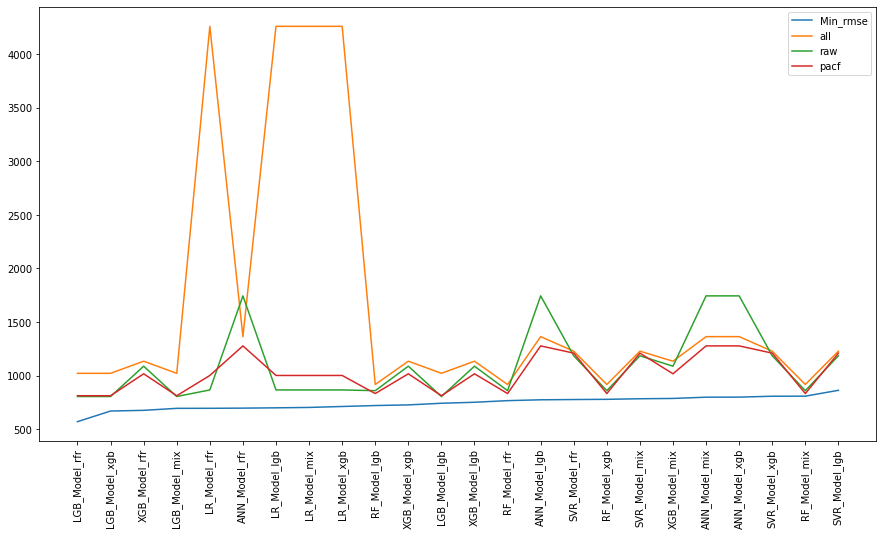

In [91]:
# plt.figure()
all_sort[['Min_rmse','all','raw','pacf']].plot(figsize=(15,8))
plt.xticks(range(0,len(all_sort.index),1),all_sort.index,rotation=90)
plt.savefig("./pic/RMSE/AirQuality/Compare.png")
plt.show()

### 画图

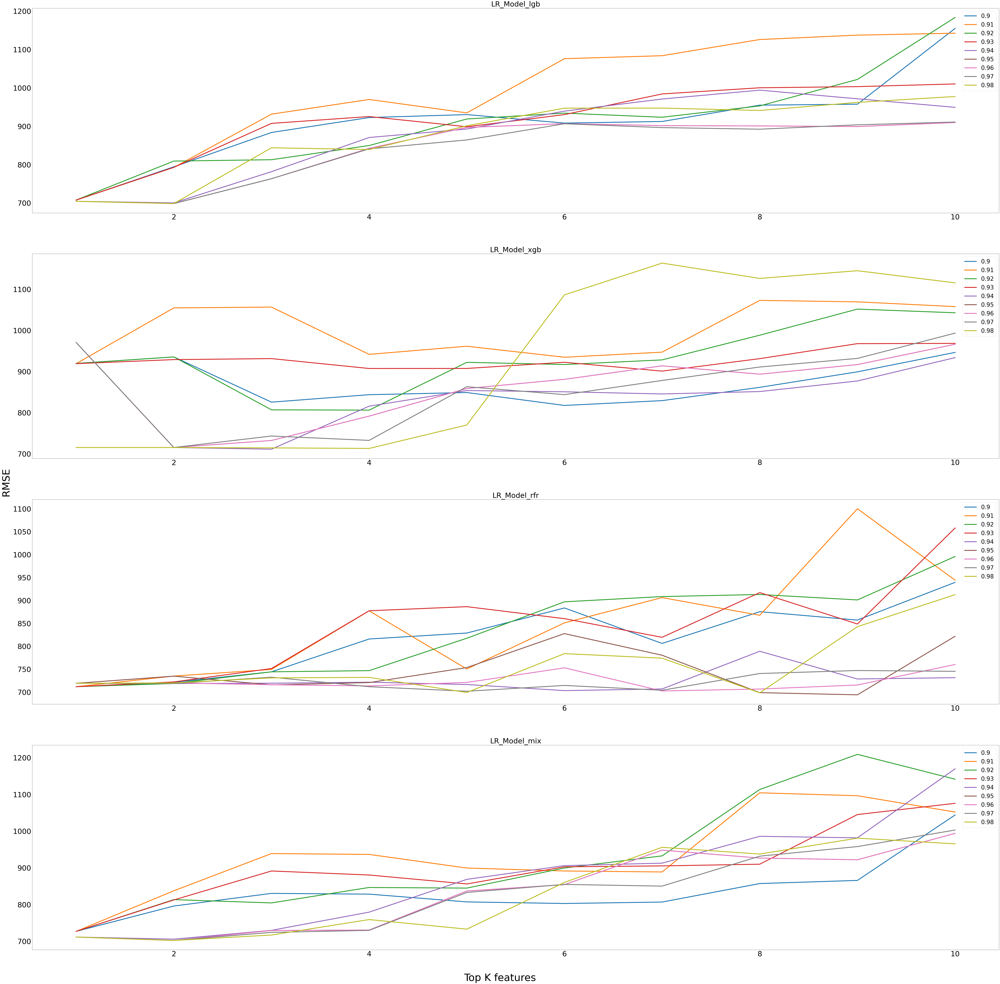

In [92]:
fig,ax = plt.subplots(len(linear_df),1,figsize=(120,120))
for order,k in zip(range(len(linear_df)),linear_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(linear_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(linear_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/AirQuality/Linear.png')

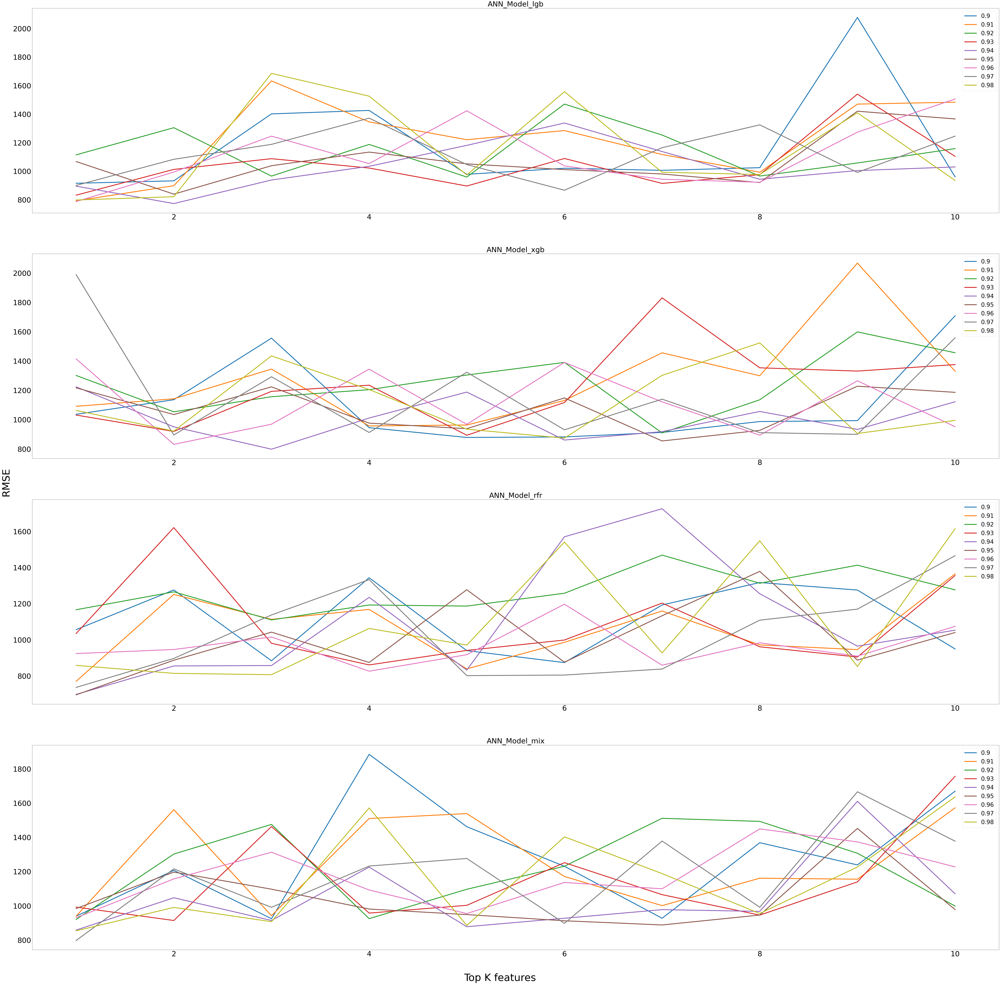

In [93]:
fig,ax = plt.subplots(len(ANN_df),1,figsize=(120,120))
for order,k in zip(range(len(ANN_df)),ANN_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(ANN_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(ANN_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/AirQuality/ANN.png')

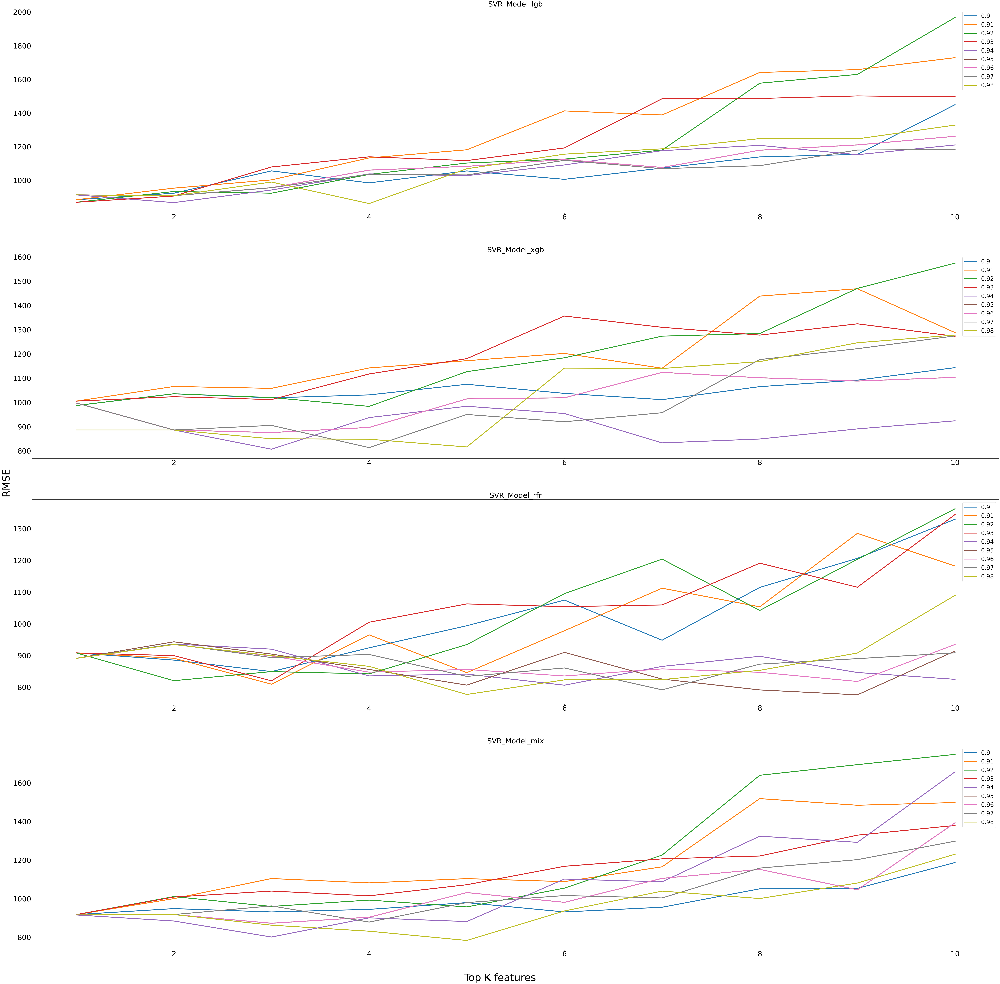

In [94]:
fig,ax = plt.subplots(len(SVR_df),1,figsize=(120,120))
for order,k in zip(range(len(SVR_df)),SVR_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(SVR_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(SVR_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/AirQuality/SVR.png')

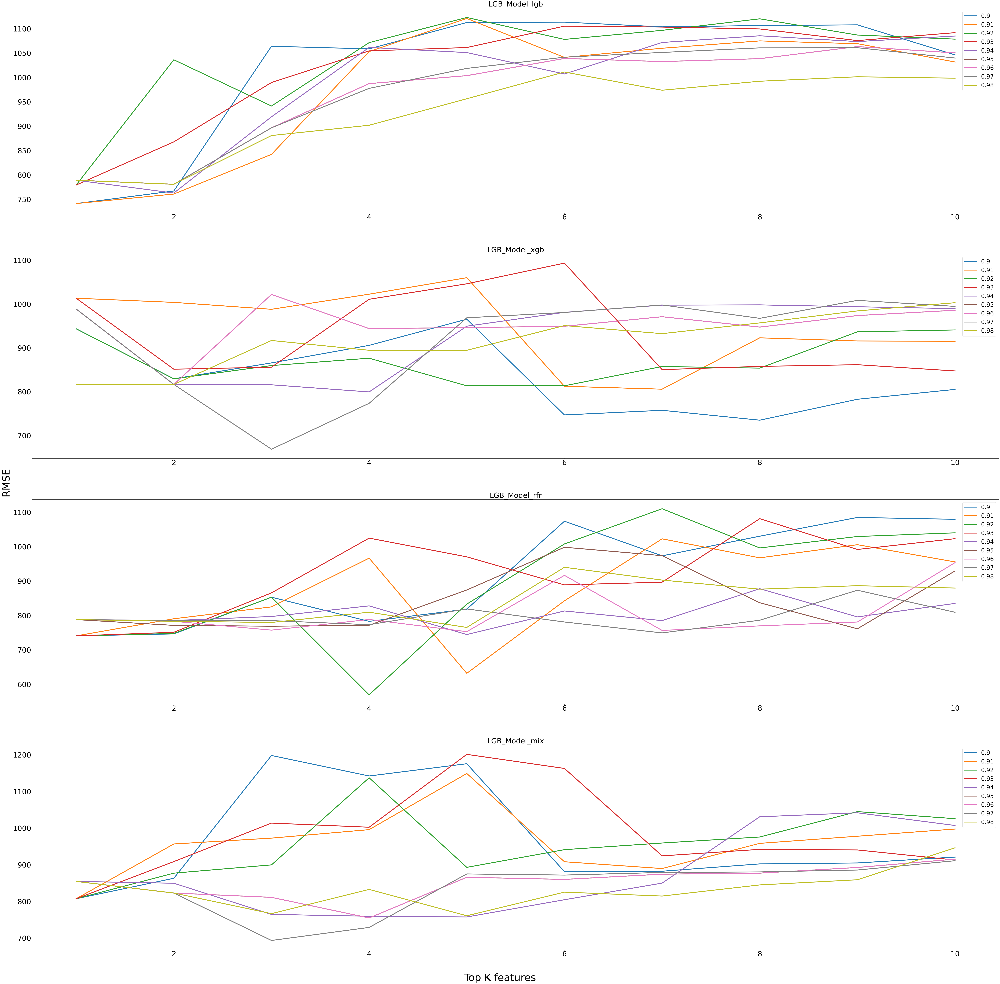

In [95]:
fig,ax = plt.subplots(len(LGB_df),1,figsize=(120,120))
for order,k in zip(range(len(LGB_df)),LGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(LGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(LGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/AirQuality/LGB.png')

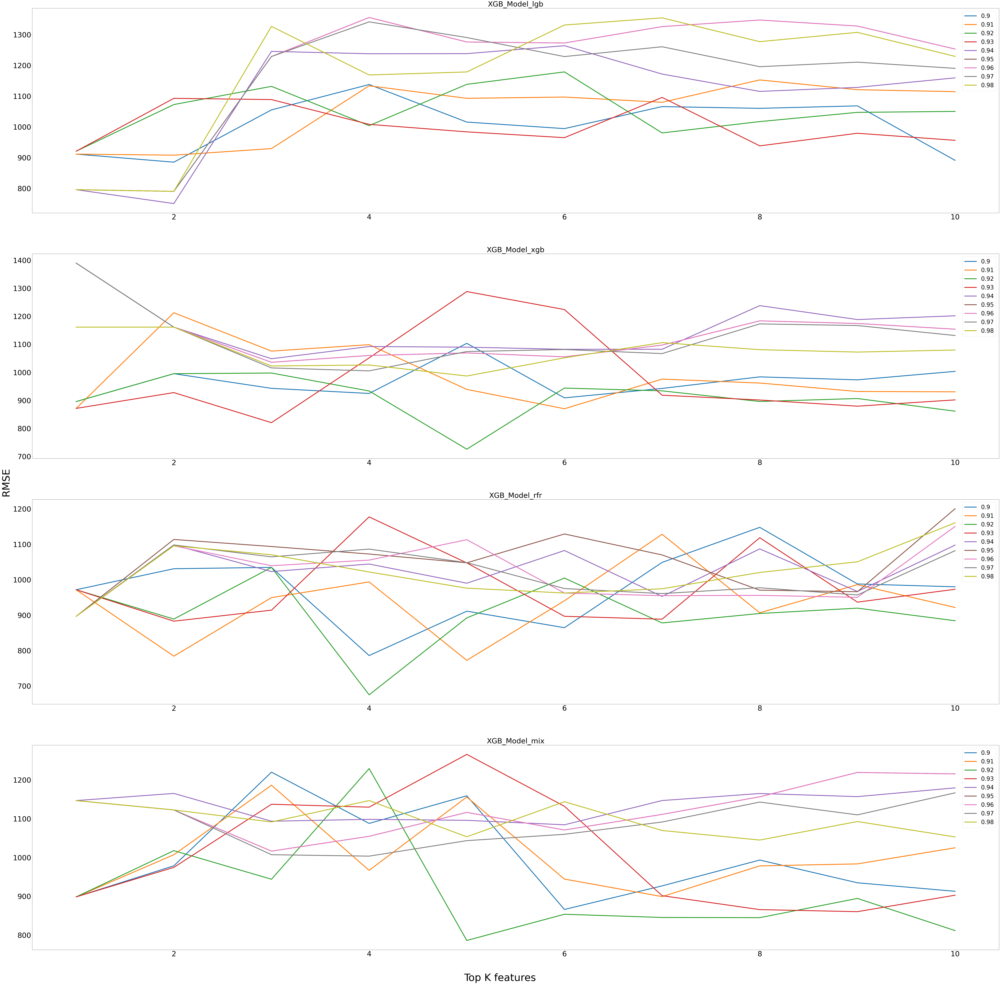

In [96]:
fig,ax = plt.subplots(len(XGB_df),1,figsize=(120,120))
for order,k in zip(range(len(XGB_df)),XGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(XGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(XGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/AirQuality/XGB.png')

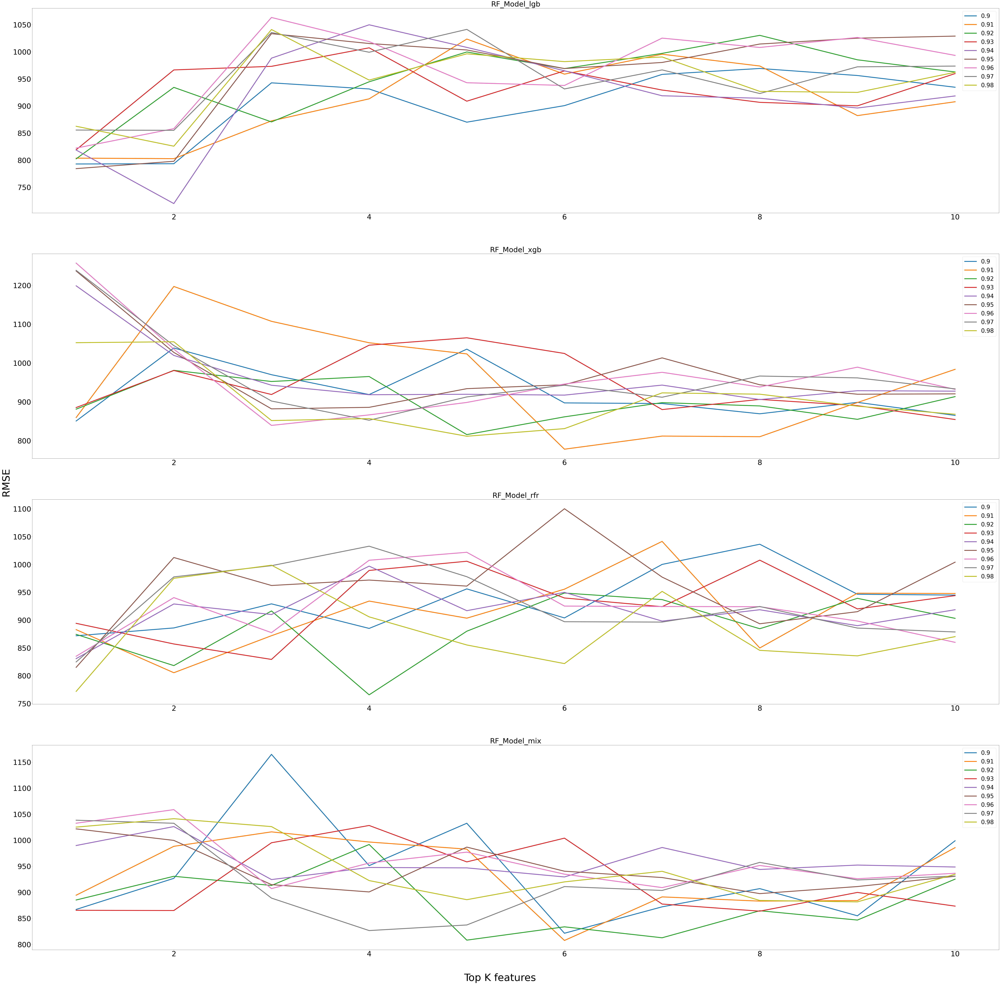

In [97]:
fig,ax = plt.subplots(len(RF_df),1,figsize=(120,120))
for order,k in zip(range(len(RF_df)),RF_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(RF_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(RF_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/AirQuality/RF.png')

In [98]:
def LGB_plot(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    y_df = pd.DataFrame({
        'Actual':y_gbm_inverse.reshape(-1,),
        'Predicted':y_test_inverse.reshape(-1,)
    },index=Y_test.index)
    print(r2_score(y_gbm_inverse.reshape(-1,),y_test_inverse.reshape(-1,)))
    plt.figure(figsize=(15,8))
    plt.xticks(range(0,len(y_df.index),10),rotation=45)
    plt.plot(y_df['Actual'],label='Actual')
    plt.plot(y_df['Predicted'],linestyle='dashdot',label='Predicted')
    plt.legend()
    plt.savefig("./pic/RMSE/AirQuality/Final_prediction.png")
    return y_df

In [736]:
Y_test_lag.index

Index(['2010-02-16', '2010-02-17', '2010-02-18', '2010-02-19', '2010-02-20',
       '2010-02-21', '2010-02-22', '2010-02-23', '2010-02-24', '2010-02-25',
       ...
       '2010-11-16', '2010-11-17', '2010-11-18', '2010-11-19', '2010-11-20',
       '2010-11-21', '2010-11-22', '2010-11-23', '2010-11-24', '2010-11-25'],
      dtype='object', name='date_time', length=283)

0.2587688156214616


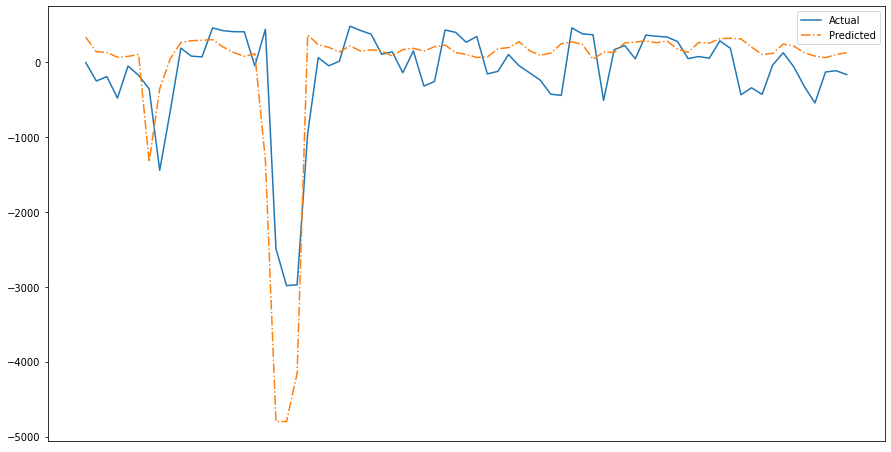

In [99]:
yy = LGB_plot(X_train_lag[real_rfr[0.92][4]],Y_train_lag,X_test_lag[real_rfr[0.92][4]],Y_test_lag)